In [ ]:
%run scripts/verify_environment.py

verify_environment()

In [ ]:
from datetime import datetime
from getpass import getpass

rdm_url = 'https://bh.rdm.yzwlab.com'
idp_name_1 = None
idp_username_1 = None
idp_password_1 = None
rdm_project_name = 'TEST-{}'.format(datetime.now().strftime('%Y%m%d-%H%M%S'))
target_storage_name = 'NII Storage'
target_storage_id = 'osfstorage'
target_file_view = 'file-tab' # or 'project-dashboard'
too_large_file_upload_size = None # GB
enable_1gb_file_upload = False
skip_130mb_upload = False
delete_project = True
default_result_path = None
close_on_fail = False
transition_timeout = 60000
skip_preview_check = True

In [3]:
if idp_username_1 is None:
    idp_username_1 = input(prompt=f'Username for {idp_name_1}')
if idp_password_1 is None:
    idp_password_1 = getpass(prompt=f'Password for {idp_username_1}@{idp_name_1}')
(len(idp_username_1), len(idp_password_1))

(7, 16)

In [4]:
import tempfile

work_dir = tempfile.mkdtemp()
if default_result_path is None:
    default_result_path = work_dir
work_dir

'/tmp/tmp4z_fudq5'

In [5]:
assert target_file_view in ['project-dashboard', 'file-tab']

# GakuNinRDM 総合テスト [ストレージ共通-ファイル基本操作]

- サブシステム名: アドオン
- ページ/アドオン: *
- 機能分類: ストレージ制御確認
- シナリオ名: ファイルタブ/プロジェクトダッシュボード挙動確認(選択可能)
- 用意するテストデータ: URL一覧、アカウント(既存ユーザー1: GRDM), テスト対象ストレージ設定

## ウェブブラウザの新規プライベートウィンドウでGRDMトップページを表示する

GRDMトップページが表示されること

In [6]:
import importlib
import pandas as pd

import scripts.playwright
importlib.reload(scripts.playwright)

from scripts.playwright import *
from scripts import grdm

await init_pw_context(close_on_fail=close_on_fail, last_path=default_result_path)

('20251121-043743', '/tmp/tmprs3luue2')

## プロパティダイアログの期待値決定

`target_storage_id`（呼び出し元が指定する WaterButlerレベルの provider 識別子）に応じて、各ステップで使用するファイル/フォルダプロパティの期待値を決定する。

In [ ]:
import sys

# プロパティダイアログの期待値決定
# target_storage_id は WaterButlerレベルの provider 識別子。
# 機関ストレージは osfstorage として動作するため、呼び出し元で target_storage_id='osfstorage' を指定する。

if target_storage_id == 'osfstorage':
    expected_file_createtime = 'nonempty'
    expected_file_updatetime = 'nonempty'
    expected_file_updateby = 'nonempty'
    expected_folder_createtime = 'nonempty'
    expected_folder_updatetime = 'nonempty'
    expected_folder_updateby = 'empty'
elif target_storage_id in ['googledrive', 'onedrive']:
    expected_file_createtime = 'nonempty'
    expected_file_updatetime = 'nonempty'
    expected_file_updateby = 'empty'
    expected_folder_createtime = 'empty'
    expected_folder_updatetime = 'empty'
    expected_folder_updateby = 'empty'
elif target_storage_id in ['s3', 's3compat', 's3compatsigv4', 'dropbox', 'nextcloud']:
    expected_file_createtime = 'empty'
    expected_file_updatetime = 'nonempty'
    expected_file_updateby = 'empty'
    expected_folder_createtime = 'empty'
    expected_folder_updatetime = 'empty'
    expected_folder_updateby = 'empty'
else:
    print(
        f'[warn] プロパティ期待値が未定義: target_storage_id={target_storage_id!r}; '
        f'S3互換相当で進行します。',
        file=sys.stderr,
    )
    expected_file_createtime = 'empty'
    expected_file_updatetime = 'nonempty'
    expected_file_updateby = 'empty'
    expected_folder_createtime = 'empty'
    expected_folder_updatetime = 'empty'
    expected_folder_updateby = 'empty'

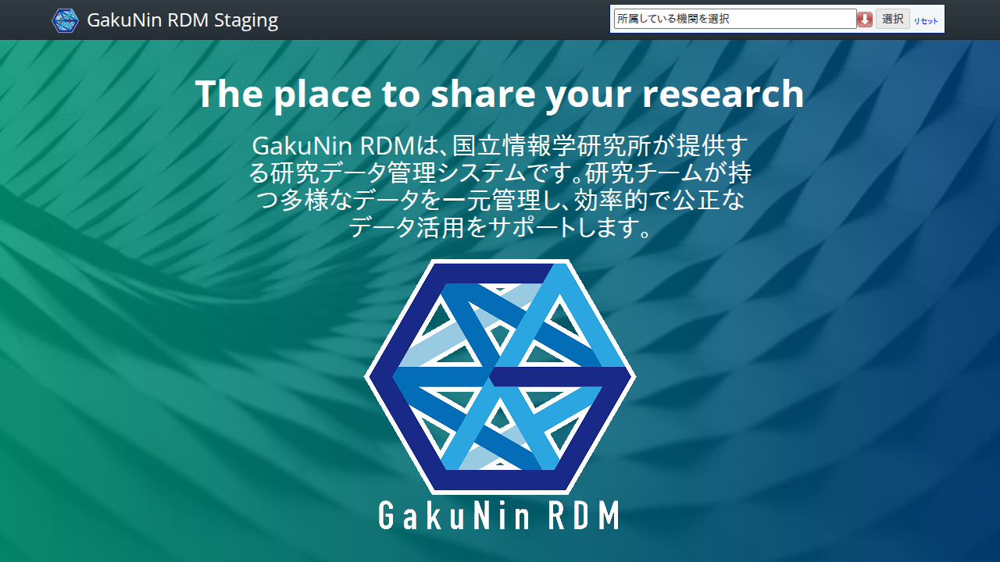

In [7]:
import time

async def _step(page):
    await page.goto(rdm_url)

    # 同意する ボタンが現れるまで待つ
    await expect(page.locator('//button[text() = "同意する"]')).to_be_visible(timeout=transition_timeout)

    # 同意する をクリック
    await page.locator('//button[text() = "同意する"]').click()

    # 同意する が表示されなくなったことを確認
    await expect(page.locator('//button[text() = "同意する"]')).to_have_count(0, timeout=500)

await run_pw(_step)

## ログイン情報を用いてGakuNin RDMにログインする

(IdPに関するログイン情報が与えられた場合、)
GakuNin Embeded DSのプルダウンを展開し、IdPリストから指定されたIdPを選択する。その後、アカウントのID/Passwordを入力して「Login」ボタンを押下する。

(IdPが指定されていない場合、)
CASのログイン操作を実施する。

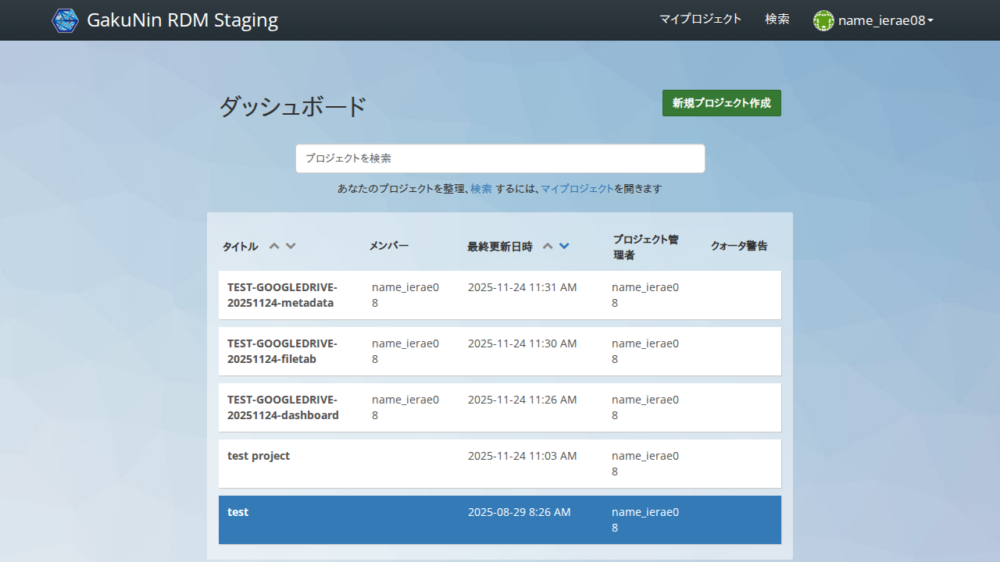

In [8]:
import scripts.grdm
importlib.reload(scripts.grdm)

async def _step(page):
    await scripts.grdm.login(
        page, idp_name_1, idp_username_1, idp_password_1, transition_timeout=transition_timeout
    )

    await scripts.grdm.expect_dashboard(page, transition_timeout=transition_timeout)

await run_pw(_step)

## プロジェクト一覧に指定されたタイトルのプロジェクトがない場合、指定された名前のプロジェクトを作成する

プロジェクト一覧に当該プロジェクト名が表示されていない場合、「新規プロジェクト作成」をクリックし、その名前を入力、「作成」をクリックする。

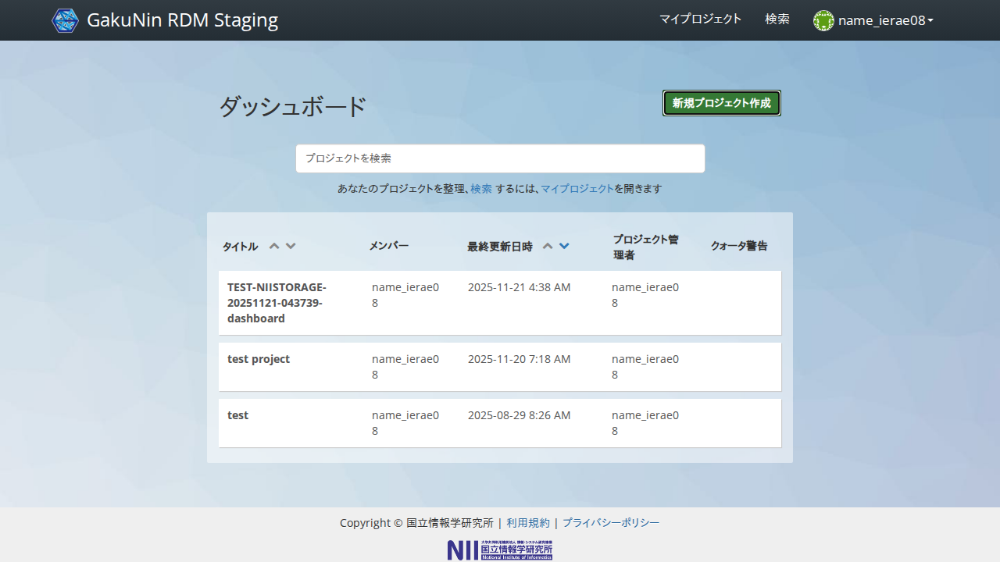

In [9]:
import scripts.grdm
importlib.reload(scripts.grdm)

async def _step(page):
    await expect(page.locator('//*[@data-test-create-project-modal-button]')).to_have_count(1)

    await scripts.grdm.ensure_project_exists(page, rdm_project_name, transition_timeout=transition_timeout)

await run_pw(_step)

## ダッシュボードのプロジェクト一覧から指定されたプロジェクトをクリックする

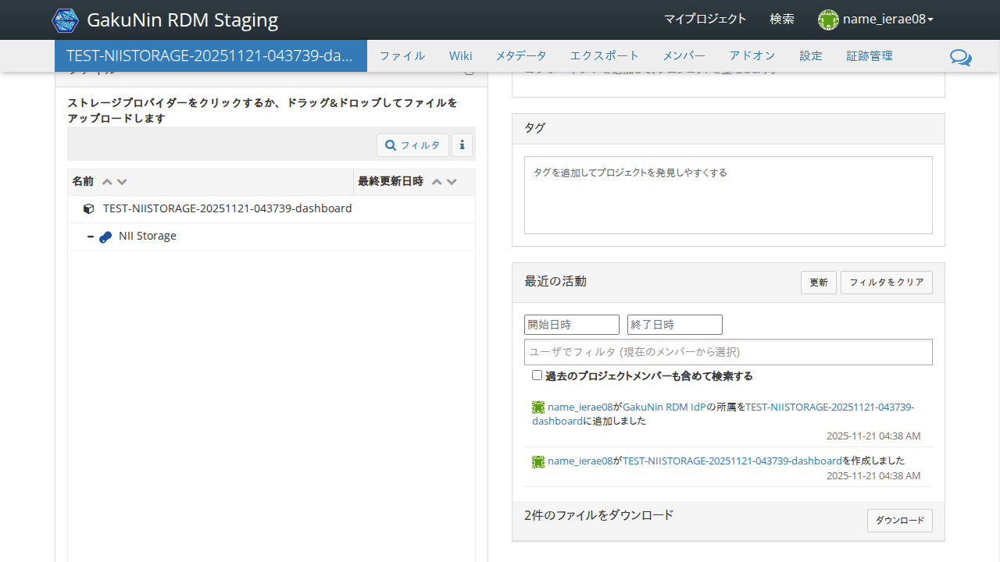

In [10]:
async def _step(page):
    await page.locator(f'//*[@data-test-dashboard-item-title and text()="{rdm_project_name}"]').click()        

    await expect(page.locator('//a[text() = "アドオン"]')).to_be_visible(timeout=transition_timeout)
    await expect(grdm.get_select_expanded_storage_title_locator(page, target_storage_name)).to_be_visible(timeout=transition_timeout)
    time.sleep(1)

    await page.locator('//h3[text()="最近の活動"]').click()

await run_pw(_step)

## (ファイルタブに対するテストの場合) 上部ツールバーの「ファイル」をクリックする

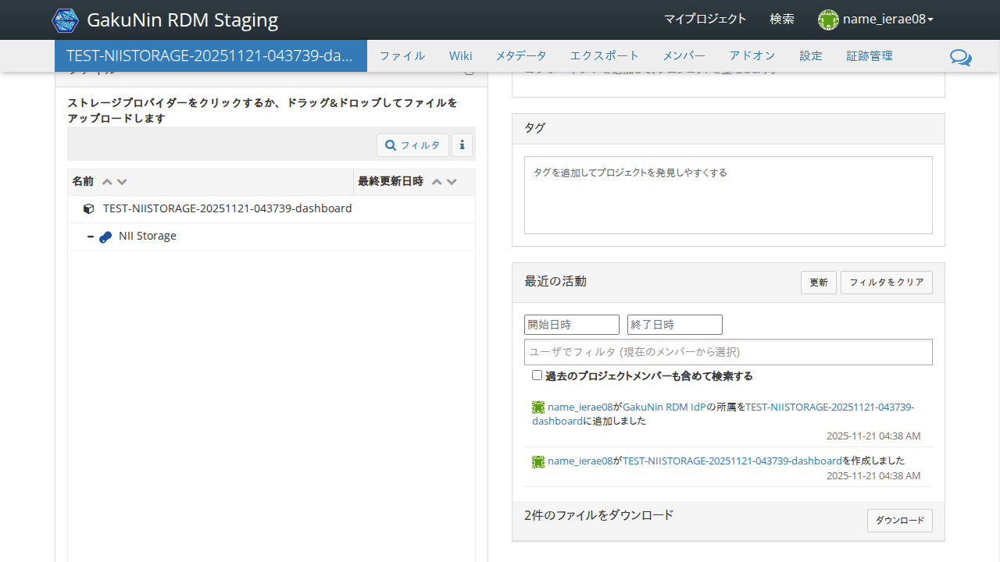

In [11]:
async def _step(page):
    if target_file_view != 'file-tab':
        return
    await page.locator('#projectNavFiles a').click()
    time.sleep(1)
    await expect(page.locator('//a[text() = "アドオン"]')).to_be_visible(timeout=transition_timeout)
    await expect(grdm.get_select_expanded_storage_title_locator(page, target_storage_name)).to_be_visible(timeout=transition_timeout)
    time.sleep(1)

    await expect(page.locator('//h3[text()="最近の活動"]')).not_to_be_visible()

await run_pw(_step)

## ファイル一覧の対象ストレージにファイル(1kB)をアップロードする

ファイルは "x" で埋められた1kBのファイルとする。

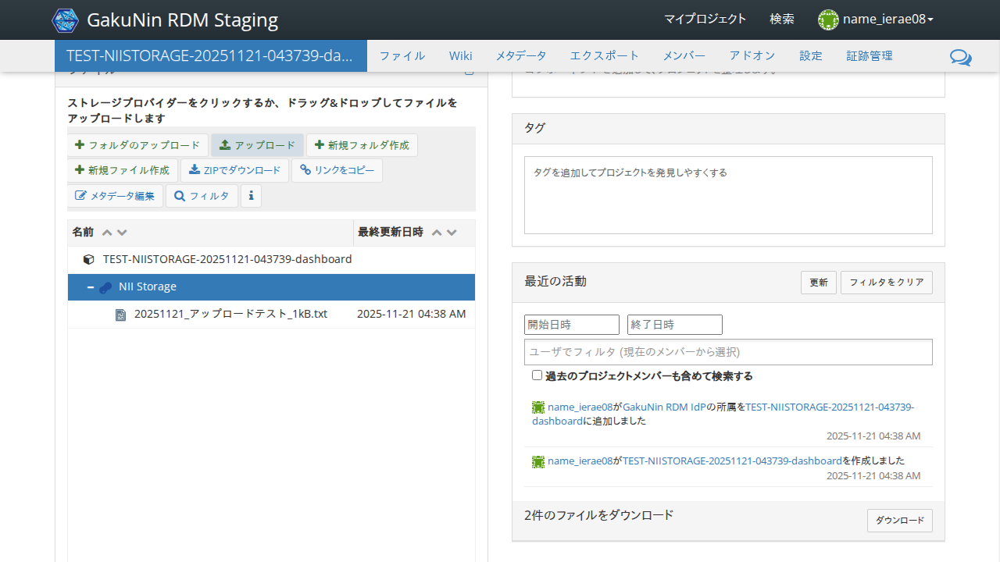

In [12]:
import scripts.grdm
importlib.reload(scripts.grdm)

import traceback
from datetime import datetime

# ファイルの作成
# x で埋められたファイルを生成
yyyymmdd = datetime.now().strftime('%Y%m%d')
filename = f'{yyyymmdd}_アップロードテスト_1kB.txt'
filepath = os.path.join(work_dir, filename)

with open(filepath, 'w') as f:
    for i in range(1000):
        f.write('x')

async def _step(page):
    try:
        await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(0)
    except:
        print(f'すでにファイルがあるのでスキップします: {filename}')
        traceback.print_exc()
        return

    await grdm.get_select_storage_title_locator(page, target_storage_name).click()
    await grdm.upload_file(page, filepath)
    time.sleep(2)

    await expect(page.locator(f'//*[text() = "{filename}"]/../following-sibling::*//*[@role = "progressbar"]')).to_have_count(0, timeout=transition_timeout)
    await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(1, timeout=transition_timeout)

await run_pw(_step)

## ファイル一覧の対象ストレージにファイル(130MB)をアップロードする



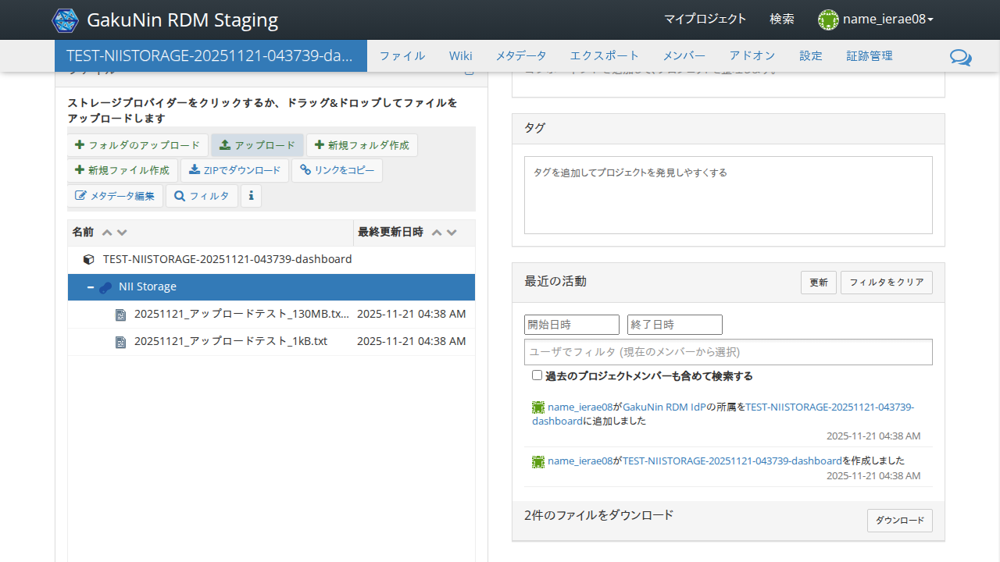

In [ ]:
# import scripts.grdm
# importlib.reload(scripts.grdm)

import traceback
from datetime import datetime

# ファイルの作成
filename = f'{yyyymmdd}_アップロードテスト_130MB.txt'
filepath = os.path.join(work_dir, filename)

!dd if=/dev/urandom of={filepath} bs=130M count=1

async def _step(page):
    if skip_130mb_upload:
        return
    try:
        await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(0)
    except:
        print(f'すでにファイルがあるのでスキップします: {filename}')
        traceback.print_exc()
        return

    await grdm.get_select_storage_title_locator(page, target_storage_name).click()
    await grdm.upload_file(page, filepath)
    time.sleep(2)

    await expect(page.locator(f'//*[text() = "{filename}"]/../following-sibling::*//*[@role = "progressbar"]')).to_have_count(0, timeout=transition_timeout * 10)
    await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(1, timeout=transition_timeout)

await run_pw(_step)

## (テスト対象ストレージの場合) ファイル一覧の対象ストレージにファイル(1GB)をアップロードする



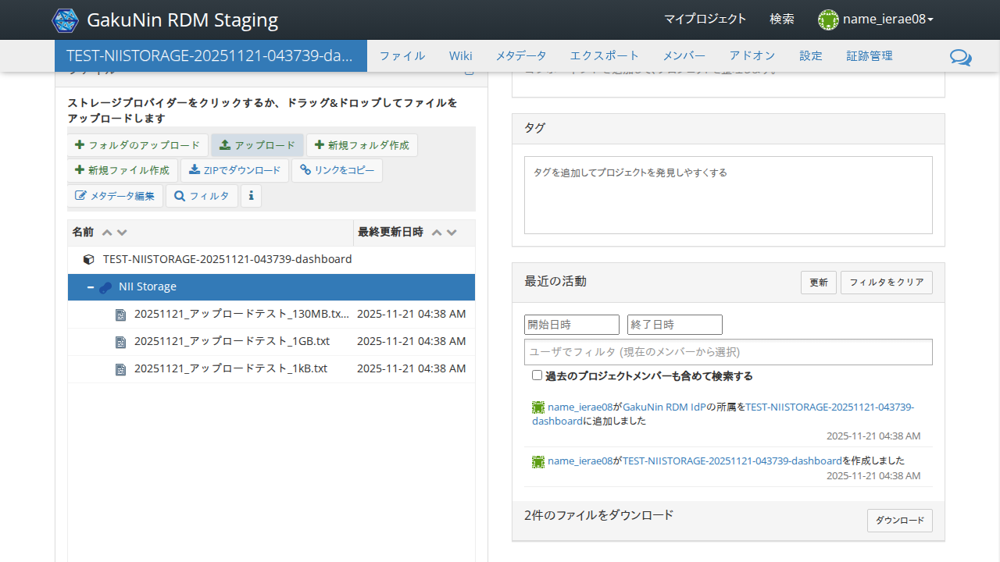

In [14]:
import traceback
from datetime import datetime

# ファイルの作成
filename = f'{yyyymmdd}_アップロードテスト_1GB.txt'
filepath = os.path.join(work_dir, filename)

if enable_1gb_file_upload:
    !dd if=/dev/urandom of={filepath} bs=1M count=1024

async def _step(page):
    if not enable_1gb_file_upload:
        return
    try:
        await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(0)
    except:
        print(f'すでにファイルがあるのでスキップします: {filename}')
        traceback.print_exc()
        return

    await grdm.get_select_storage_title_locator(page, target_storage_name).click()
    await grdm.upload_file(page, filepath)
    time.sleep(2)

    await expect(page.locator(f'//*[text() = "{filename}"]/../following-sibling::*//*[@role = "progressbar"]')).to_have_count(0, timeout=transition_timeout * 25)
    await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(1, timeout=transition_timeout)

await run_pw(_step)

## (テスト対象ストレージの場合) ファイル一覧の対象ストレージにファイル(60GB※)をアップロードする

※サイズは総合試験で利用する環境の最大ファイルサイズにより決定。

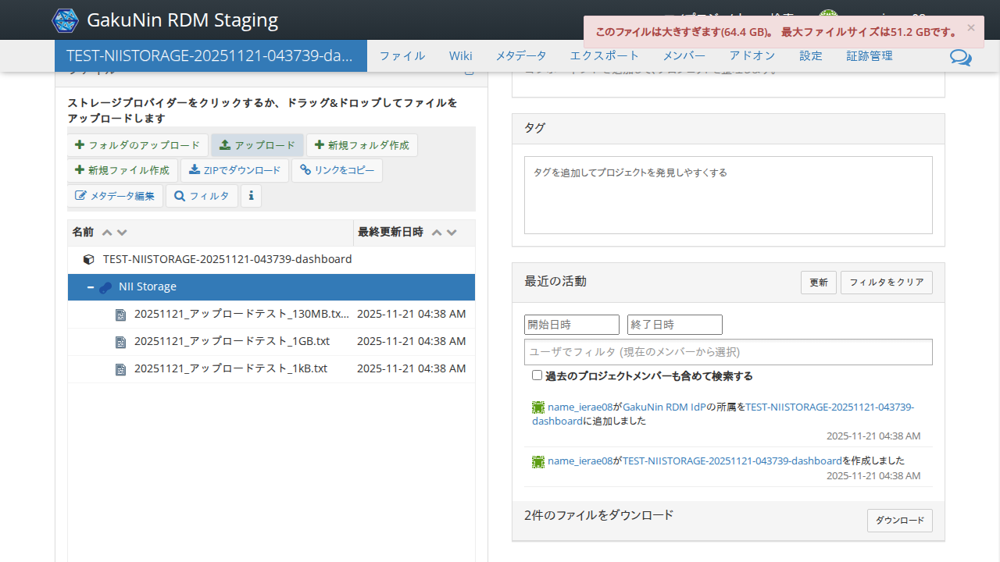

In [15]:
import traceback
from datetime import datetime

filename = f'{yyyymmdd}_アップロードテスト_{too_large_file_upload_size}GB.txt'
filepath = os.path.join(work_dir, filename)

if too_large_file_upload_size is not None:
    # ファイルの作成
    size_mb = too_large_file_upload_size * 1024
    !dd if=/dev/zero of={filepath} bs=1M count={size_mb}

async def _step(page):
    if too_large_file_upload_size is None:
        return
    try:
        await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(0)
    except:
        print(f'すでにファイルがあるのでスキップします: {filename}')
        traceback.print_exc()
        return

    await grdm.get_select_storage_title_locator(page, target_storage_name).click()
    await grdm.upload_file(page, filepath)
    time.sleep(1)

    await expect(page.locator(f'//*[text() = "{filename}"]/../following-sibling::*//*[@role = "progressbar"]')).to_have_count(0, timeout=transition_timeout * 25)
    await expect(page.locator('//*[contains(text(), "このファイルは大きすぎます")]')).to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## ファイル一覧から「ファイル(1kB)」のファイル名部分をクリックする

ファイルプレビュー画面が表示されること。この時のURLを控えておくこと。

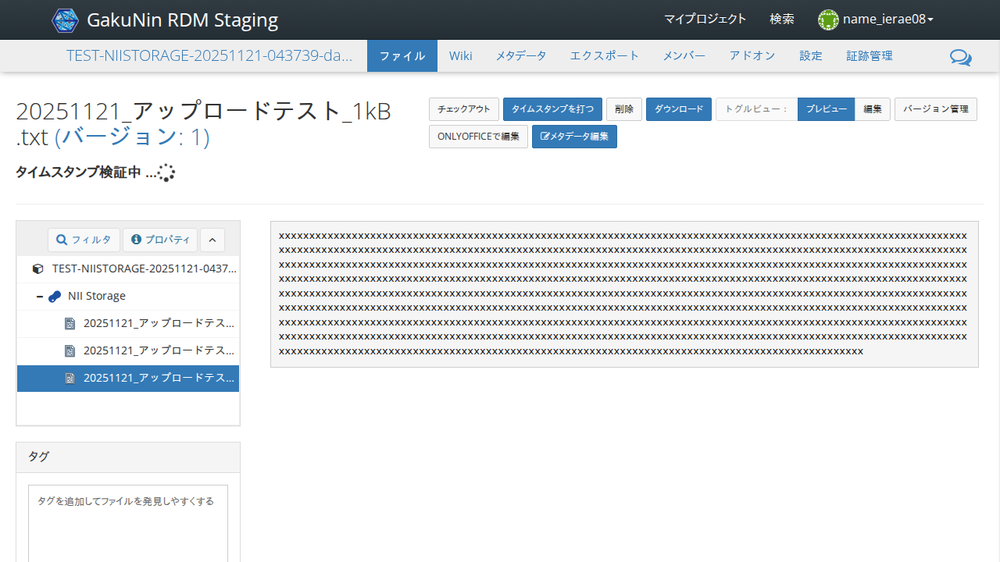

In [ ]:
filename = f'{yyyymmdd}_アップロードテスト_1kB.txt'

file_viewer_url = None

async def _step(page):
    await grdm.get_select_file_title_locator(page, filename).click(timeout=transition_timeout)
    time.sleep(1)

    filename_body, filename_ext = os.path.splitext(filename)
    await expect(page.locator(f'//h2[contains(text(), "{filename_body}")]//*[@id = "file-ext"]')).to_have_text(filename_ext, timeout=transition_timeout)

    if not skip_preview_check:
        await expect(page.locator(f'//iframe[contains(@src, "/render")]').content_frame.locator('//pre')).to_have_text('x' * 1000, timeout=transition_timeout * 5)
    
    global file_viewer_url
    file_viewer_url = page.url
    print(f'file_viewer_url: {file_viewer_url}')
await run_pw(_step)

## ブラウザの戻るをクリックし、「リンクをコピー」をクリックし、ナビゲーションバーに貼り付けてアクセスする

ファイルプレビュー画面が表示されること。この時、ナビゲーションバーのURLが前述のURLと同じであること

In [ ]:
import asyncio

async def _step(page):
    await page.go_back()

    await grdm.get_select_file_extension_locator(page, filename).click(timeout=transition_timeout)
    await asyncio.sleep(1)

    await mock_clipboard(page)
    await page.locator('//i[contains(@class, "fa-link")]/../*[text() = "リンクをコピー"]').click()

    clipboard_content = await get_mocked_clipboard_text(page)
    print(f'clipboard_content: {clipboard_content}')

    await page.goto(clipboard_content)
    filename_body, filename_ext = os.path.splitext(filename)
    await expect(page.locator(f'//h2[contains(text(), "{filename_body}")]//*[@id = "file-ext"]')).to_have_text(filename_ext, timeout=transition_timeout)

    if not skip_preview_check:
        await expect(page.locator(f'//iframe[contains(@src, "/render")]').content_frame.locator('//pre')).to_have_text('x' * 1000, timeout=transition_timeout * 5)

    assert file_viewer_url == page.url, (f'file_viewer_url: {file_viewer_url}, current url: {page.url}')

await run_pw(_step)

## (テスト対象ストレージの場合) ブラウザの戻るをクリックし、ファイル一覧から「ファイル(1GB)」の行のファイル名以外の部分をクリックする

削除ボタンが表示されること。

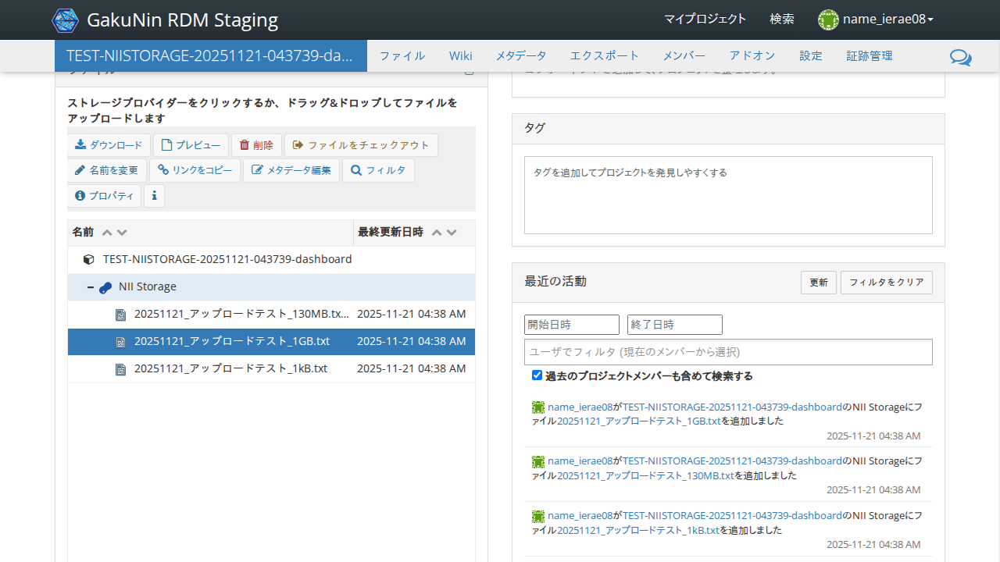

In [17]:
filename = f'{yyyymmdd}_アップロードテスト_1GB.txt'

async def _step(page):
    await page.go_back()
    if not enable_1gb_file_upload:
        return
    await expect(grdm.get_select_file_title_locator(page, filename)).to_be_visible(timeout=transition_timeout)
    await grdm.get_select_file_extension_locator(page, filename).click()

    await expect(page.locator('//i[contains(@class, "fa-trash")]/../*[text() = "削除"]')).to_be_enabled()

await run_pw(_step)

## (テスト対象ストレージの場合) ファイル一覧の上部メニューから「削除」をクリックする

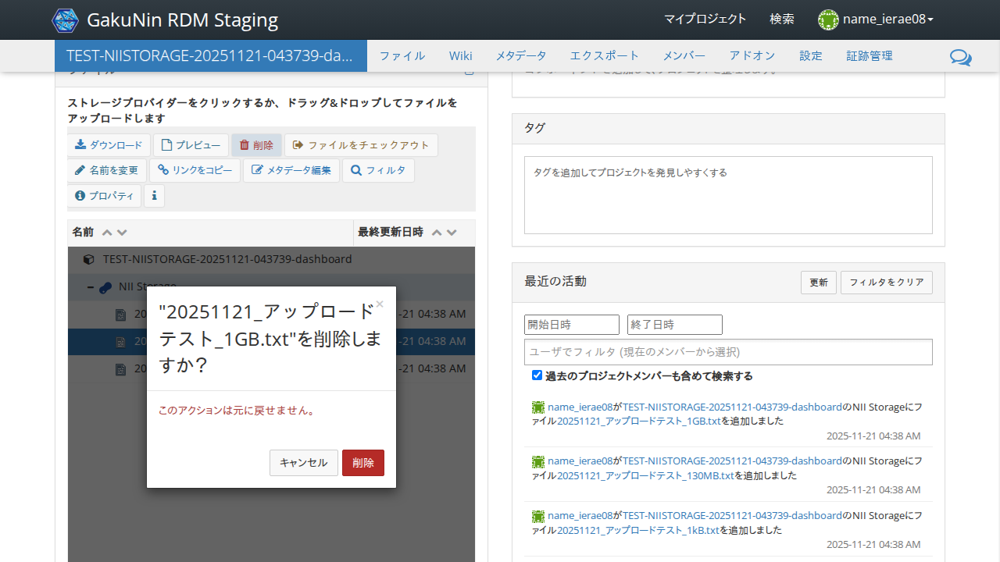

In [18]:
async def _step(page):
    if not enable_1gb_file_upload:
        return
    await page.locator('//i[contains(@class, "fa-trash")]/../*[text() = "削除"]').click()
    await expect(page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[contains(@class, "btn-danger")]')).to_be_enabled(timeout=transition_timeout)
    time.sleep(1)

await run_pw(_step)

## (テスト対象ストレージの場合) ダイアログから「削除」をクリックする

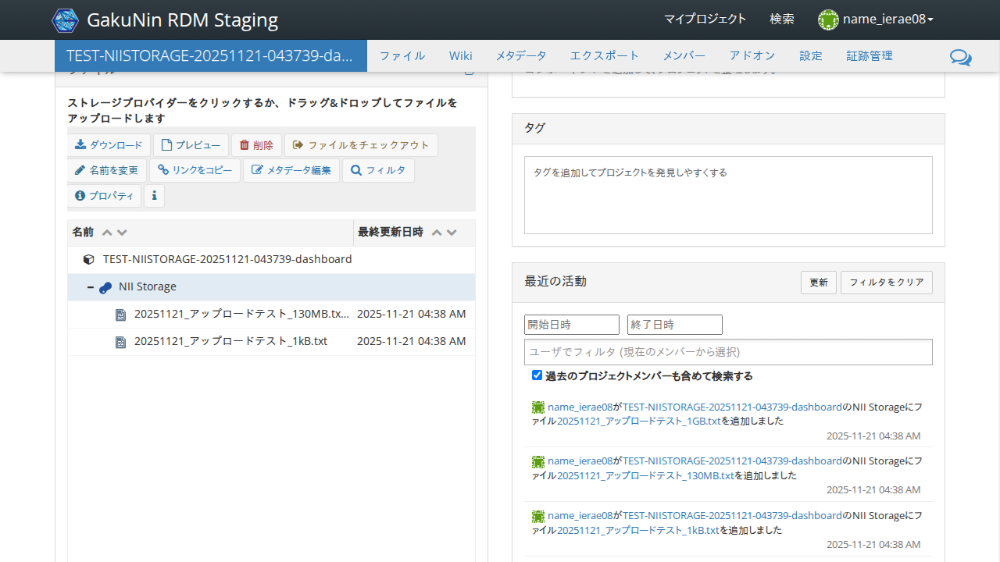

In [19]:
async def _step(page):
    if not enable_1gb_file_upload:
        return
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[contains(@class, "btn-danger")]').click()
    await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(0, timeout=transition_timeout)
    time.sleep(1)

await run_pw(_step)

## ファイル一覧から「ファイル(130MB)」の行のファイル名以外の部分をクリックする

削除ボタンが表示されること。

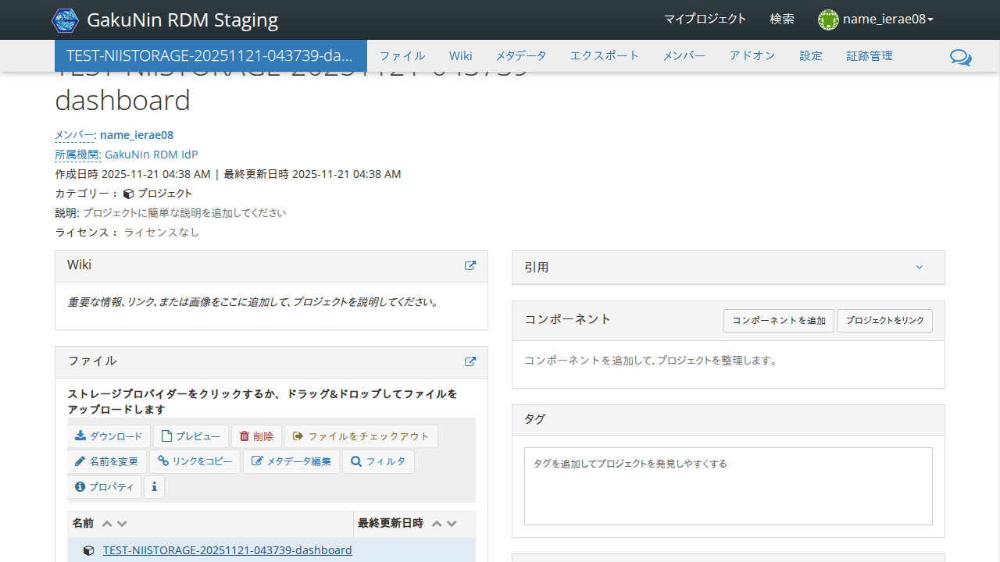

In [ ]:
filename = f'{yyyymmdd}_アップロードテスト_130MB.txt'

async def _step(page):
    if skip_130mb_upload:
        return
    await expect(grdm.get_select_file_title_locator(page, filename)).to_be_visible(timeout=transition_timeout)
    await grdm.get_select_file_extension_locator(page, filename).click()

    await expect(page.locator('//i[contains(@class, "fa-pencil")]/../*[text() = "名前を変更"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「名前を変更」をクリックする

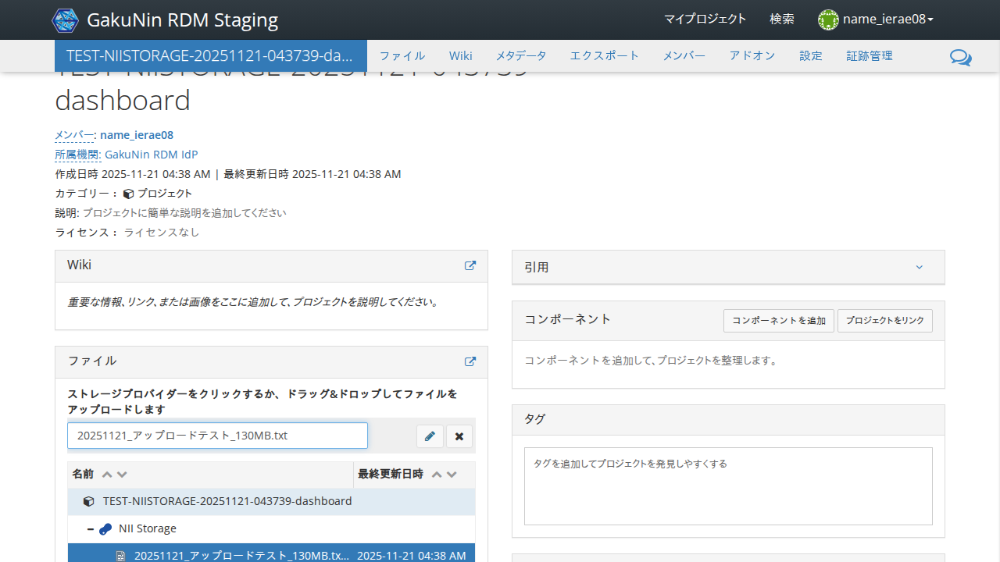

In [ ]:
async def _step(page):
    if skip_130mb_upload:
        return
    await page.locator('//i[contains(@class, "fa-pencil")]/../*[text() = "名前を変更"]').click()

    await expect(page.locator('#renameInput')).to_be_editable()

await run_pw(_step)

## テキスト入力フォームの内容を「yyyymmdd_アップロードテスト_変更_130MB.txt」に編集してEnterキーを押下する

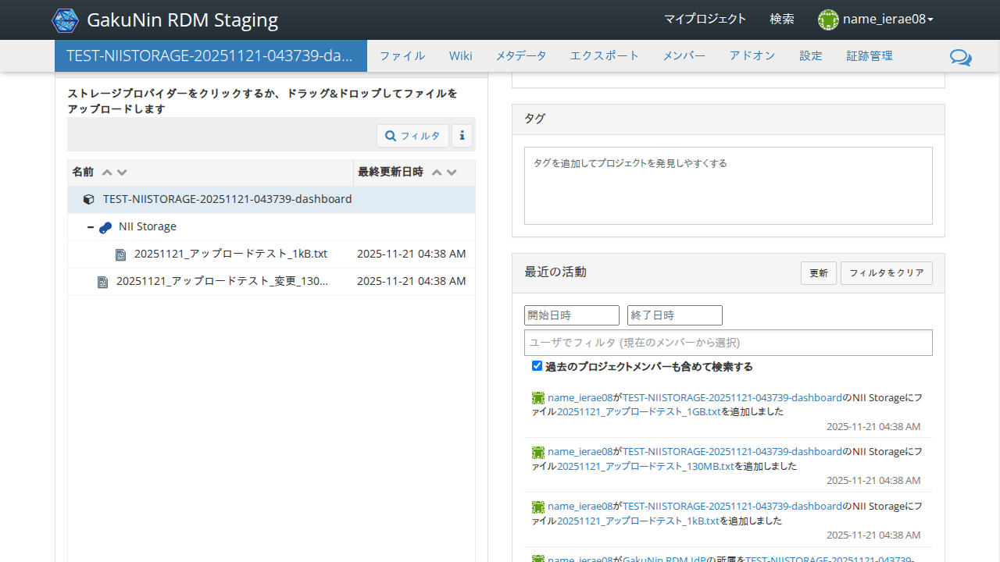

In [ ]:
filename = f'{yyyymmdd}_アップロードテスト_130MB.txt'
new_filename = f'{yyyymmdd}_アップロードテスト_変更_130MB.txt'

async def _step(page):
    if skip_130mb_upload:
        return
    rename_input = page.locator('#renameInput')
    await rename_input.fill(new_filename)
    await rename_input.press('Enter')
    await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(0, timeout=transition_timeout)
    await grdm.get_select_file_title_locator(page, new_filename).scroll_into_view_if_needed()
    await expect(grdm.get_select_file_title_locator(page, new_filename)).to_be_visible(timeout=transition_timeout)

    filepath = os.path.join(work_dir, filename)
    new_filepath = os.path.join(work_dir, new_filename)
    os.rename(filepath, new_filepath)

await run_pw(_step)

## ファイル一覧の対象ストレージ名の行をクリックする

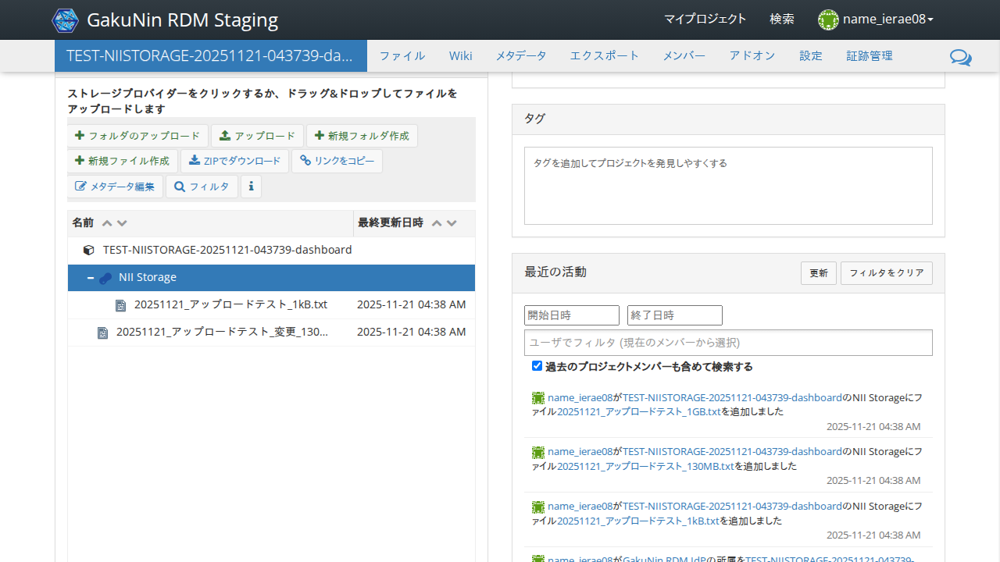

In [23]:
async def _step(page):
    await grdm.get_select_storage_title_locator(page, target_storage_name).click()
    await expect(page.locator('//i[contains(@class, "fa-plus")]/../*[text() = "新規フォルダ作成"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「新規フォルダ作成」をクリックする

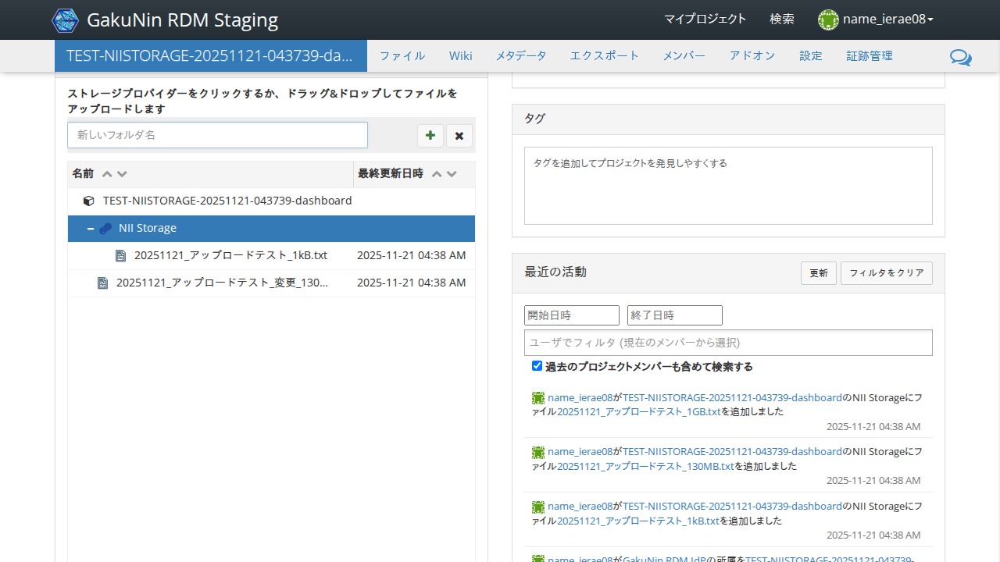

In [24]:
async def _step(page):
    await page.locator('//i[contains(@class, "fa-plus")]/../*[text() = "新規フォルダ作成"]').click()
    await expect(page.locator('#createFolderInput')).to_be_editable()

await run_pw(_step)

## テキスト入力フォームに「yyyymmdd_フォルダ1」に入力してEnterキーを押下する



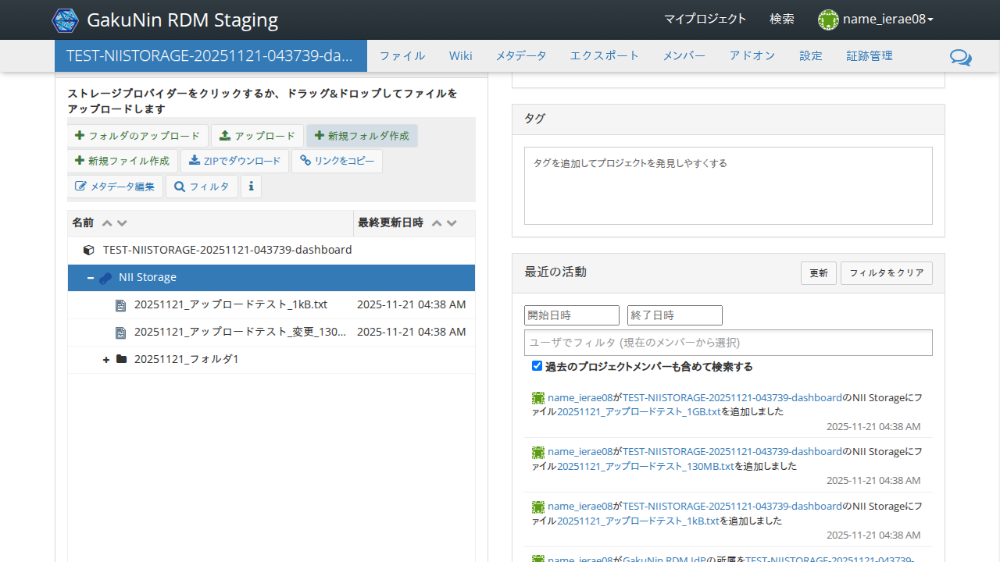

In [25]:
new_foldername = f'{yyyymmdd}_フォルダ1'

async def _step(page):
    create_folder_input = page.locator('#createFolderInput')
    await create_folder_input.fill(new_foldername)
    await create_folder_input.press('Enter')
    await grdm.get_select_folder_title_locator(page, new_foldername).scroll_into_view_if_needed()
    await expect(grdm.get_select_folder_title_locator(page, new_foldername)).to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## ファイル一覧から「ファイル(1kB)」の行をクリックしたまま「フォルダ1」へとマウスカーソルを移動させる

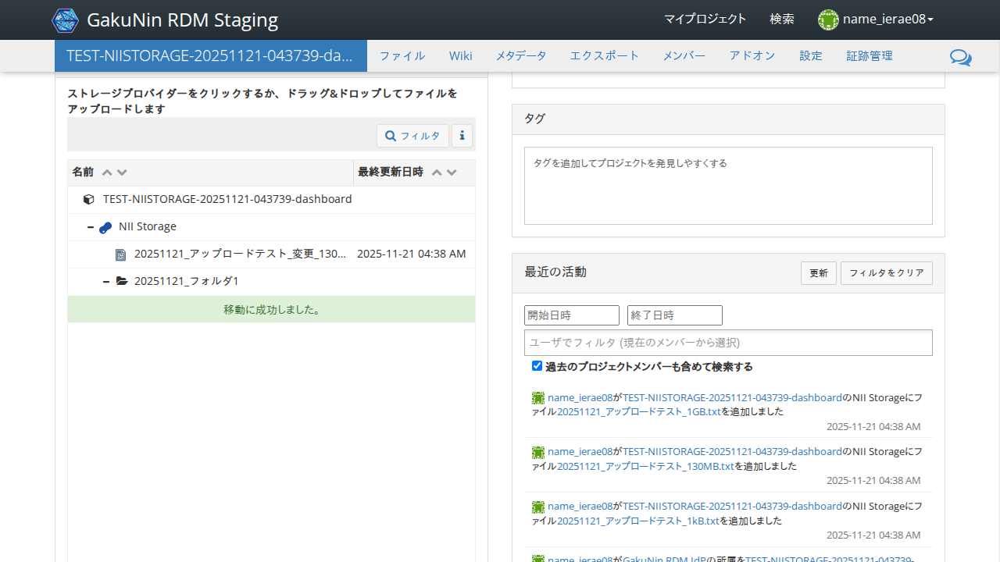

In [26]:
import re
import scripts.grdm
importlib.reload(scripts.grdm)

filename = f'{yyyymmdd}_アップロードテスト_1kB.txt'

async def _step(page):
    await grdm.get_select_file_extension_locator(page, filename).click()
    source = grdm.get_select_file_draggable_locator(page, filename)
    dest = grdm.get_select_folder_droppable_locator(page, new_foldername)

    await grdm.drag_and_drop(page, source, dest)

    await expect(page.locator('//*[contains(text(), "移動に成功しました")]')).to_be_visible(timeout=transition_timeout * 5)

await run_pw(_step)

## ファイル一覧から「フォルダ1」の行のファイル名以外の部分をクリックする

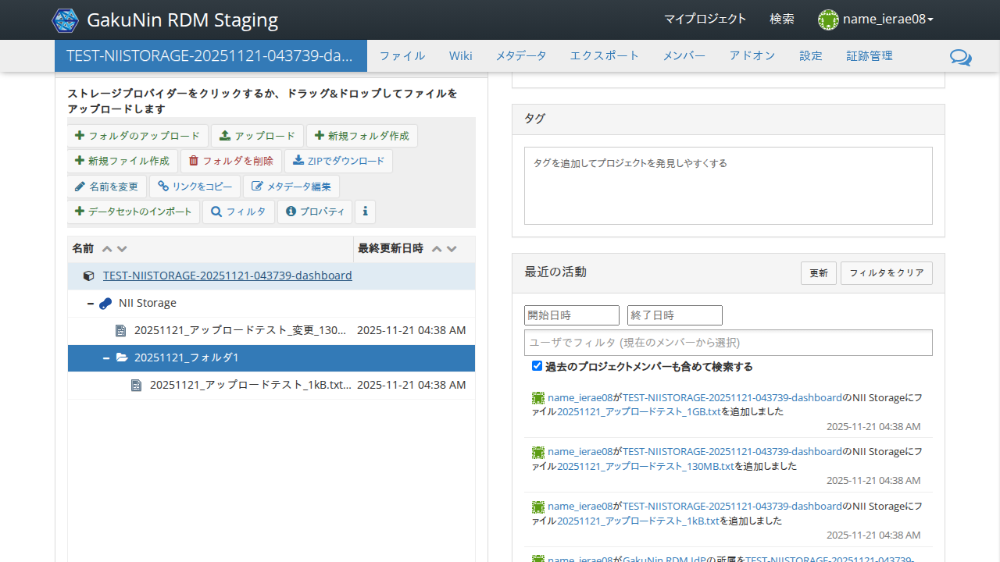

In [27]:
new_foldername = f'{yyyymmdd}_フォルダ1'

async def _step(page):
    await expect(grdm.get_select_folder_title_locator(page, new_foldername)).to_be_visible(timeout=transition_timeout)
    await grdm.get_select_folder_title_locator(page, new_foldername).click()

    await expect(page.locator('//i[contains(@class, "fa-download")]/../*[text() = "ZIPでダウンロード"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「ZIPでダウンロード」をクリックする

ZIPファイルには「ファイル(1kB)」が圧縮されていること。

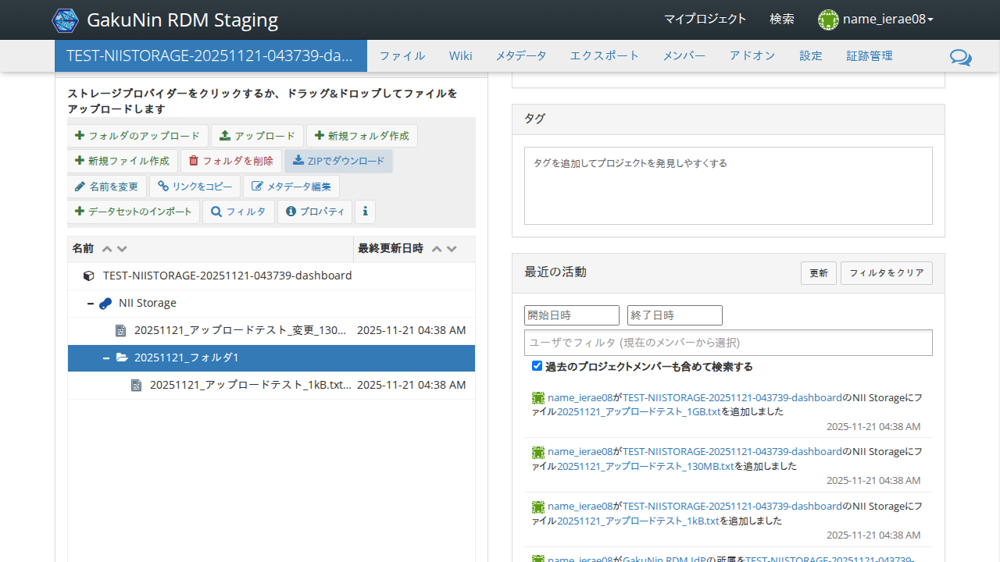

In [28]:
import zipfile

async def _step(page):
    await grdm.get_select_folder_title_locator(page, f'{yyyymmdd}_フォルダ1').click()

    async with page.expect_download() as download_info:
        await page.locator('//i[contains(@class, "fa-download")]/../*[text() = "ZIPでダウンロード"]').click()
    download = await download_info.value
    download_dir = os.path.join(work_dir, 'downloaded')
    os.makedirs(download_dir, exist_ok=True)
    zip_path = os.path.join(download_dir, download.suggested_filename)
    await download.save_as(zip_path)

    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        assert zip_ref.namelist() == [f'{yyyymmdd}_アップロードテスト_1kB.txt'], zip_ref.namelist()

await run_pw(_step)

In [29]:
!ls -la {work_dir}/downloaded
!unzip -l {work_dir}/downloaded/{yyyymmdd}_フォルダ1.zip

## ファイル一覧の対象ストレージ名の行をクリックする

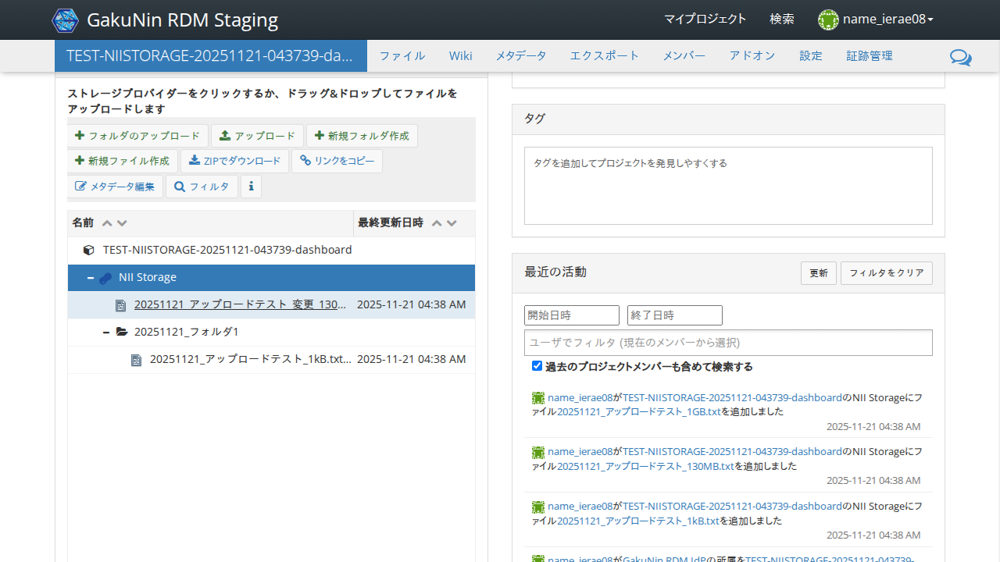

In [30]:
async def _step(page):
    await grdm.get_select_storage_title_locator(page, target_storage_name).click()
    await expect(page.locator('//i[contains(@class, "fa-plus")]/../*[text() = "新規フォルダ作成"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「新規フォルダ作成」をクリックする

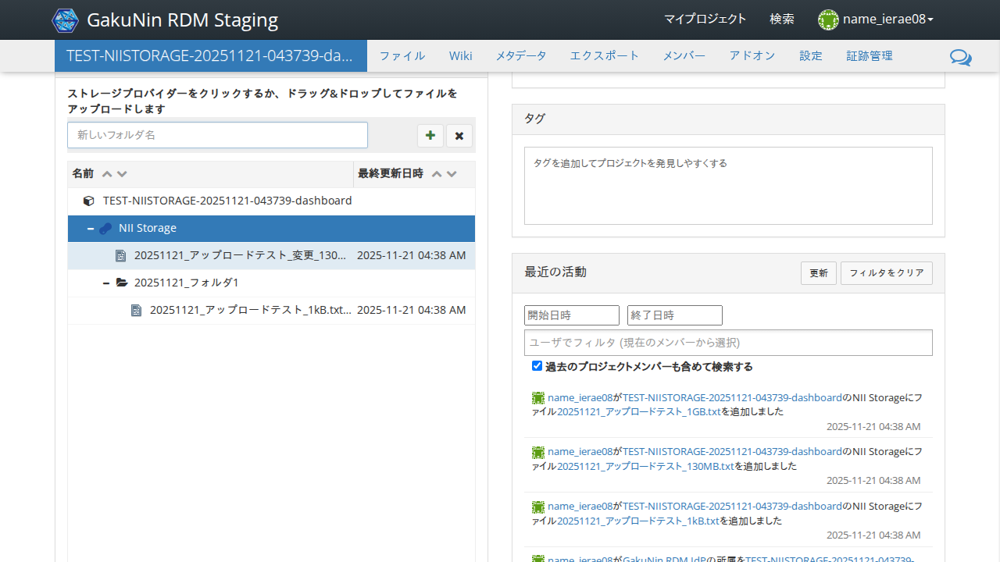

In [31]:
async def _step(page):
    await page.locator('//i[contains(@class, "fa-plus")]/../*[text() = "新規フォルダ作成"]').click()
    await expect(page.locator('#createFolderInput')).to_be_editable()

await run_pw(_step)

## テキスト入力フォームに「yyyymmdd_フォルダ2」に入力してEnterキーを押下する



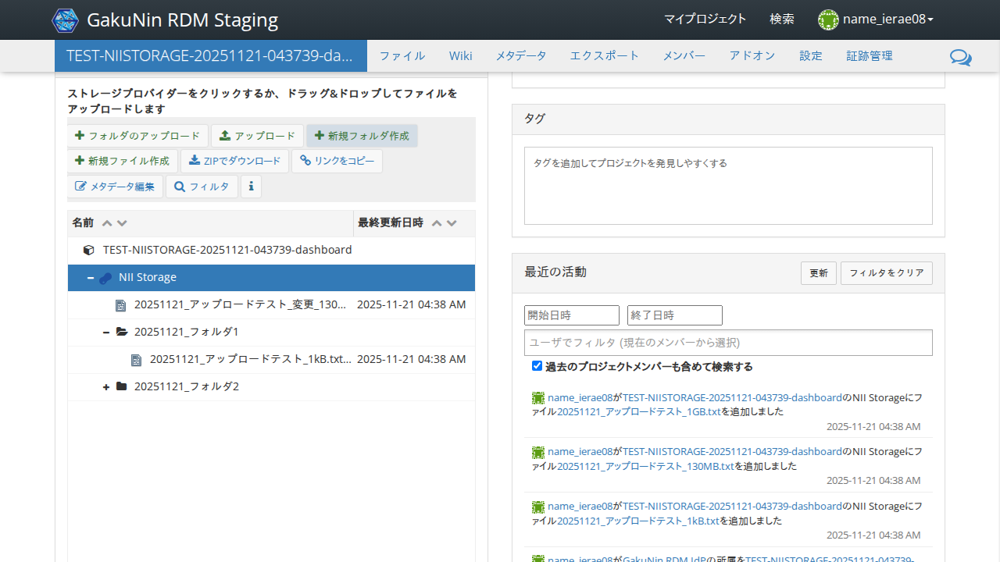

In [32]:
new_foldername = f'{yyyymmdd}_フォルダ2'

async def _step(page):
    create_folder_input = page.locator('#createFolderInput')
    await create_folder_input.fill(new_foldername)
    await create_folder_input.press('Enter')
    await expect(scripts.grdm.get_select_folder_title_locator(page, new_foldername)).to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## 「フォルダ1」をドラッグし、「フォルダ2」の行まで移動させマウスボタンを離す

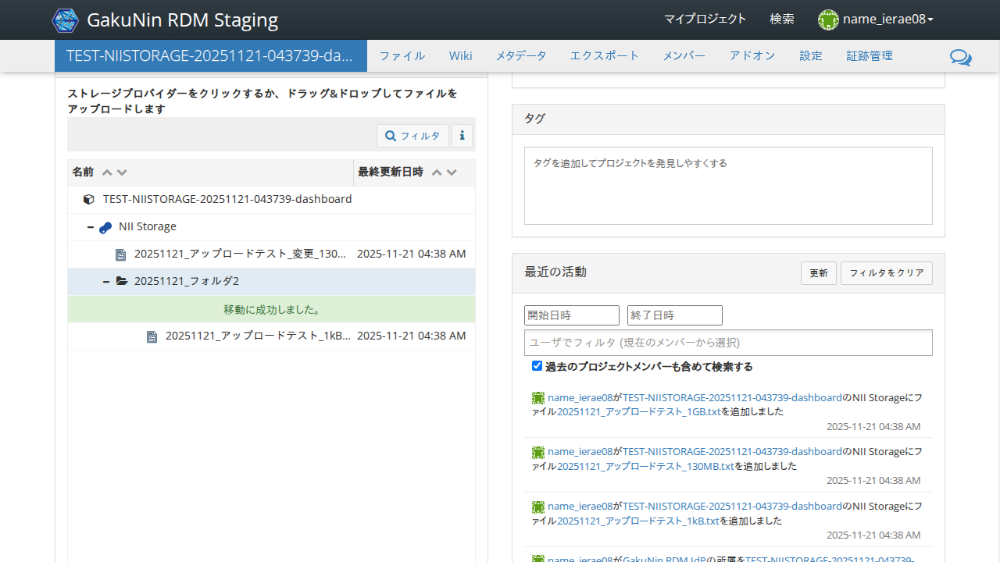

In [33]:
import scripts.grdm
importlib.reload(scripts.grdm)

async def _step(page):
    source = grdm.get_select_folder_draggable_locator(page, f'{yyyymmdd}_フォルダ1')
    await source.click()
    dest = grdm.get_select_folder_droppable_locator(page, f'{yyyymmdd}_フォルダ2')

    await grdm.drag_and_drop(page, source, dest)

    await expect(page.locator('//*[contains(text(), "移動に成功しました")]')).to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## ファイル一覧から「フォルダ2」の行のファイル名以外の部分をクリックする

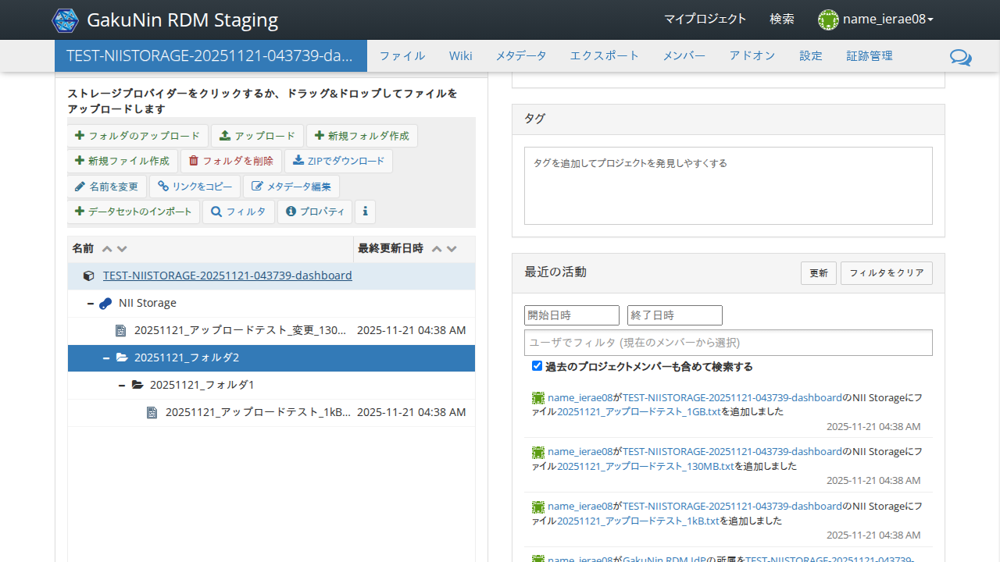

In [34]:
new_foldername = f'{yyyymmdd}_フォルダ2'

async def _step(page):
    await expect(grdm.get_select_folder_title_locator(page, new_foldername)).to_be_visible(timeout=transition_timeout)
    await grdm.get_select_folder_title_locator(page, new_foldername).click()

    await expect(page.locator('//i[contains(@class, "fa-download")]/../*[text() = "ZIPでダウンロード"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「ZIPでダウンロード」をクリックする

ZIPファイルには「ファイル(1kB)」が圧縮されていること。

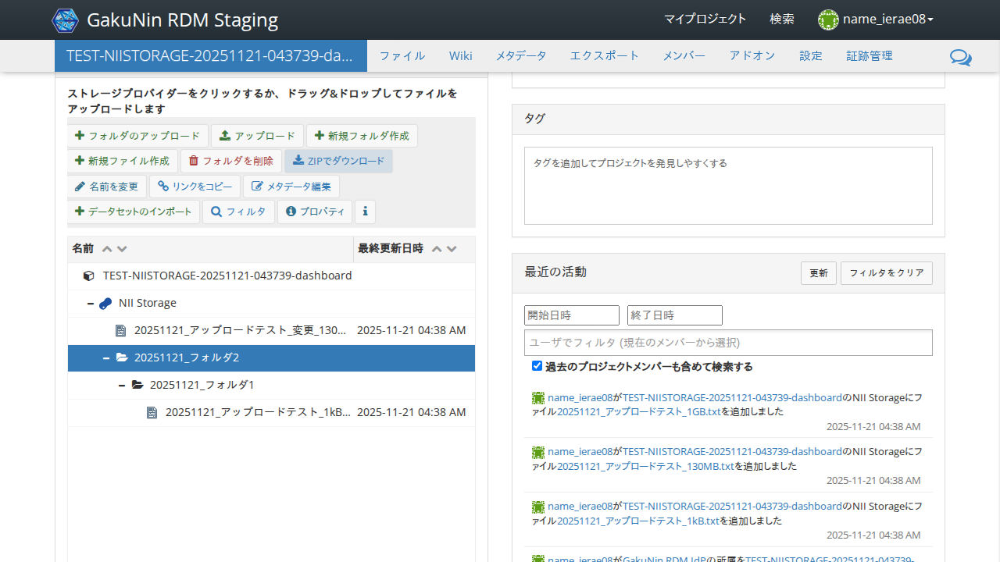

In [35]:
import zipfile

async def _step(page):
    await grdm.get_select_folder_title_locator(page, f'{yyyymmdd}_フォルダ2').click()

    async with page.expect_download() as download_info:
        await page.locator('//i[contains(@class, "fa-download")]/../*[text() = "ZIPでダウンロード"]').click()
    download = await download_info.value
    download_dir = os.path.join(work_dir, 'downloaded')
    os.makedirs(download_dir, exist_ok=True)
    zip_path = os.path.join(download_dir, download.suggested_filename)
    await download.save_as(zip_path)

    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        assert zip_ref.namelist() == [f'{yyyymmdd}_フォルダ1/{yyyymmdd}_アップロードテスト_1kB.txt'], zip_ref.namelist()

await run_pw(_step)

In [36]:
!ls -la {work_dir}/downloaded
!unzip -l {work_dir}/downloaded/{yyyymmdd}_フォルダ2.zip

## ファイル一覧から「フォルダ1」の行のファイル名以外の部分をクリックする

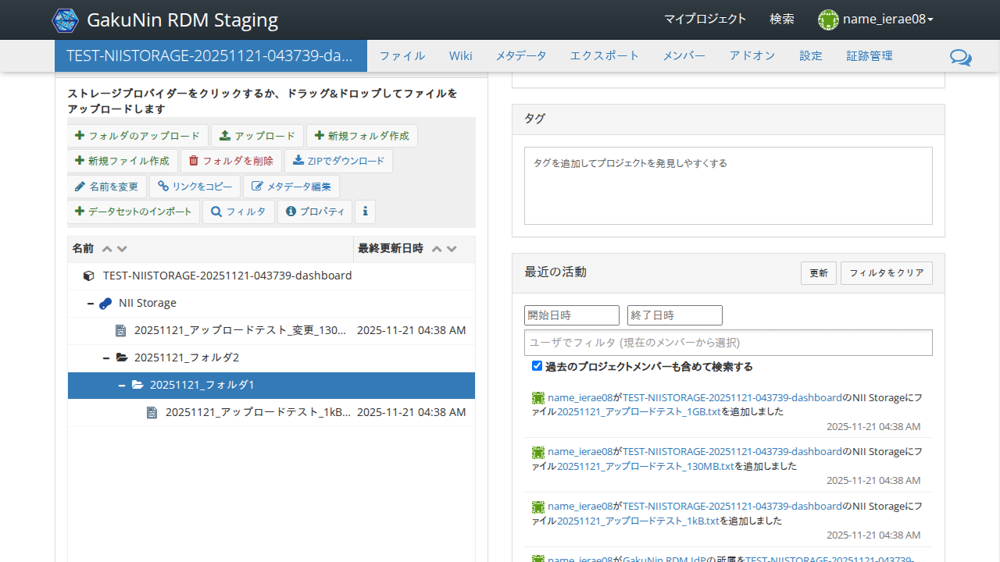

In [37]:
new_foldername = f'{yyyymmdd}_フォルダ1'

async def _step(page):
    await expect(grdm.get_select_folder_title_locator(page, new_foldername)).to_be_visible(timeout=transition_timeout)
    await grdm.get_select_folder_title_locator(page, new_foldername).click()

    await expect(page.locator('//i[contains(@class, "fa-pencil")]/../*[text() = "名前を変更"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「名前を変更」をクリックする

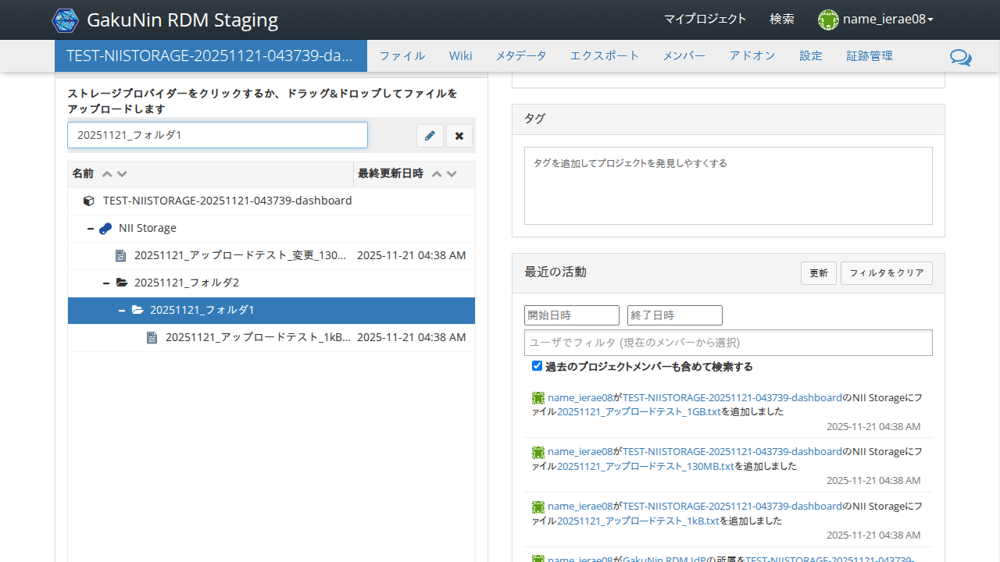

In [38]:
async def _step(page):
    await page.locator('//i[contains(@class, "fa-pencil")]/../*[text() = "名前を変更"]').click()

    await expect(page.locator('#renameInput')).to_be_editable()

await run_pw(_step)

## テキスト入力フォームの内容を「yyyymmdd_変更_フォルダ1」に編集してEnterキーを押下する

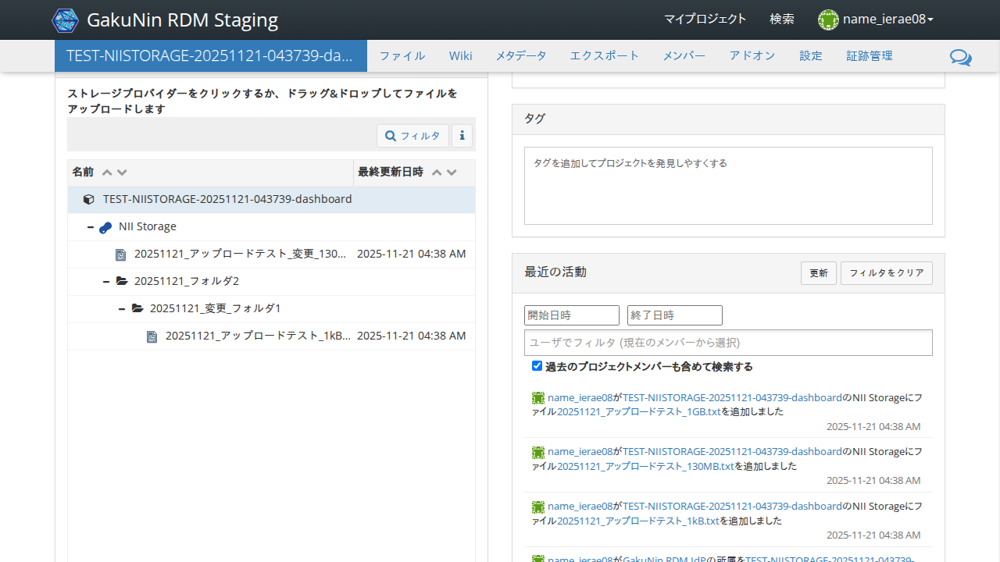

In [39]:
new_foldername = f'{yyyymmdd}_変更_フォルダ1'

async def _step(page):
    rename_input = page.locator('#renameInput')
    await rename_input.fill(new_foldername)
    await rename_input.press('Enter')
    await expect(grdm.get_select_folder_title_locator(page, f'{yyyymmdd}_フォルダ1')).to_have_count(0, timeout=transition_timeout)
    await expect(grdm.get_select_folder_title_locator(page, new_foldername)).to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## ファイル一覧から「フォルダ2」の行のファイル名以外の部分をクリックする

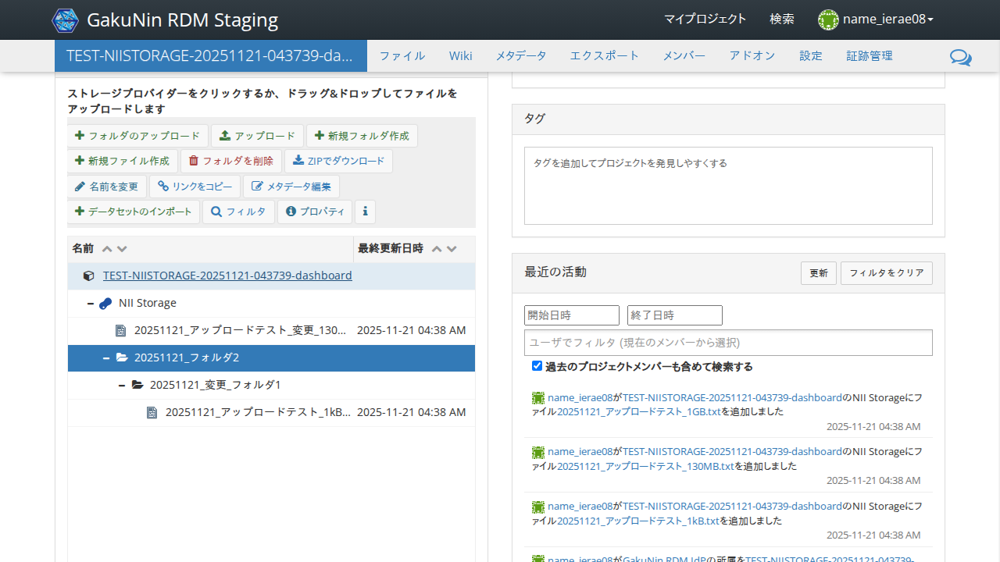

In [40]:
new_foldername = f'{yyyymmdd}_フォルダ2'

async def _step(page):
    await expect(grdm.get_select_folder_title_locator(page, new_foldername)).to_be_visible(timeout=transition_timeout)
    await grdm.get_select_folder_title_locator(page, new_foldername).click()

    await expect(page.locator('//i[contains(@class, "fa-link")]/../*[text() = "リンクをコピー"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「リンクをコピー」をクリックする

`rdm_url` から始まるURLが取得されること。

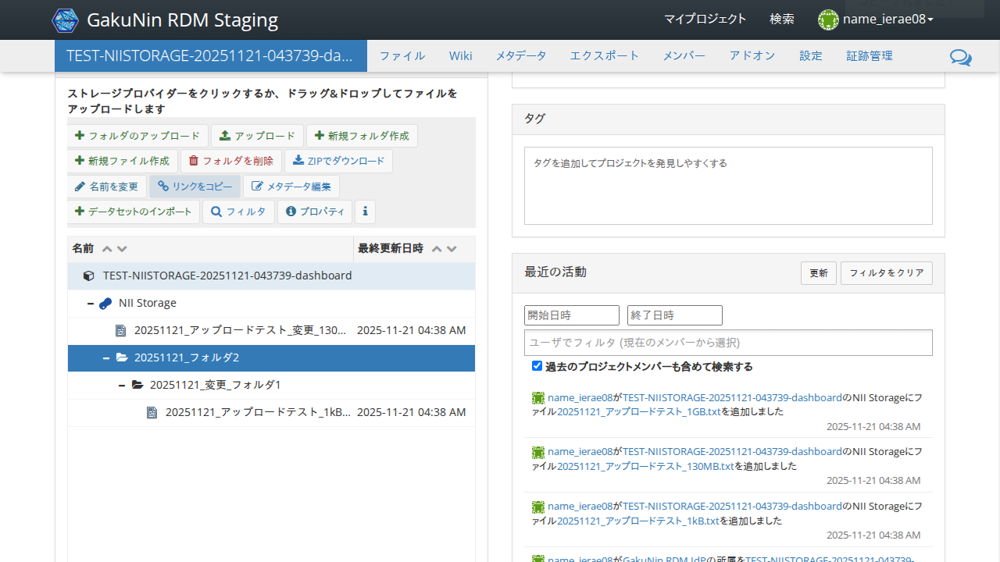

In [ ]:
from urllib.parse import urljoin

async def _step(page):
    await mock_clipboard(page)
    await page.locator('//i[contains(@class, "fa-link")]/../*[text() = "リンクをコピー"]').click()

    clipboard_content = await get_mocked_clipboard_text(page)

    assert clipboard_content.startswith(rdm_url) and '/files/dir/' in clipboard_content, clipboard_content

await run_pw(_step)

## ファイル一覧から「フォルダ2」の行のファイル名以外の部分をクリックする

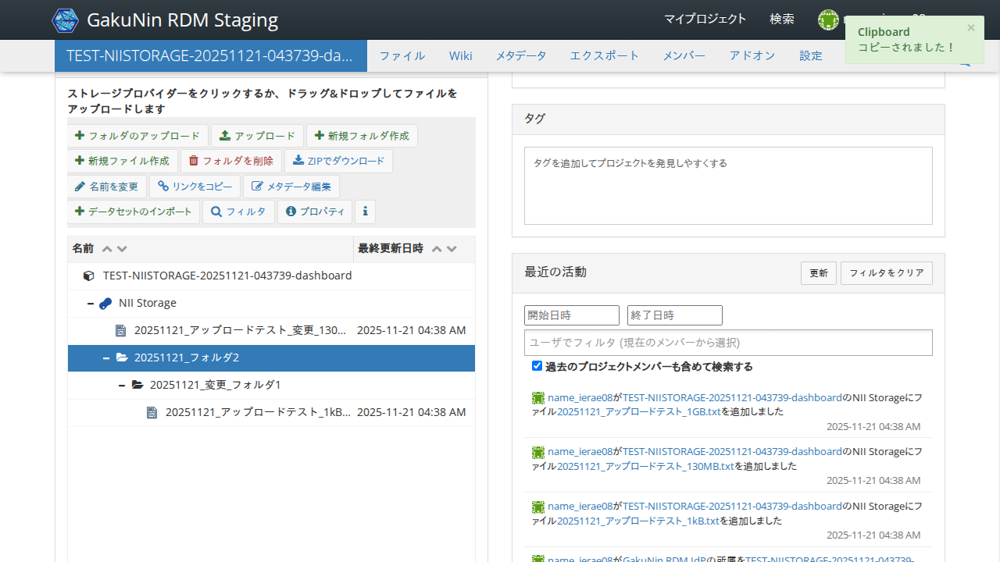

In [42]:
new_foldername = f'{yyyymmdd}_フォルダ2'

async def _step(page):
    await expect(grdm.get_select_folder_title_locator(page, new_foldername)).to_be_visible(timeout=transition_timeout)
    await grdm.get_select_folder_title_locator(page, new_foldername).click()

    await expect(page.locator('//i[contains(@class, "fa-download")]/../*[text() = "ZIPでダウンロード"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「ZIPでダウンロード」をクリックする

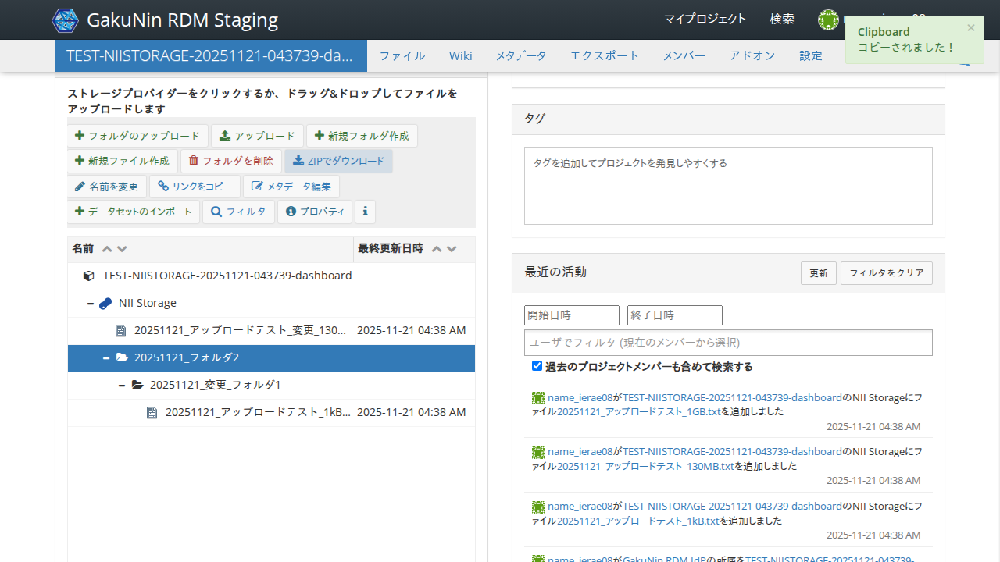

In [43]:
async def _step(page):
    async with page.expect_download() as download_info:
        await page.locator('//i[contains(@class, "fa-download")]/../*[text() = "ZIPでダウンロード"]').click()
    download = await download_info.value
    download_dir = os.path.join(work_dir, 'downloaded')
    os.makedirs(download_dir, exist_ok=True)
    zip_path = os.path.join(download_dir, download.suggested_filename)
    await download.save_as(zip_path)

    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        assert zip_ref.namelist() == [f'{yyyymmdd}_変更_フォルダ1/{yyyymmdd}_アップロードテスト_1kB.txt'], zip_ref.namelist()

await run_pw(_step)

## ファイル一覧から「フォルダ2」の行のファイル名以外の部分をクリックする

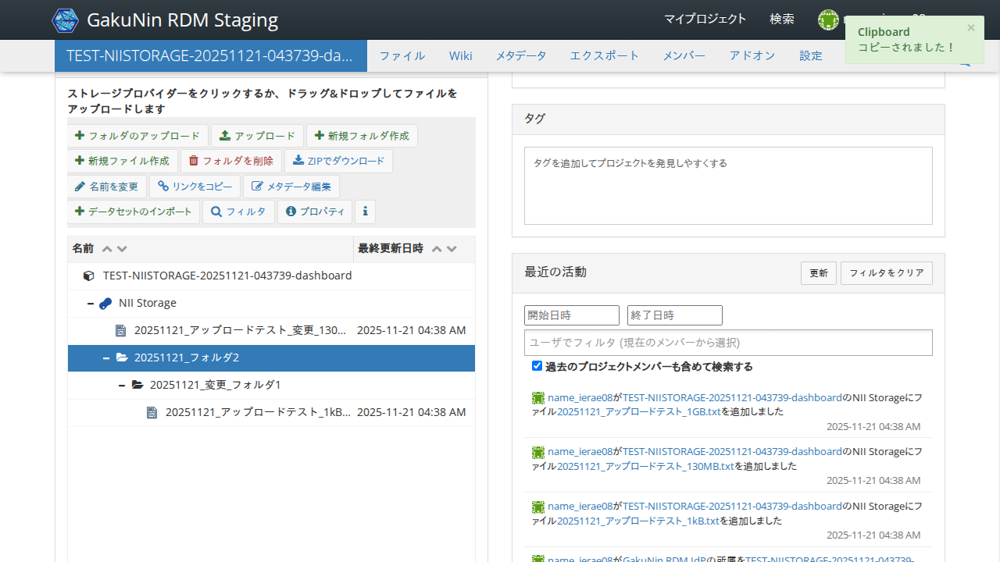

In [44]:
new_foldername = f'{yyyymmdd}_フォルダ2'

async def _step(page):
    await expect(grdm.get_select_folder_title_locator(page, new_foldername)).to_be_visible(timeout=transition_timeout)
    await grdm.get_select_folder_title_locator(page, new_foldername).click()

    await expect(page.locator('//i[contains(@class, "fa-trash")]/../*[text() = "フォルダを削除"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「フォルダを削除」をクリックする

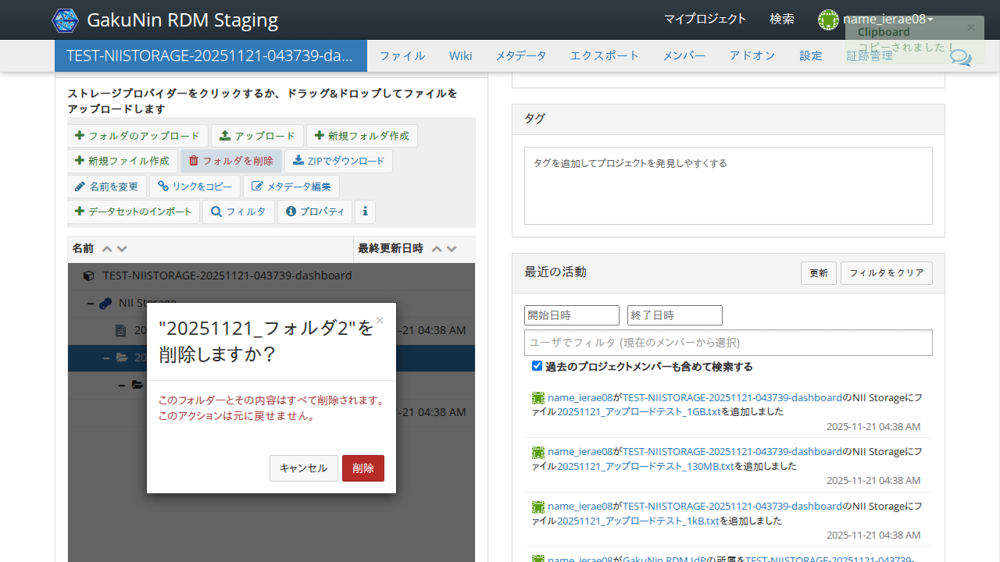

In [45]:
async def _step(page):
    await page.locator('//i[contains(@class, "fa-trash")]/../*[text() = "フォルダを削除"]').click()
    await expect(page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[contains(@class, "btn-danger")]')).to_be_enabled(timeout=transition_timeout)
    time.sleep(1)

await run_pw(_step)

## ダイアログから「削除」をクリックする

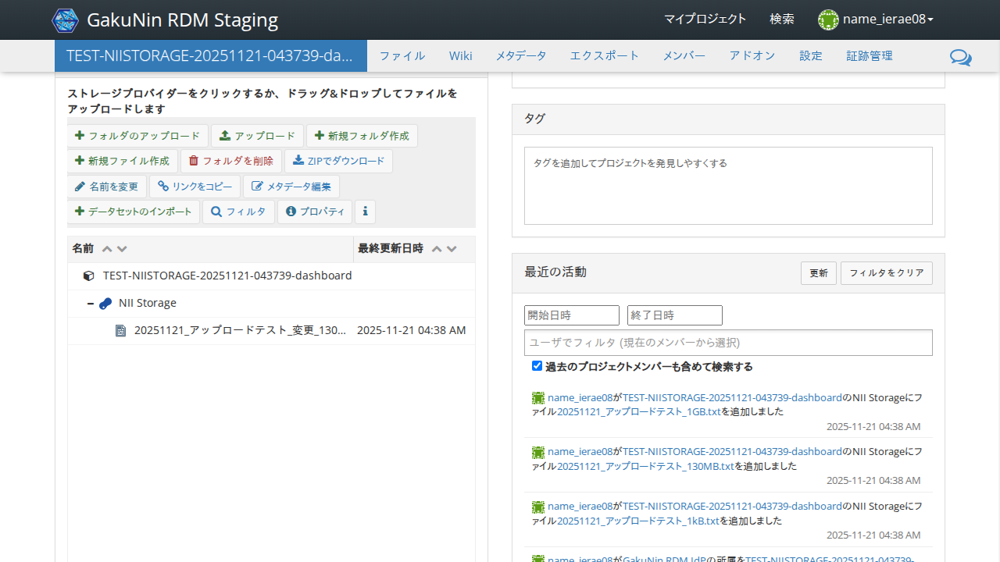

In [46]:
async def _step(page):
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[contains(@class, "btn-danger")]').click()
    await expect(grdm.get_select_folder_title_locator(page, new_foldername)).to_have_count(0, timeout=transition_timeout)
    time.sleep(1)

await run_pw(_step)

## ファイル一覧の対象ストレージ名の行をクリックする

ファイル一覧上部のファイル操作メニューが表示されること

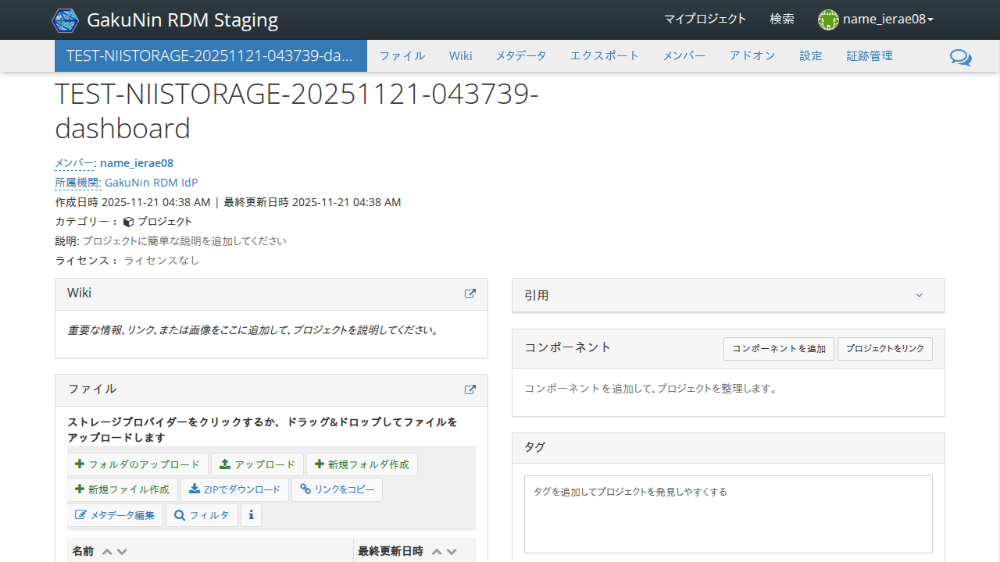

In [47]:
async def _step(page):
    await grdm.get_select_storage_title_locator(page, target_storage_name).click()
    await expect(page.locator('//i[contains(@class, "fa-plus")]/../*[text() = "新規フォルダ作成"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「新規フォルダ作成」をクリックする

ファイル操作メニューがテキスト入力フォームに切り替わること

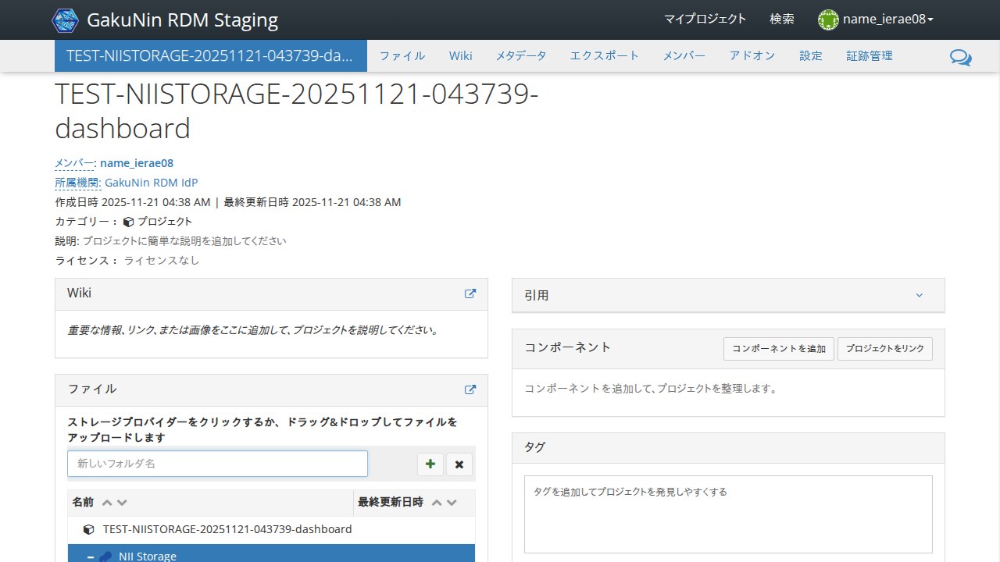

In [48]:
async def _step(page):
    await page.locator('//i[contains(@class, "fa-plus")]/../*[text() = "新規フォルダ作成"]').click()
    await expect(page.locator('#createFolderInput')).to_be_editable()

await run_pw(_step)

## テキスト入力フォームに「フォルダ1」を入力してEnterキーを押下する

- ファイル一覧に「フォルダ1」の名称でフォルダが追加されること
- 「フォルダ1」の作成日時をメモしておくこと

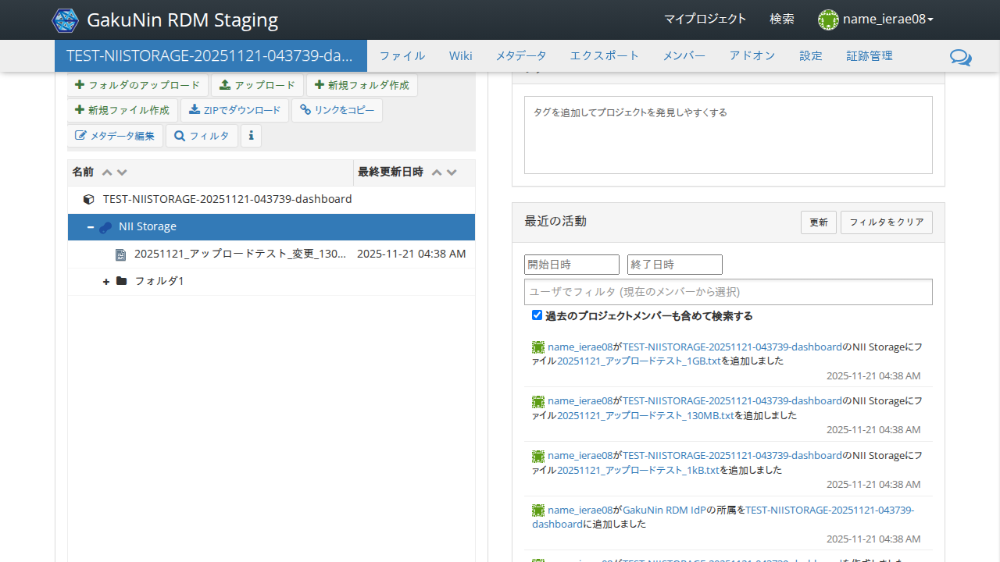

In [ ]:
new_foldername = f'フォルダ1'

async def _step(page):
    create_folder_input = page.locator('#createFolderInput')
    await create_folder_input.fill(new_foldername)
    await create_folder_input.press('Enter')
    await grdm.get_select_folder_title_locator(page, new_foldername).scroll_into_view_if_needed()
    await expect(scripts.grdm.get_select_folder_title_locator(page, new_foldername)).to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## ファイル一覧の「フォルダ1」の行をクリックする

ファイル一覧上部のファイル操作メニューが表示されること

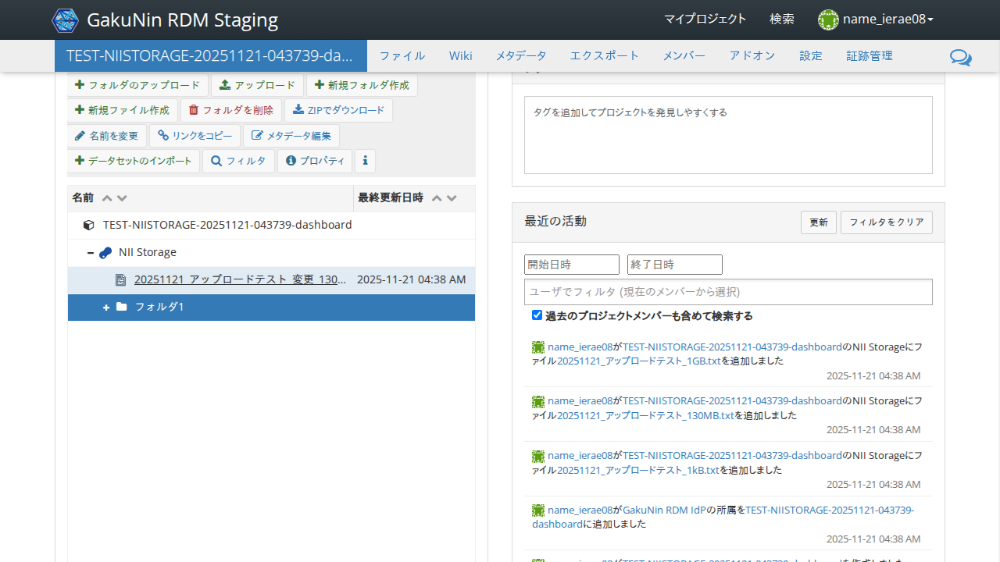

In [50]:
foldername = f'フォルダ1'
async def _step(page):
    await grdm.get_select_folder_title_locator(page, foldername).click()
    await expect(page.locator('//i[contains(@class, "fa-plus")]/../*[text() = "新規フォルダ作成"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「新規フォルダ作成」をクリックする

ファイル操作メニューがテキスト入力フォームに切り替わること

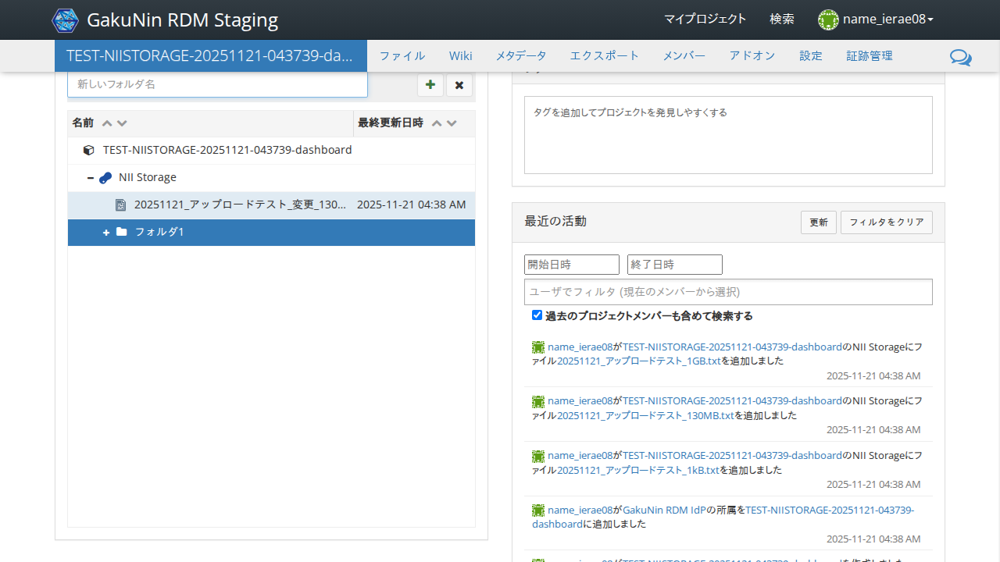

In [51]:
async def _step(page):
    await page.locator('//i[contains(@class, "fa-plus")]/../*[text() = "新規フォルダ作成"]').click()
    await expect(page.locator('#createFolderInput')).to_be_editable()

await run_pw(_step)

## テキスト入力フォームに「フォルダ2」を入力してEnterキーを押下する

- ファイル一覧に「フォルダ2」の名称でフォルダが追加されること
- 「フォルダ2」の作成日時をメモしておくこと

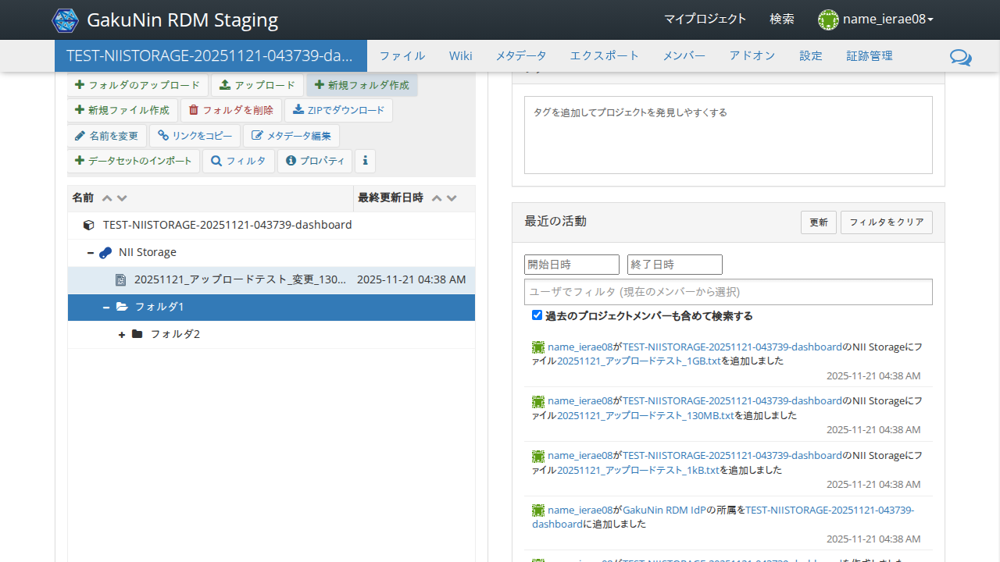

In [52]:
new_foldername = f'フォルダ2'

async def _step(page):
    create_folder_input = page.locator('#createFolderInput')
    await create_folder_input.fill(new_foldername)
    await create_folder_input.press('Enter')
    await expect(scripts.grdm.get_select_folder_title_locator(page, new_foldername)).to_be_visible(timeout=transition_timeout)

await run_pw(_step)

## ファイル一覧の「フォルダ2」行の上にファイル(1kB)をドロップする

- ファイル一覧の「フォルダ2」の下のツリーにファイルが追加されること
- 「ファイル(1kB)」の作成日時をメモしておくこと

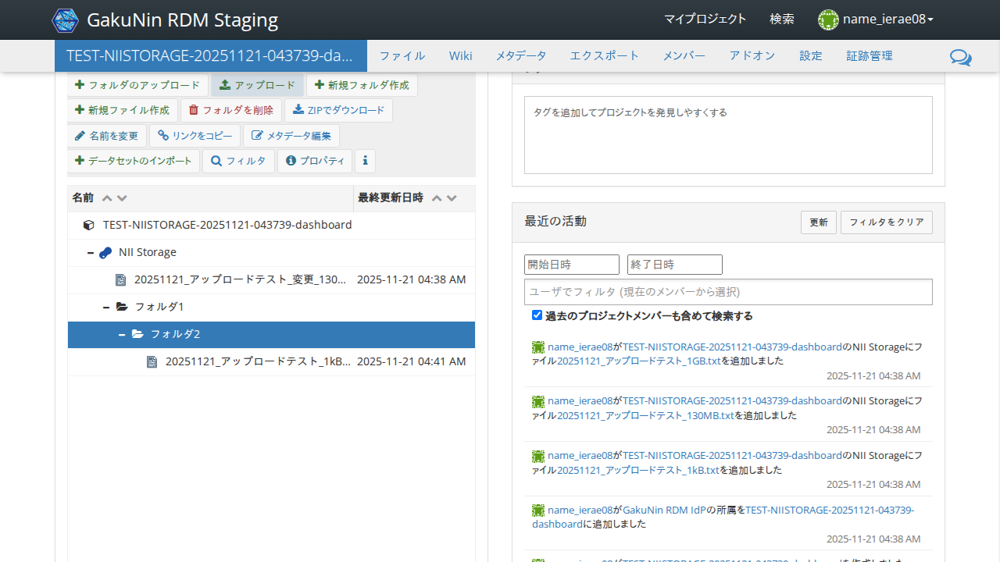

In [53]:
import scripts.grdm
importlib.reload(scripts.grdm)

import traceback
from datetime import datetime

# ファイルの作成
# x で埋められたファイルを生成
yyyymmdd = datetime.now().strftime('%Y%m%d')
filename = f'{yyyymmdd}_アップロードテスト_1kB.txt'
foldername = f'フォルダ2'
filepath = os.path.join(work_dir, filename)

with open(filepath, 'w') as f:
    for i in range(1000):
        f.write('x')

async def _step(page):
    try:
        await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(0)
    except:
        print(f'すでにファイルがあるのでスキップします: {filename}')
        traceback.print_exc()
        return

    await grdm.get_select_folder_title_locator(page, foldername).click()
    await grdm.upload_file(page, filepath)
    time.sleep(2)

    await expect(page.locator(f'//*[text() = "{filename}"]/../following-sibling::*//*[@role = "progressbar"]')).to_have_count(0, timeout=transition_timeout)
    # TMA comment
    await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(1, timeout=transition_timeout)

await run_pw(_step)

## 「フォルダ2」配下の「ファイル(1kB)」の行のファイル名以外の部分をクリックする

ファイル一覧上部のファイル操作メニューが表示され、その中に「プロパティ」ボタンが表示されること

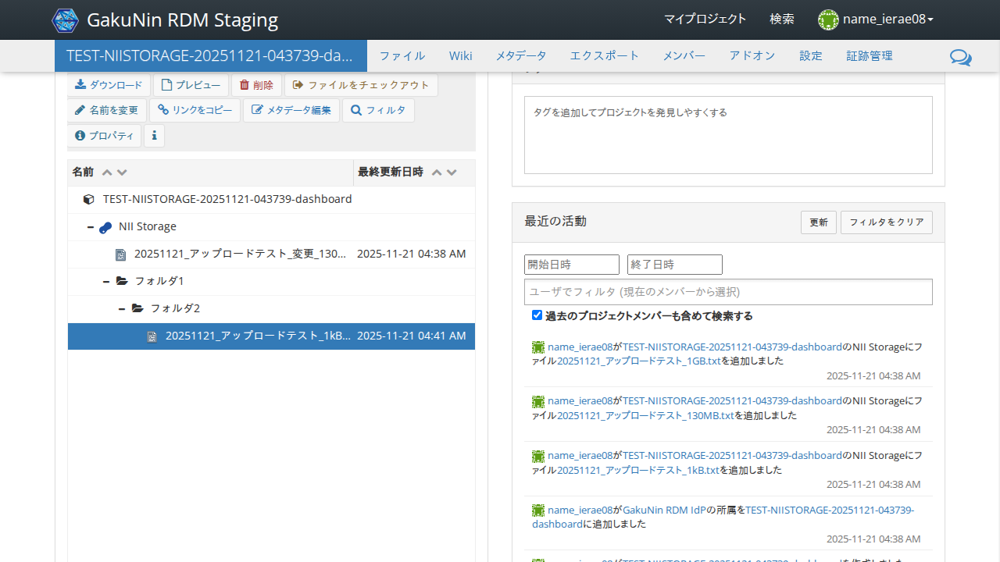

In [54]:
filename = f'{yyyymmdd}_アップロードテスト_1kB.txt'

async def _step(page):
    await expect(grdm.get_select_file_title_locator(page, filename)).to_be_visible(timeout=transition_timeout*5)
    await grdm.get_select_file_extension_locator(page, filename).click()

    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「プロパティ」をクリックする

ファイル情報ダイアログが表示され、以下の内容が表示されること:
- サイズ
- 作成日時 / 更新日時 / 最終更新者（対象ストレージに応じた期待値。冒頭の「プロパティダイアログの期待値決定」セル参照）
- パス

In [ ]:
async def _step(page):
    await page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]').click()
    await grdm.verify_property_file_info(
        page, '1.0 kB', f"/フォルダ1/フォルダ2/{filename}",
        expected_createtime=expected_file_createtime,
        expected_updatetime=expected_file_updatetime,
        expected_updateby=expected_file_updateby,
    )

await run_pw(_step)

## ダイアログの「閉じる」を押下する。

ファイル情報ダイアログが閉じられること

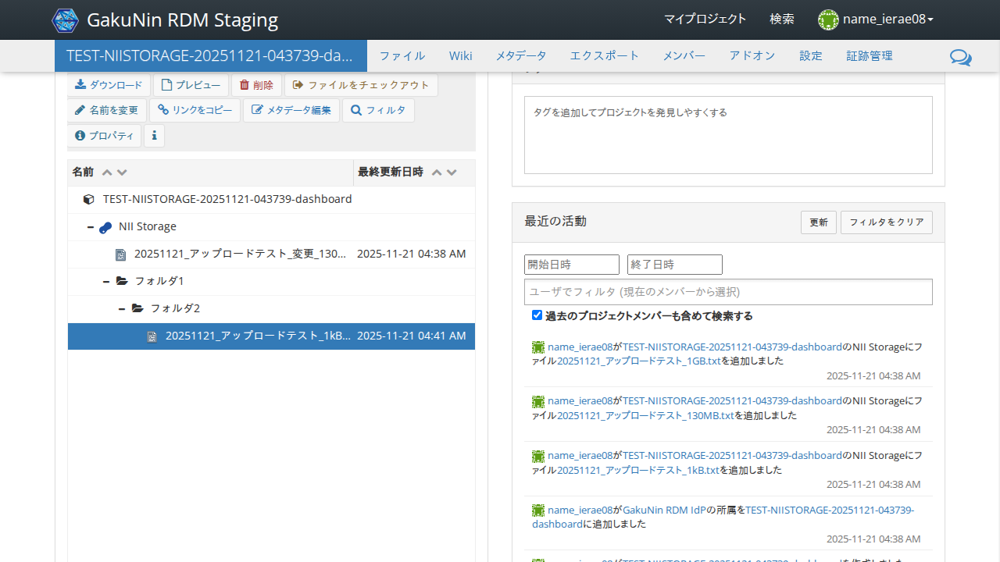

In [ ]:
async def _step(page):
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').scroll_into_view_if_needed()
    await expect(page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]')).to_be_enabled(timeout=60000)
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧から「ファイル(1kB)」のファイル名部分をクリックする

詳細表示の画面に遷移し「ファイル(1kB)」の内容が表示されること

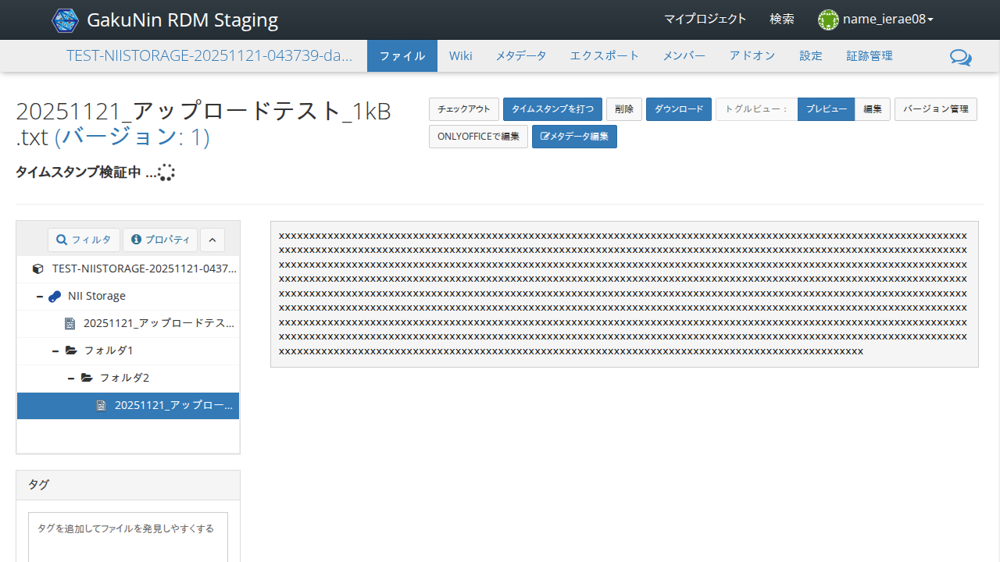

In [57]:
filename = f'{yyyymmdd}_アップロードテスト_1kB.txt'

async def _step(page):
    await grdm.get_select_file_title_locator(page, filename).click(timeout=transition_timeout)
    time.sleep(3)

    filename_body, filename_ext = os.path.splitext(filename)
    await expect(page.locator(f'//h2[contains(text(), "{filename_body}")]//*[@id = "file-ext"]')).to_have_text(filename_ext, timeout=transition_timeout)

    if not skip_preview_check:
        await expect(page.locator(f'//iframe[contains(@src, "/render")]').content_frame.locator('//pre')).to_have_text('x' * 1000, timeout=transition_timeout * 5)
await run_pw(_step)

## 「フォルダ2」配下の「ファイル(1kB)」の行のファイル名以外の部分をクリックする

ファイル一覧上部のメニューが表示され、その中に「プロパティ」ボタンが表示されること

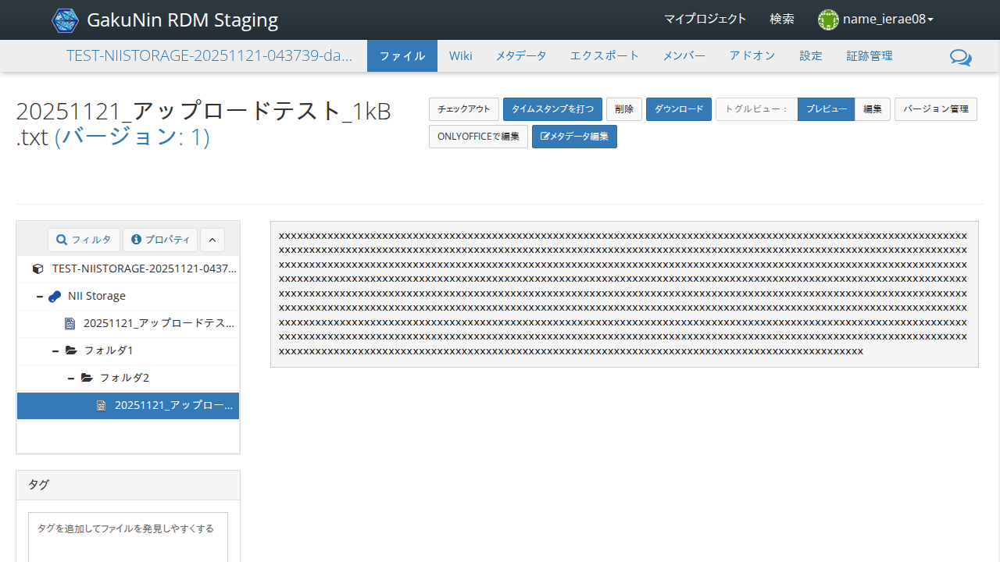

In [58]:
filename = f'{yyyymmdd}_アップロードテスト_1kB.txt'

async def _step(page):
    await expect(grdm.get_select_file_title_locator(page, filename)).to_be_visible(timeout=transition_timeout*5)
    await grdm.get_select_file_extension_locator(page, filename).click()

    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「プロパティ」をクリックする

ファイル情報ダイアログが表示され、以下の内容が表示されること:
- サイズ
- 作成日時 / 更新日時 / 最終更新者（対象ストレージに応じた期待値。冒頭の「プロパティダイアログの期待値決定」セル参照）
- パス

In [ ]:
async def _step(page):
    await page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]').click()
    await grdm.verify_property_file_info(
        page, '1.0 kB', f"/フォルダ1/フォルダ2/{filename}",
        expected_createtime=expected_file_createtime,
        expected_updatetime=expected_file_updatetime,
        expected_updateby=expected_file_updateby,
    )

await run_pw(_step)

## ダイアログの「閉じる」を押下する

ファイル情報ダイアログが閉じられること

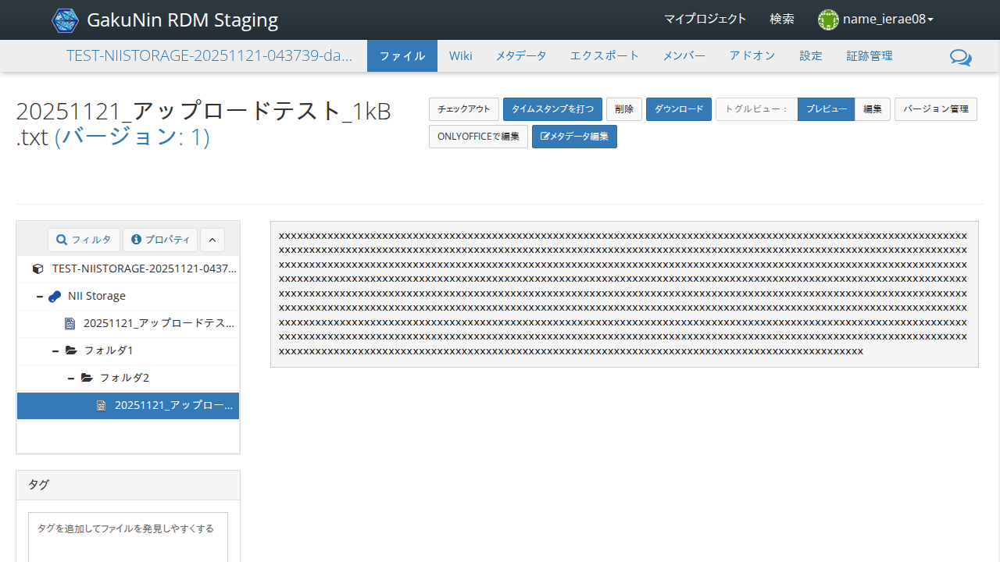

In [ ]:
async def _step(page):
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').scroll_into_view_if_needed()
    await expect(page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]')).to_be_enabled(timeout=60000)
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧へ戻り、「フォルダ2」行のファイル名以外の部分をクリックする

ファイル一覧上部のファイル操作メニューが表示され、その中に「プロパティ」ボタンが表示されること

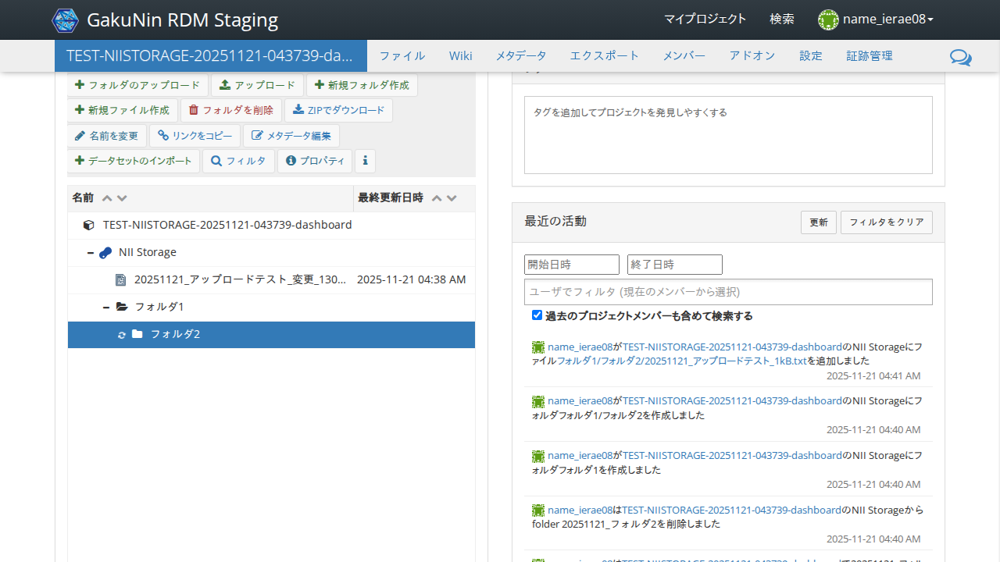

In [61]:
foldername1 = f'フォルダ1'
foldername2 = f'フォルダ2'
async def _step(page):
    await page.go_back()
    await expect(grdm.get_select_expanded_storage_title_locator(page, target_storage_name)).to_be_visible(timeout=transition_timeout)
    await expect(grdm.get_select_folder_title_locator(page, foldername1)).to_be_visible(timeout=transition_timeout)

    await grdm.get_select_folder_title_locator(page, foldername1).click()
    await page.locator('//div[contains(@class, "fangorn-selected")]//i[contains(@class, "fa-plus")]').click()
    await expect(grdm.get_select_folder_title_locator(page, foldername2)).to_be_visible(timeout=transition_timeout)

    await grdm.get_select_folder_title_locator(page, foldername2).click()
    await page.locator('//div[contains(@class, "fangorn-selected")]//i[contains(@class, "fa-plus")]').click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「プロパティ」をクリックする

フォルダ情報ダイアログが表示され、以下の内容が表示されること:
- 合計ファイル数
- 合計サイズ
- 作成日時 / 更新日時 / 最終更新者（対象ストレージに応じた期待値。冒頭の「プロパティダイアログの期待値決定」セル参照）
- パス

In [ ]:
async def _step(page):
    await page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]').click()
    await grdm.verify_property_folder_info(
        page, '1', '1.0 kB', f"/フォルダ1/フォルダ2",
        expected_createtime=expected_folder_createtime,
        expected_updatetime=expected_folder_updatetime,
        expected_updateby=expected_folder_updateby,
    )

await run_pw(_step)

## ダイアログの「閉じる」を押下する。

ファイル情報ダイアログが閉じられること

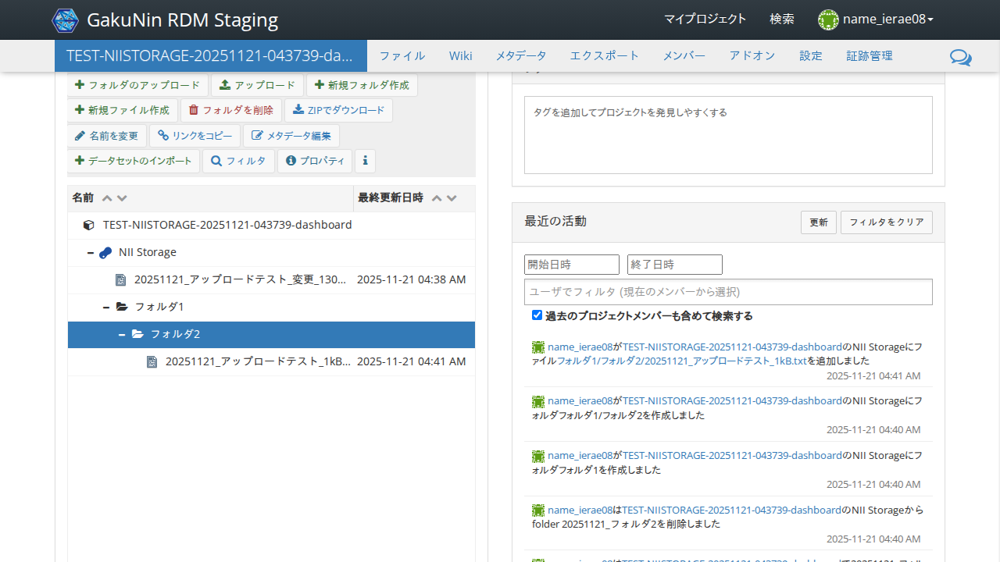

In [ ]:
async def _step(page):
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').scroll_into_view_if_needed()
    await expect(page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]')).to_be_enabled(timeout=60000)
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## 「フォルダ2」行の上にファイル(130MB)をドロップする

- 「フォルダ2」配下に「ファイル(130MB)」が追加されること
- 「ファイル(130MB)」の作成日時をメモしておくこと

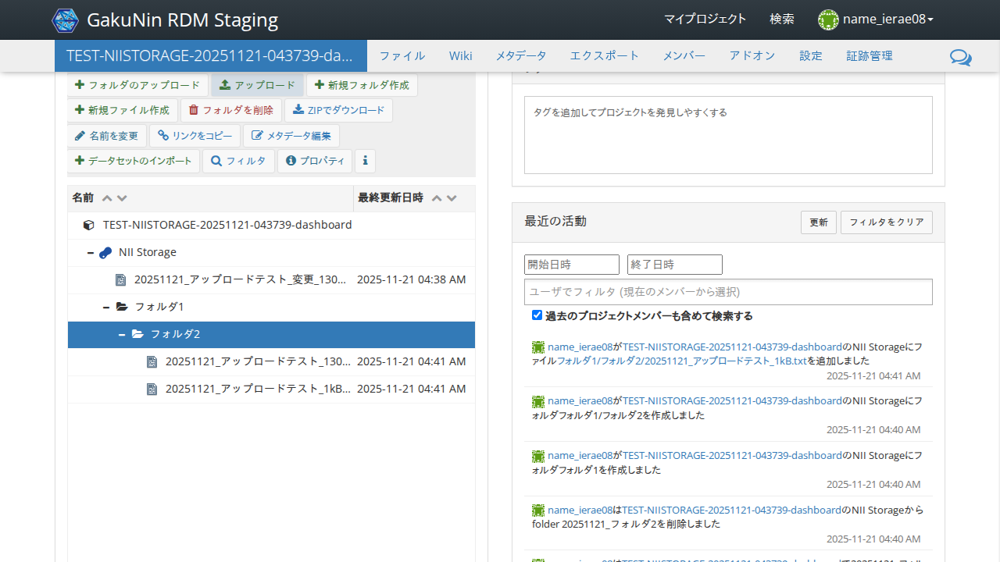

In [ ]:
import traceback
from datetime import datetime

# ファイルの作成
filename = f'{yyyymmdd}_アップロードテスト_130MB.txt'
foldername = f'フォルダ2'
filepath = os.path.join(work_dir, filename)

!dd if=/dev/urandom of={filepath} bs=130M count=1

async def _step(page):
    if skip_130mb_upload:
        return
    try:
        await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(0)
    except:
        print(f'すでにファイルがあるのでスキップします: {filename}')
        traceback.print_exc()
        return

    await grdm.get_select_folder_title_locator(page, foldername).click()
    await grdm.upload_file(page, filepath)
    time.sleep(2)

    await expect(page.locator(f'//*[text() = "{filename}"]/../following-sibling::*//*[@role = "progressbar"]')).to_have_count(0, timeout=transition_timeout * 10)
    await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(1, timeout=transition_timeout)

await run_pw(_step)

## 「フォルダ2」配下の「ファイル(130MB)」の行のファイル名以外の部分をクリックする

ファイル一覧上部のファイル操作メニューが表示され、その中に「プロパティ」ボタンが表示されること

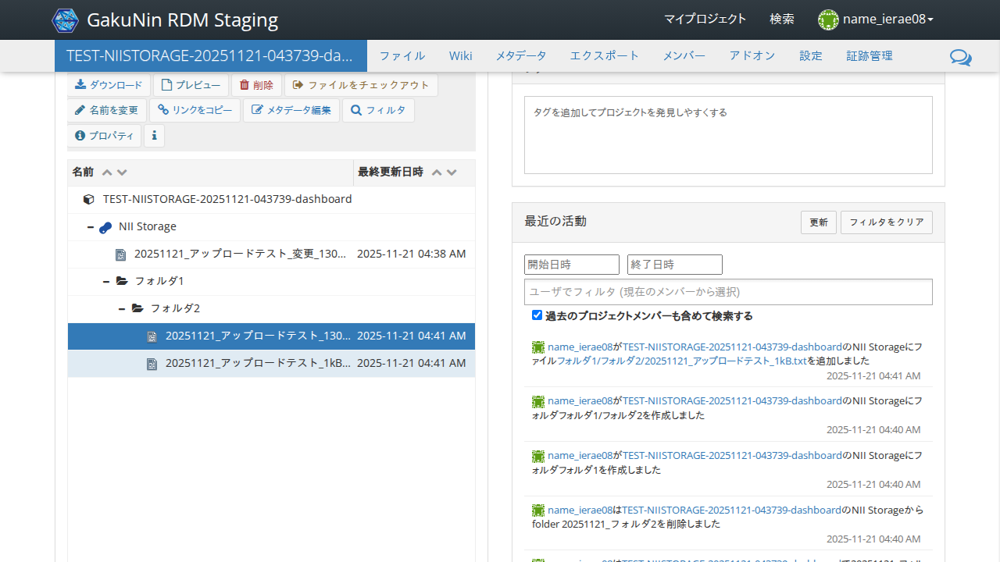

In [ ]:
filename = f'{yyyymmdd}_アップロードテスト_130MB.txt'

async def _step(page):
    if skip_130mb_upload:
        return
    await expect(grdm.get_select_file_title_locator(page, filename)).to_be_visible(timeout=transition_timeout)
    await grdm.get_select_file_extension_locator(page, filename).click()

    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「プロパティ」をクリックする

ファイル情報ダイアログが表示され、以下の内容が表示されること:
- サイズ
- 作成日時 / 更新日時 / 最終更新者（対象ストレージに応じた期待値。冒頭の「プロパティダイアログの期待値決定」セル参照）
- パス

In [ ]:
async def _step(page):
    if skip_130mb_upload:
        return
    await page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]').click()
    await grdm.verify_property_file_info(
        page, '136.3 MB', f"/フォルダ1/フォルダ2/{filename}",
        expected_createtime=expected_file_createtime,
        expected_updatetime=expected_file_updatetime,
        expected_updateby=expected_file_updateby,
    )

await run_pw(_step)

## ダイアログの「閉じる」を押下する。

ファイル情報ダイアログが閉じられること

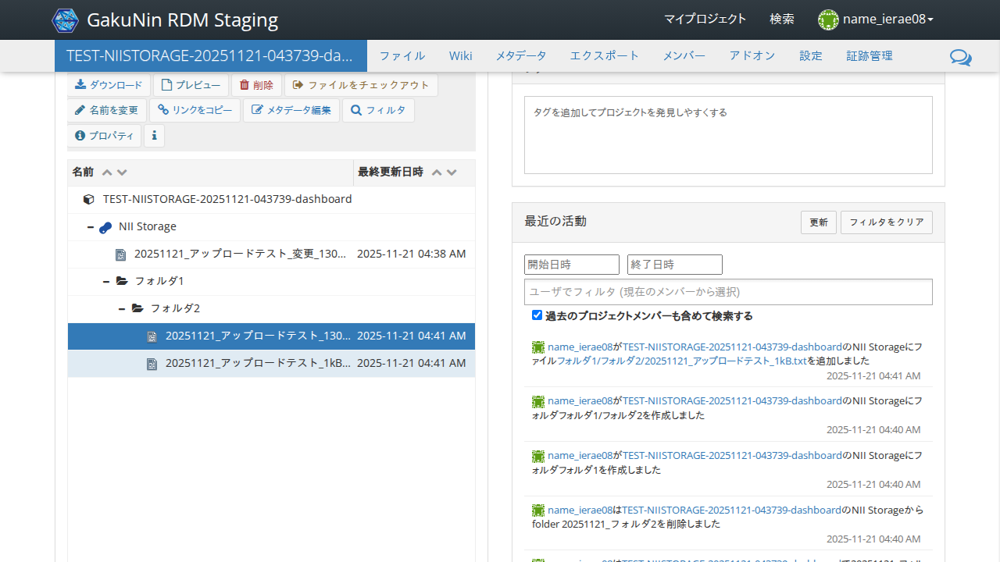

In [ ]:
async def _step(page):
    if skip_130mb_upload:
        return
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').scroll_into_view_if_needed()
    await expect(page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]')).to_be_enabled(timeout=60000)
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## 「フォルダ2」行のファイル名以外の部分をクリックする

ファイル一覧上部のファイル操作メニューが表示され、その中に「プロパティ」ボタンが表示されること

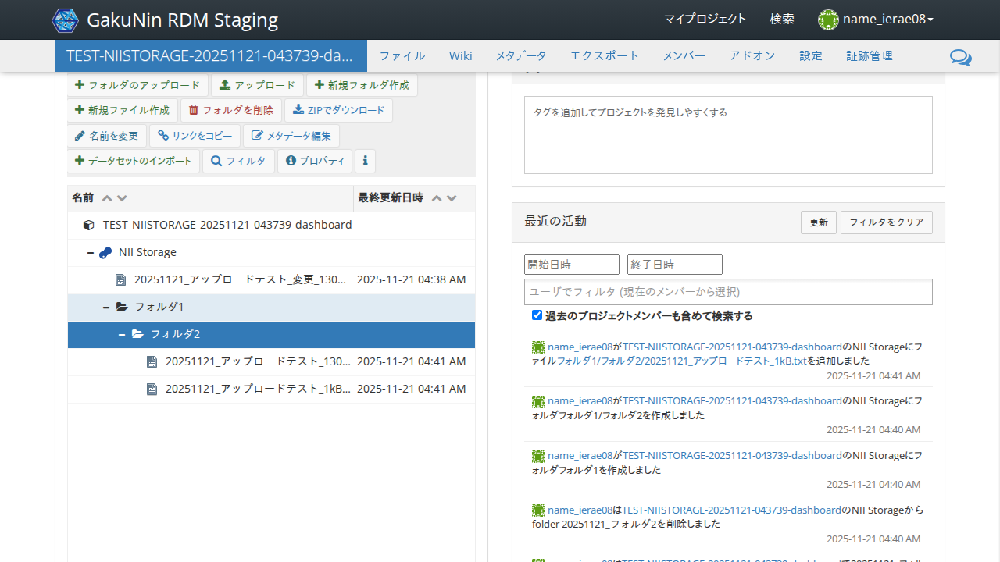

In [68]:
foldername = f'フォルダ2'
async def _step(page):
    await grdm.get_select_folder_title_locator(page, foldername).click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「プロパティ」をクリックする

フォルダ情報ダイアログが表示され、以下の内容が表示されること:
- 合計ファイル数
- 合計サイズ
- 作成日時 / 更新日時 / 最終更新者（対象ストレージに応じた期待値。冒頭の「プロパティダイアログの期待値決定」セル参照）
- パス

In [ ]:
async def _step(page):
    await page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]').click()
    if skip_130mb_upload:
        await grdm.verify_property_folder_info(
            page, '1', '1.0 kB', f"/フォルダ1/フォルダ2",
            expected_createtime=expected_folder_createtime,
            expected_updatetime=expected_folder_updatetime,
            expected_updateby=expected_folder_updateby,
        )
    else:
        await grdm.verify_property_folder_info(
            page, '2', '136.3 MB', f"/フォルダ1/フォルダ2",
            expected_createtime=expected_folder_createtime,
            expected_updatetime=expected_folder_updatetime,
            expected_updateby=expected_folder_updateby,
        )

await run_pw(_step)

## ダイアログの「閉じる」を押下する。

ファイル情報ダイアログが閉じられること

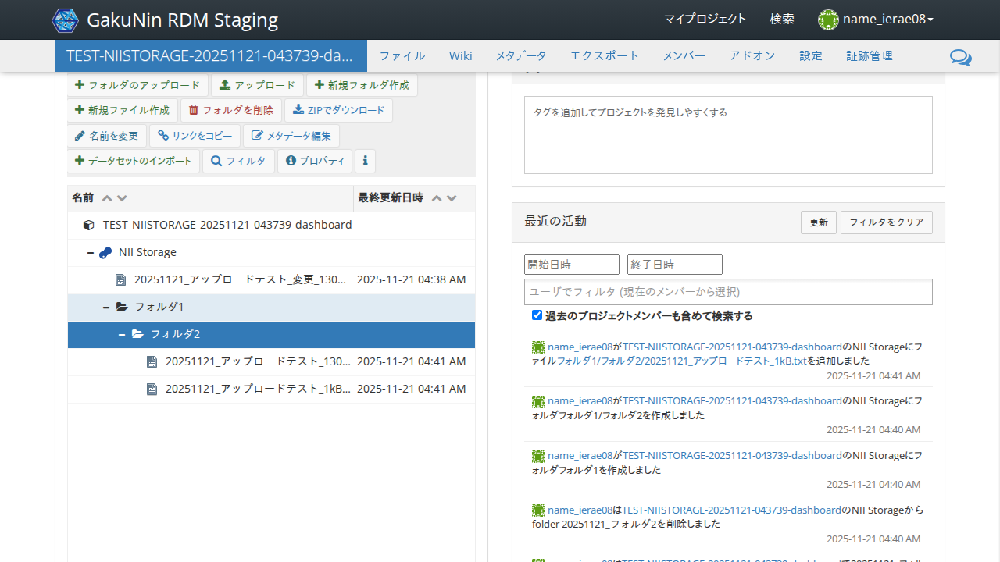

In [ ]:
async def _step(page):
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').scroll_into_view_if_needed()
    await expect(page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]')).to_be_enabled(timeout=60000)
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## 「フォルダ1」行の上にファイル(130MB)をドロップする

- 「フォルダ1」配下に「ファイル(130MB)」が追加されること
- 「ファイル(130MB)」の作成日時をメモしておくこと

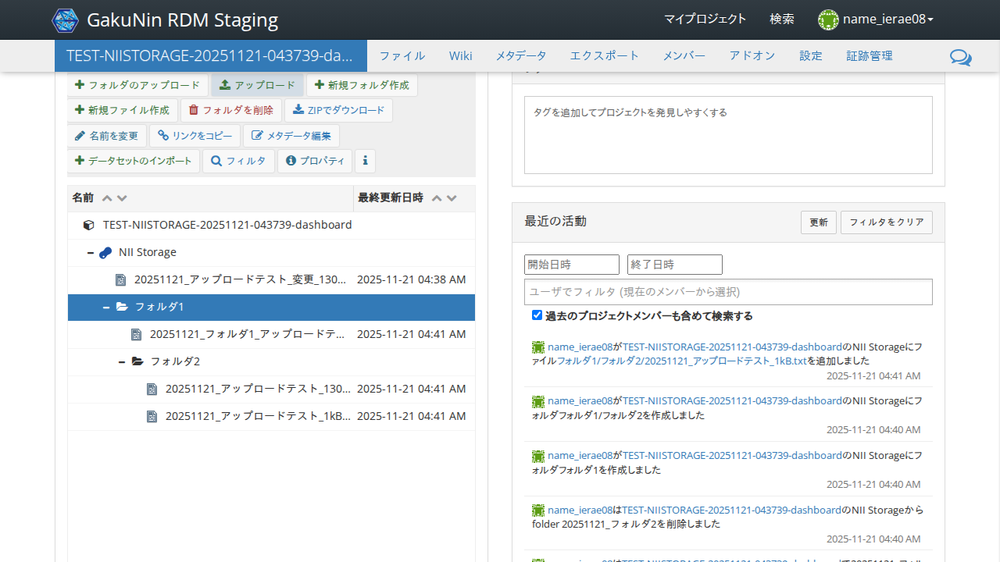

In [ ]:
import traceback
from datetime import datetime

# ファイルの作成
filename = f'{yyyymmdd}_フォルダ1_アップロードテスト_130MB.txt'
foldername = f'フォルダ1'
filepath = os.path.join(work_dir, filename)

!dd if=/dev/urandom of={filepath} bs=130M count=1

async def _step(page):
    if skip_130mb_upload:
        return
    try:
        await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(0)
    except:
        print(f'すでにファイルがあるのでスキップします: {filename}')
        traceback.print_exc()
        return

    await grdm.get_select_folder_title_locator(page, foldername).click()
    await grdm.upload_file(page, filepath)
    time.sleep(2)

    await expect(page.locator(f'//*[text() = "{filename}"]/../following-sibling::*//*[@role = "progressbar"]')).to_have_count(0, timeout=transition_timeout * 10)
    await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(1, timeout=transition_timeout)

await run_pw(_step)

## 「フォルダ1」配下の「ファイル(130MB)」の行のファイル名以外の部分をクリックする

ファイル一覧上部のファイル操作メニューが表示され、その中に「プロパティ」ボタンが表示されること

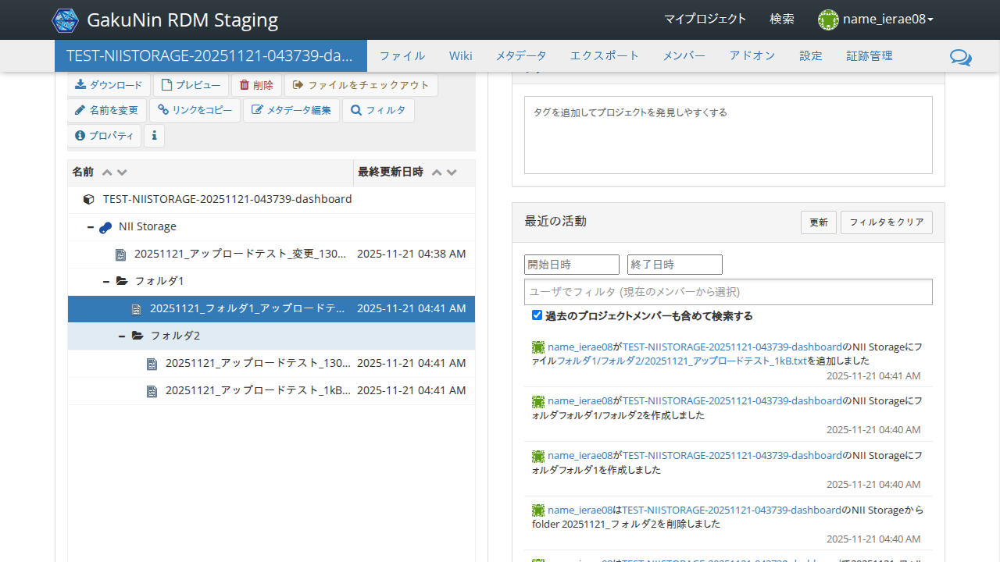

In [ ]:
filename = f'{yyyymmdd}_フォルダ1_アップロードテスト_130MB.txt'

async def _step(page):
    if skip_130mb_upload:
        return
    await grdm.get_select_file_extension_locator(page, filename).click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「プロパティ」をクリックする

ファイル情報ダイアログが表示され、以下の内容が表示されること:
- サイズ
- 作成日時 / 更新日時 / 最終更新者（対象ストレージに応じた期待値。冒頭の「プロパティダイアログの期待値決定」セル参照）
- パス

In [ ]:
async def _step(page):
    if skip_130mb_upload:
        return
    await page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]').click()
    await grdm.verify_property_file_info(
        page, '136.3 MB', f"/フォルダ1/{filename}",
        expected_createtime=expected_file_createtime,
        expected_updatetime=expected_file_updatetime,
        expected_updateby=expected_file_updateby,
    )

await run_pw(_step)

## ダイアログの「閉じる」を押下する。

ファイル情報ダイアログが閉じられること

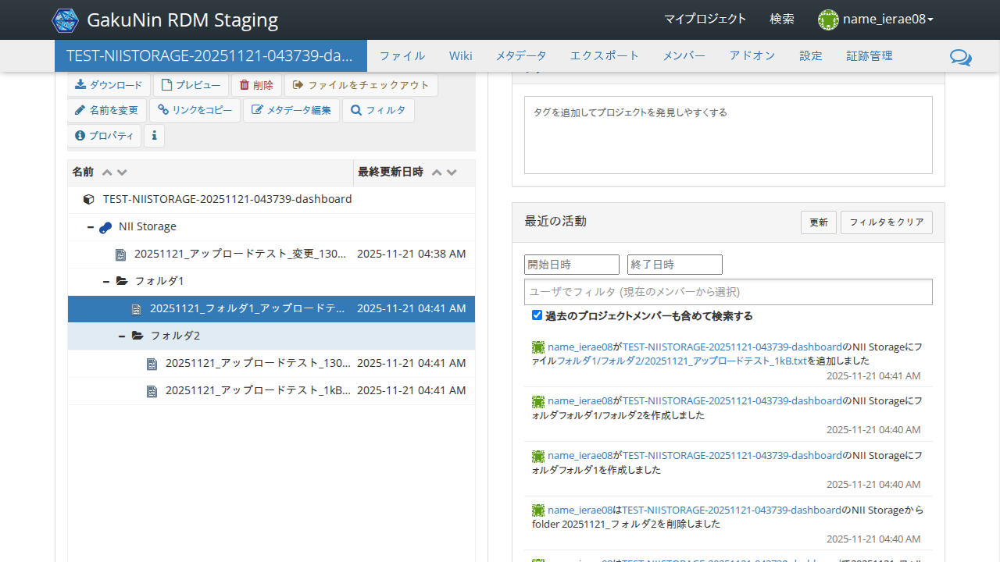

In [ ]:
async def _step(page):
    if skip_130mb_upload:
        return
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').scroll_into_view_if_needed()
    await expect(page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]')).to_be_enabled(timeout=60000)
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## 「フォルダ1」行のファイル名以外の部分をクリックする

ファイル一覧上部のファイル操作メニューが表示され、その中に「プロパティ」ボタンが表示されること

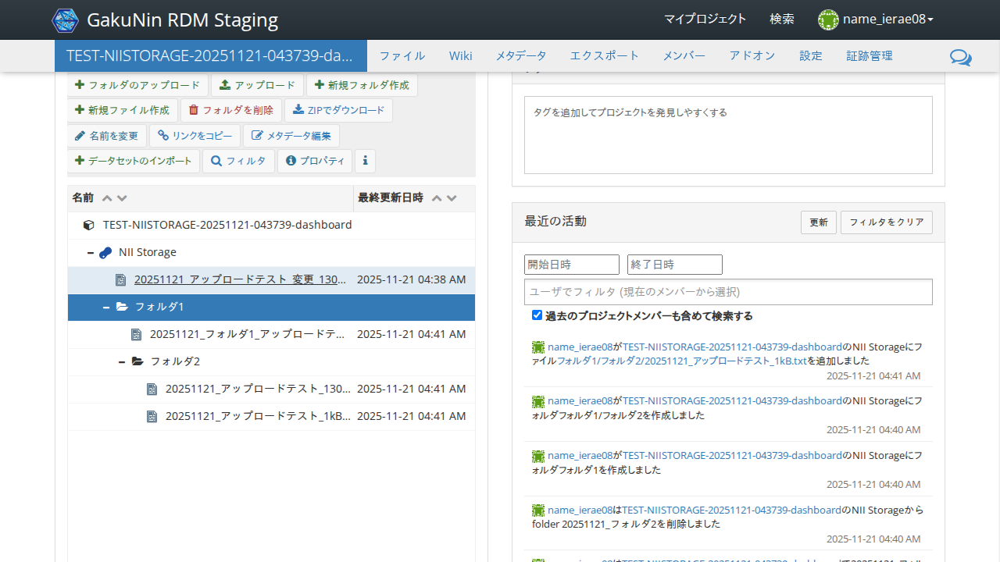

In [75]:
foldername = f'フォルダ1'
async def _step(page):
    await grdm.get_select_folder_title_locator(page, foldername).click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「プロパティ」をクリックする

フォルダ情報ダイアログが表示され、以下の内容が表示されること:
- 合計ファイル数
- 合計サイズ
- 作成日時 / 更新日時 / 最終更新者（対象ストレージに応じた期待値。冒頭の「プロパティダイアログの期待値決定」セル参照）
- パス

In [ ]:
async def _step(page):
    await page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]').click()
    if skip_130mb_upload:
        await grdm.verify_property_folder_info(
            page, '1', '1.0 kB', f"/フォルダ1",
            expected_createtime=expected_folder_createtime,
            expected_updatetime=expected_folder_updatetime,
            expected_updateby=expected_folder_updateby,
        )
    else:
        await grdm.verify_property_folder_info(
            page, '3', '272.6 MB', f"/フォルダ1",
            expected_createtime=expected_folder_createtime,
            expected_updatetime=expected_folder_updatetime,
            expected_updateby=expected_folder_updateby,
        )

await run_pw(_step)

## ダイアログの「閉じる」を押下する。

ファイル情報ダイアログが閉じられること

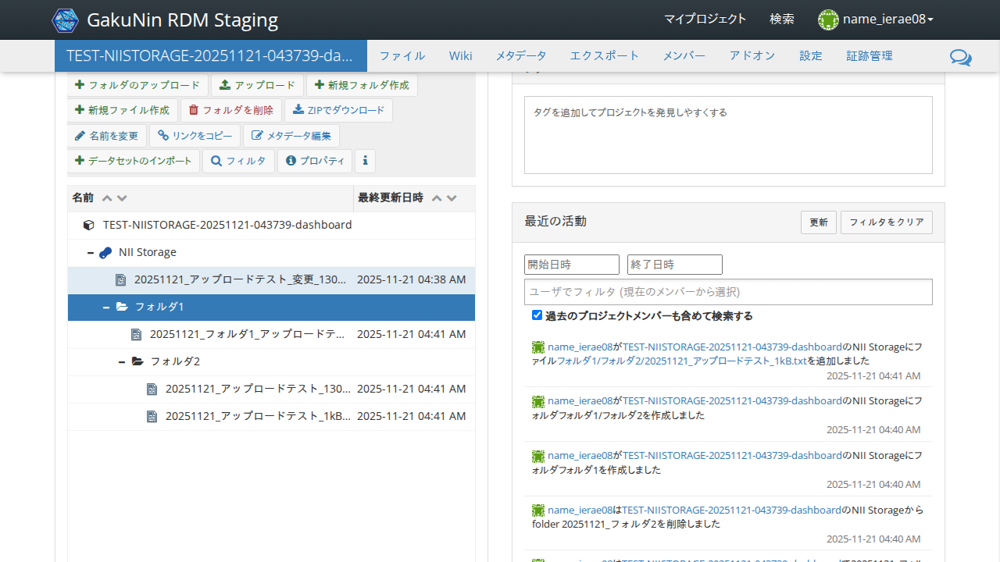

In [ ]:
async def _step(page):
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').scroll_into_view_if_needed()
    await expect(page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]')).to_be_enabled(timeout=60000)
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## 「フォルダ2」行のファイル名以外の部分をクリックする

ファイル一覧上部のファイル操作メニューが表示され、その中に「プロパティ」ボタンが表示されること

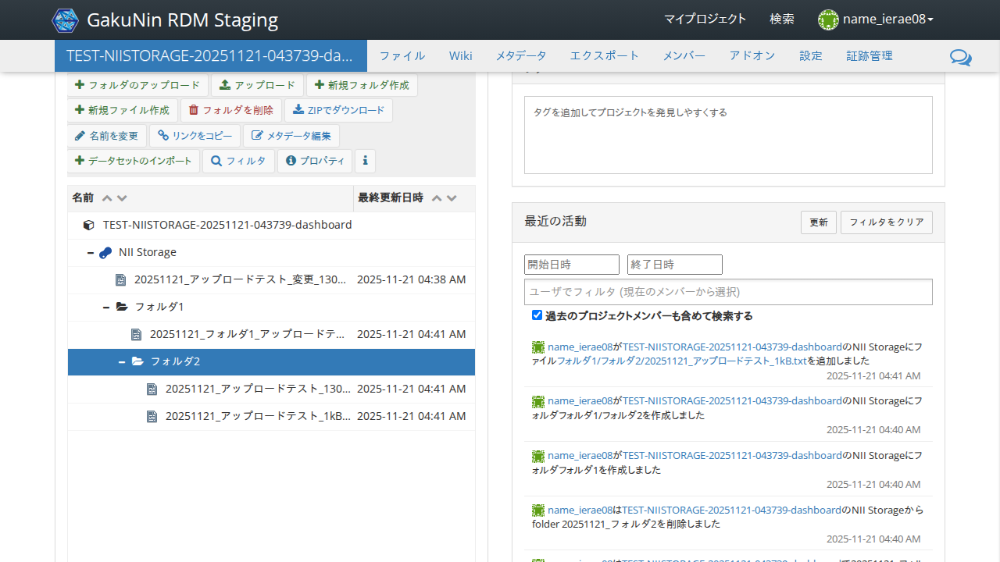

In [78]:
foldername = f'フォルダ2'
async def _step(page):
    await grdm.get_select_folder_title_locator(page, foldername).click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「プロパティ」をクリックする

フォルダ情報ダイアログが表示され、以下の内容が表示されること:
- 合計ファイル数
- 合計サイズ
- 作成日時 / 更新日時 / 最終更新者（対象ストレージに応じた期待値。冒頭の「プロパティダイアログの期待値決定」セル参照）
- パス

In [ ]:
async def _step(page):
    await page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]').click()
    if skip_130mb_upload:
        await grdm.verify_property_folder_info(
            page, '1', '1.0 kB', f"/フォルダ1/フォルダ2",
            expected_createtime=expected_folder_createtime,
            expected_updatetime=expected_folder_updatetime,
            expected_updateby=expected_folder_updateby,
        )
    else:
        await grdm.verify_property_folder_info(
            page, '2', '136.3 MB', f"/フォルダ1/フォルダ2",
            expected_createtime=expected_folder_createtime,
            expected_updatetime=expected_folder_updatetime,
            expected_updateby=expected_folder_updateby,
        )

await run_pw(_step)

## ダイアログの「閉じる」を押下する。

ファイル情報ダイアログが閉じられること

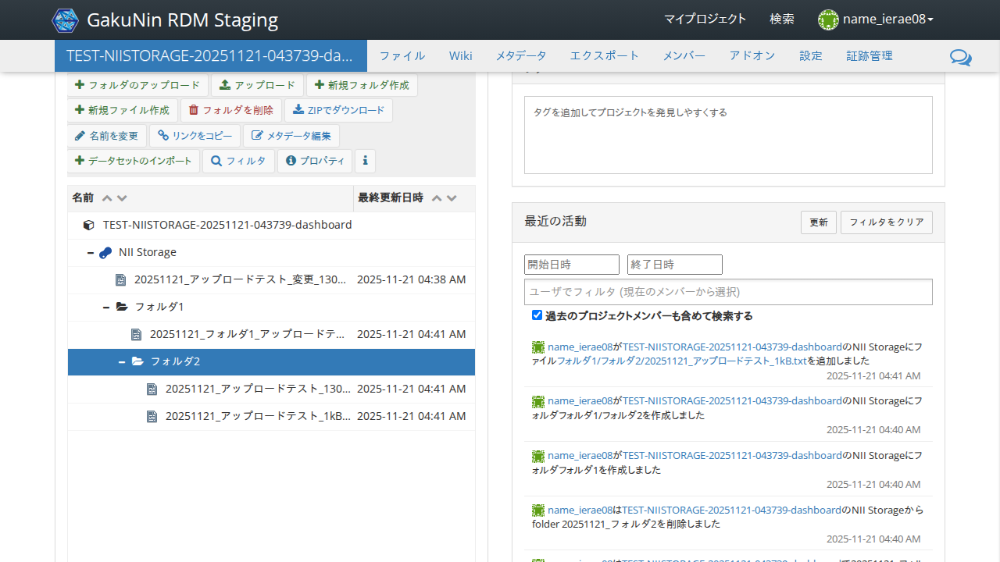

In [ ]:
async def _step(page):
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').scroll_into_view_if_needed()
    await expect(page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]')).to_be_enabled(timeout=60000)
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## 「フォルダ2」配下の「ファイル(130MB)」の行のファイル名以外の部分をクリックする

ファイル一覧上部のファイル操作メニューが表示されること

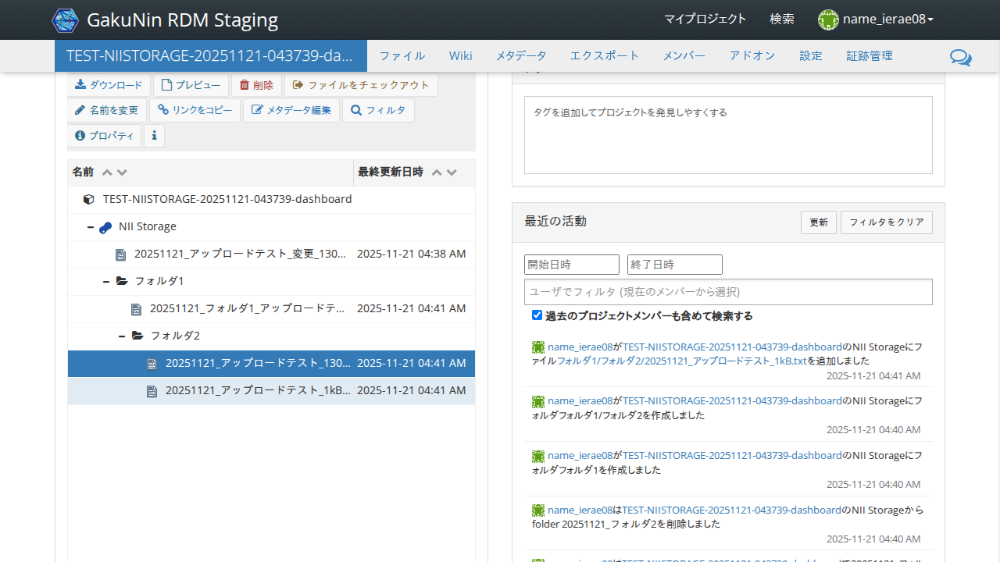

In [ ]:
foldername = f'フォルダ2'
filename = f'{yyyymmdd}_アップロードテスト_130MB.txt'

async def _step(page):
    if skip_130mb_upload:
        return
    await grdm.get_select_folder_title_locator(page, foldername).click()
    await grdm.get_select_file_extension_locator(page, filename).click()
    await expect(page.locator('//i[contains(@class, "fa-trash")]/../*[text() = "削除"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「削除」をクリックする

「ファイル(130MB)」が削除されること

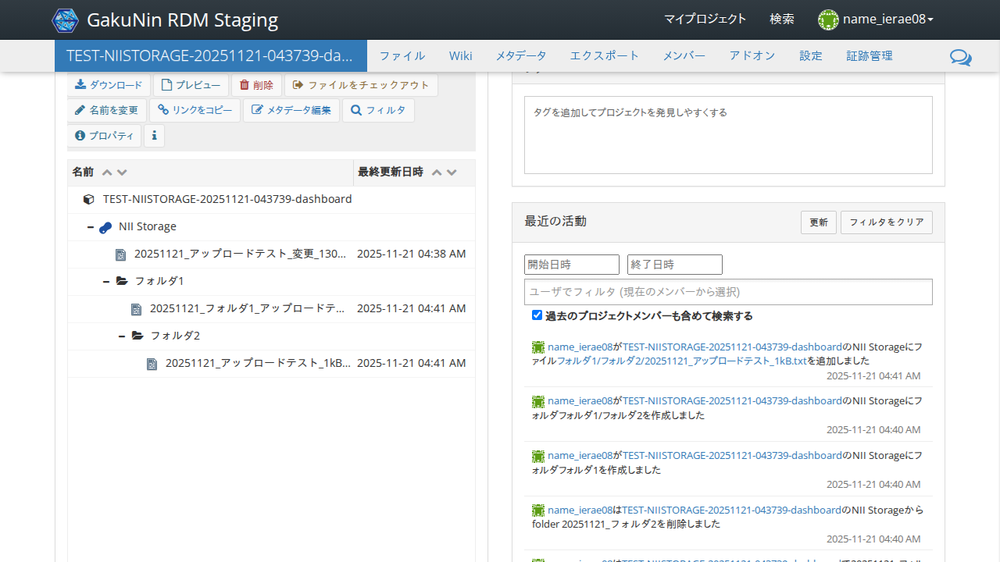

In [ ]:
filename = f'{yyyymmdd}_アップロードテスト_130MB.txt'
async def _step(page):
    if skip_130mb_upload:
        return
    await page.locator('//i[contains(@class, "fa-trash")]/../*[text() = "削除"]').click()
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[contains(@class, "btn-danger")]').click()
    await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(0, timeout=transition_timeout)

await run_pw(_step)

## 「フォルダ2」行のファイル名以外の部分をクリックする

ファイル一覧上部のファイル操作メニューが表示され、その中に「プロパティ」ボタンが表示されること

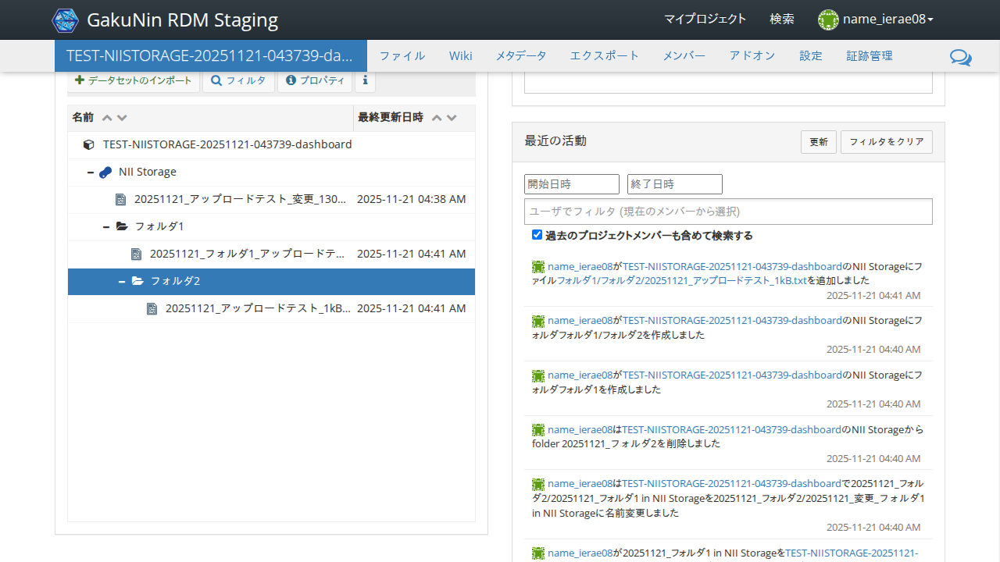

In [83]:
foldername = f'フォルダ2'
async def _step(page):
    await grdm.get_select_folder_title_locator(page, foldername).click()
    await page.locator('//*[@id = "tb-tbody"]//*[text() = "フォルダ2"]').scroll_into_view_if_needed()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「プロパティ」をクリックする

フォルダ情報ダイアログが表示され、以下の内容が表示されること:
- 合計ファイル数
- 合計サイズ
- 作成日時 / 更新日時 / 最終更新者（対象ストレージに応じた期待値。冒頭の「プロパティダイアログの期待値決定」セル参照）
- パス

In [ ]:
async def _step(page):
    await page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]').click()
    await grdm.verify_property_folder_info(
        page, '1', '1.0 kB', f"/フォルダ1/フォルダ2",
        expected_createtime=expected_folder_createtime,
        expected_updatetime=expected_folder_updatetime,
        expected_updateby=expected_folder_updateby,
    )

await run_pw(_step)

## ダイアログの「閉じる」を押下する。

ファイル情報ダイアログが閉じられること

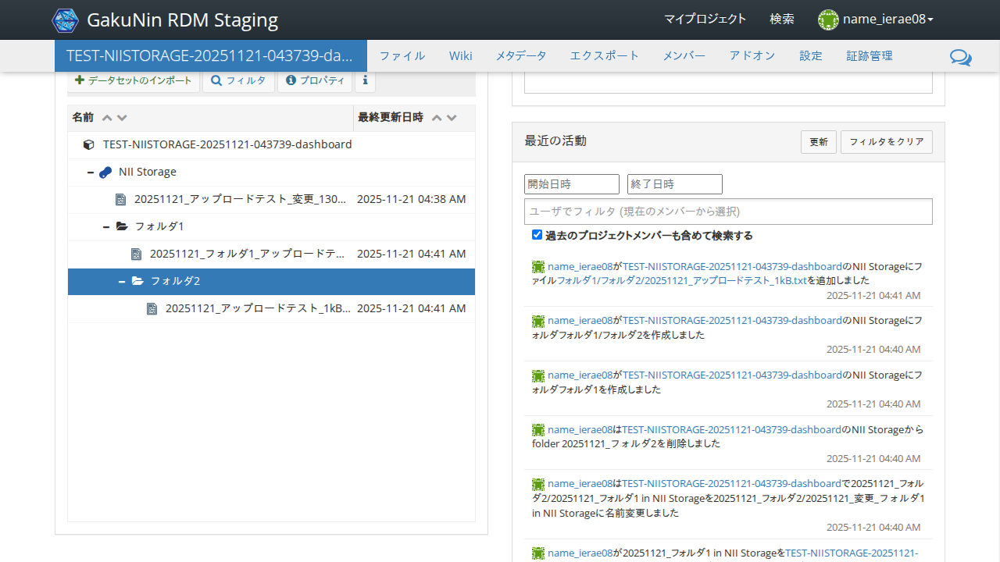

In [ ]:
async def _step(page):
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').scroll_into_view_if_needed()
    await expect(page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]')).to_be_enabled(timeout=60000)
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## 「フォルダ1」行のファイル名以外の部分をクリックする

ファイル一覧上部のファイル操作メニューが表示され、その中に「プロパティ」ボタンが表示されること

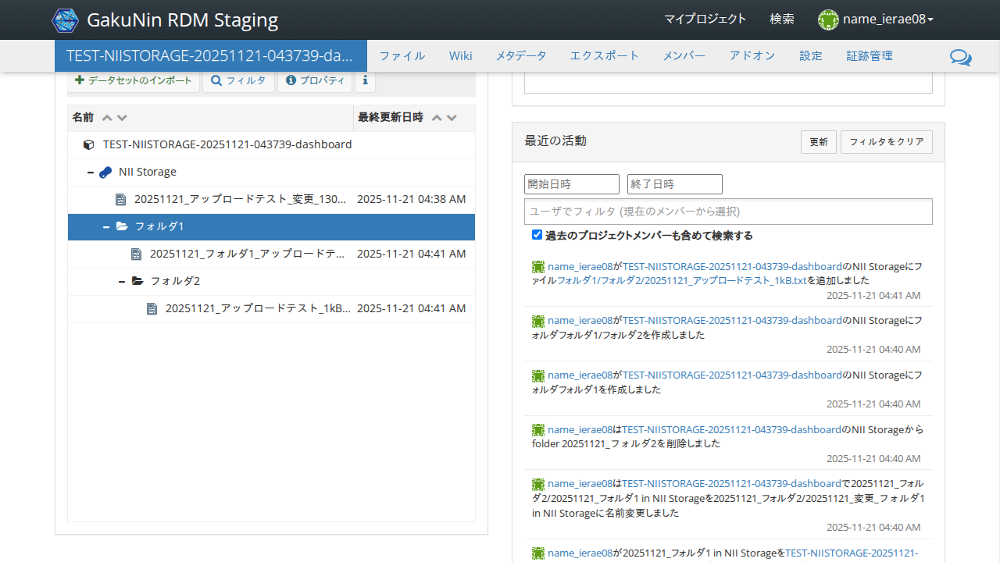

In [86]:
foldername = f'フォルダ1'
async def _step(page):
    await grdm.get_select_folder_title_locator(page, foldername).click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「プロパティ」をクリックする

フォルダ情報ダイアログが表示され、以下の内容が表示されること:
- 合計ファイル数
- 合計サイズ
- 作成日時 / 更新日時 / 最終更新者（対象ストレージに応じた期待値。冒頭の「プロパティダイアログの期待値決定」セル参照）
- パス

In [ ]:
async def _step(page):
    await page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]').click()
    if skip_130mb_upload:
        await grdm.verify_property_folder_info(
            page, '1', '1.0 kB', f"/フォルダ1",
            expected_createtime=expected_folder_createtime,
            expected_updatetime=expected_folder_updatetime,
            expected_updateby=expected_folder_updateby,
        )
    else:
        await grdm.verify_property_folder_info(
            page, '2', '136.3 MB', f"/フォルダ1",
            expected_createtime=expected_folder_createtime,
            expected_updatetime=expected_folder_updatetime,
            expected_updateby=expected_folder_updateby,
        )

await run_pw(_step)

## ダイアログの「閉じる」を押下する。

ファイル情報ダイアログが閉じられること

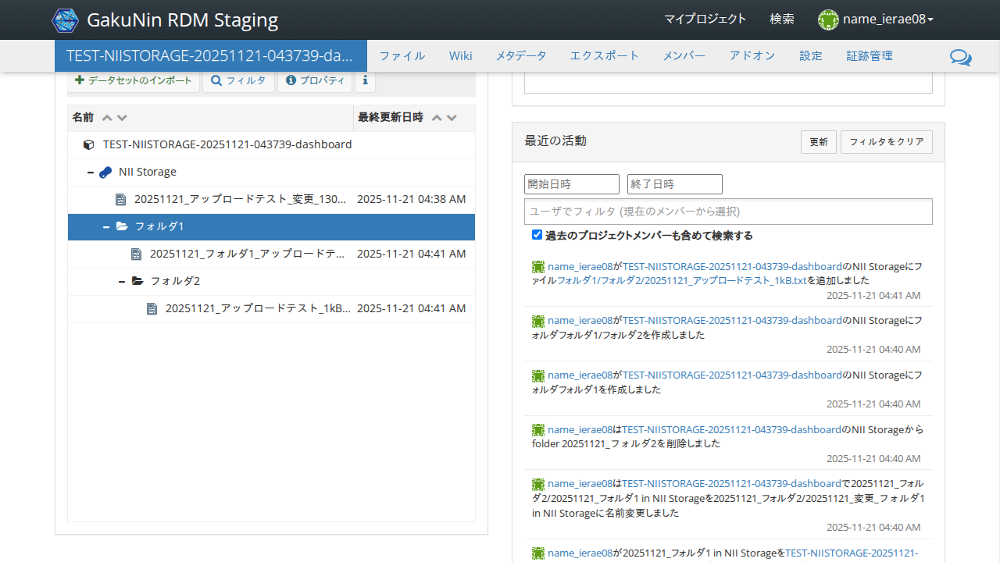

In [ ]:
async def _step(page):
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').scroll_into_view_if_needed()
    await expect(page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]')).to_be_enabled(timeout=60000)
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[text() = "閉じる"]').click()
    await expect(page.locator('//i[contains(@class, "fa-info-circle")]/../*[text() = "プロパティ"]')).to_be_enabled()

await run_pw(_step)

## 「フォルダ1」行のファイル名以外の部分をクリックする

ファイル一覧上部のファイル操作メニューが表示され、その中に「フォルダを削除」ボタンが表示されること

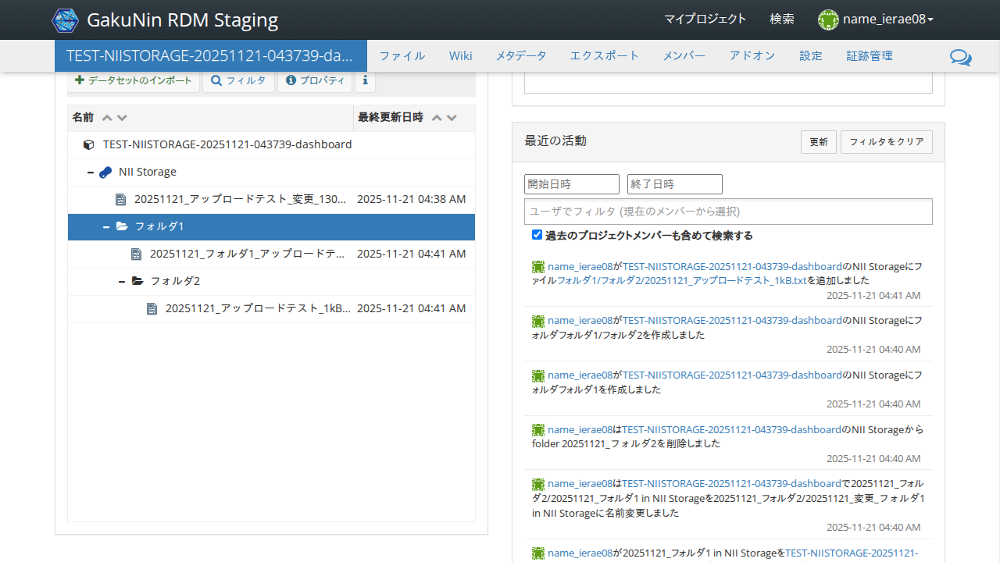

In [89]:
foldername = f'フォルダ1'
async def _step(page):
    await grdm.get_select_folder_title_locator(page, foldername).click()
    await expect(page.locator('//i[contains(@class, "fa-trash")]/../*[text() = "フォルダを削除"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「フォルダを削除」をクリックする

「"フォルダ1"を削除しますか？」のダイアログが表示されること

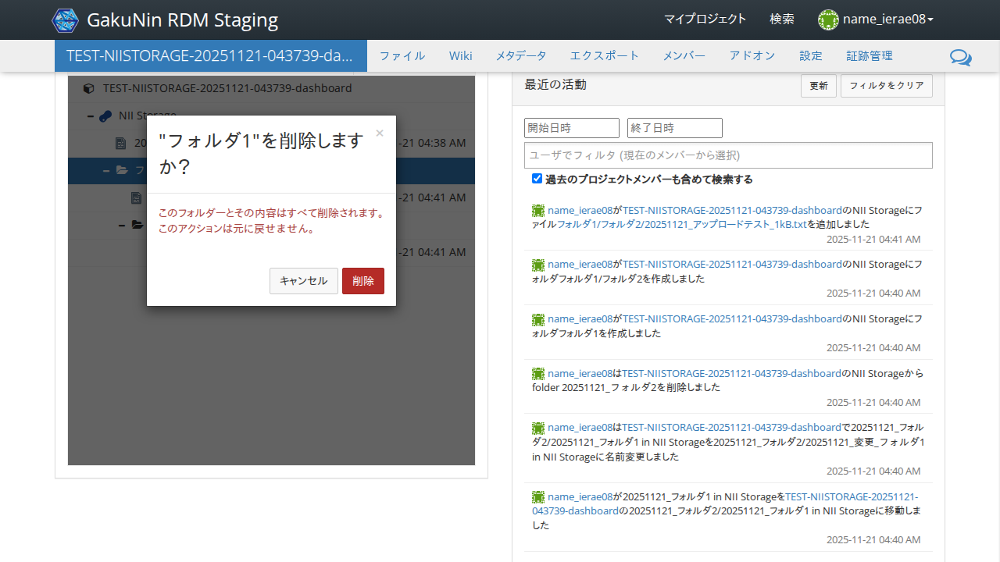

In [90]:
async def _step(page):
    await page.locator('//i[contains(@class, "fa-trash")]/../*[text() = "フォルダを削除"]').click()
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[contains(@class, "btn-danger")]').scroll_into_view_if_needed()
    await expect(page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[contains(@class, "btn-danger")]')).to_be_enabled(timeout=transition_timeout)

await run_pw(_step)

## ダイアログから「削除」をクリックする

ファイル一覧のツリーからフォルダ1とその下のツリーが消えること

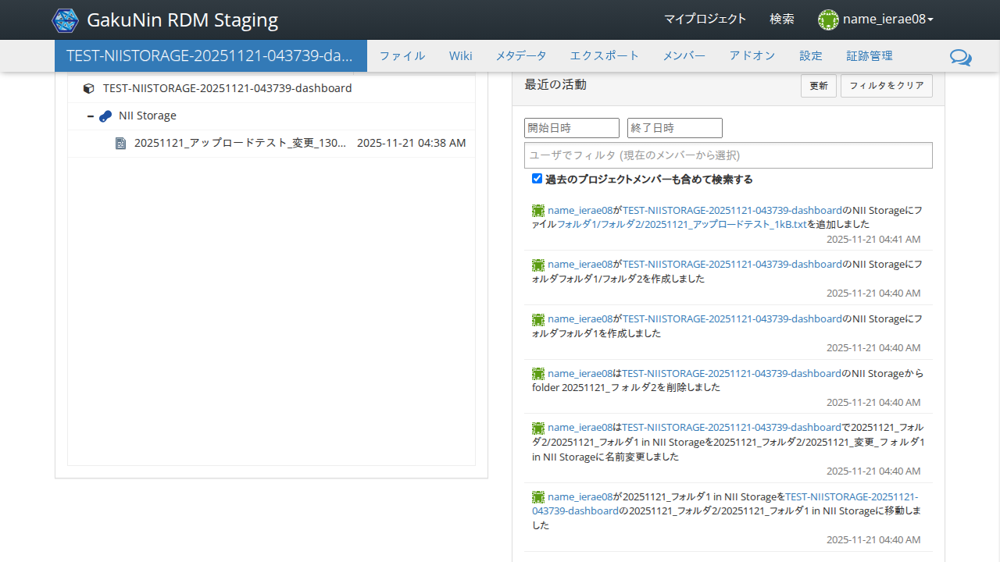

In [91]:
foldername = f'フォルダ1'
async def _step(page):
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[contains(@class, "btn-danger")]').click()
    await expect(grdm.get_select_folder_title_locator(page, foldername)).to_have_count(0, timeout=transition_timeout)
    time.sleep(1)

await run_pw(_step)

## 先にダウンロードした「フォルダ2.zip」をローカルに展開する

In [ ]:
!ls -la {work_dir}/downloaded
!cd {work_dir}/downloaded && unzip -o {yyyymmdd}_フォルダ2.zip
!ls -la {work_dir}/downloaded

## ファイル一覧の対象ストレージ名の行をクリックする

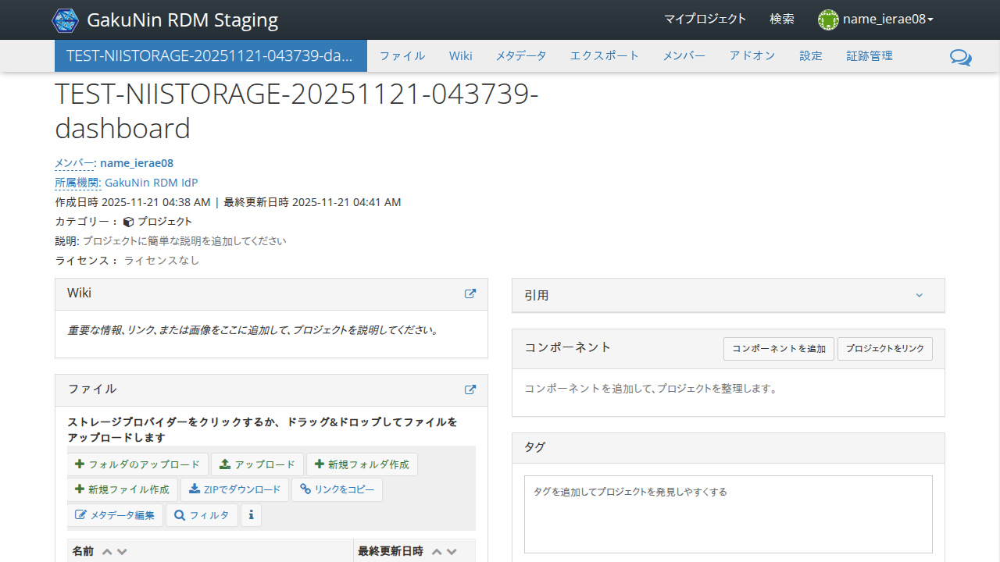

In [ ]:
async def _step(page):
    await grdm.get_select_storage_title_locator(page, target_storage_name).click()
    await page.locator('//i[contains(@class, "fa-plus")]/../*[text() = "フォルダのアップロード"]').scroll_into_view_if_needed()
    await expect(page.locator('//i[contains(@class, "fa-plus")]/../*[text() = "フォルダのアップロード"]')).to_be_enabled()

await run_pw(_step)

## 「フォルダのアップロード」ボタンを押下する

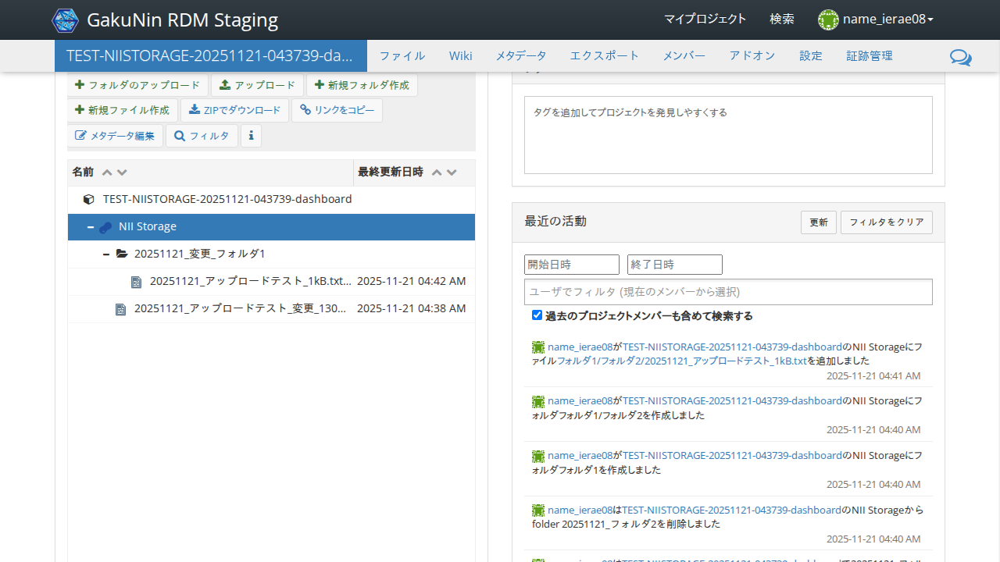

In [94]:
# import scripts.grdm
# importlib.reload(scripts.grdm)

async def _step(page):
    foldername = f'{yyyymmdd}_変更_フォルダ1'
    folderpath = os.path.join(work_dir, 'downloaded', foldername)
    await grdm.upload_folder(page, folderpath)
    time.sleep(1)

    await expect(page.locator(f'//*[@role = "progressbar"]')).to_have_count(0, timeout=transition_timeout)
    await expect(grdm.get_select_folder_title_locator(page, foldername)).to_be_visible(timeout=transition_timeout)
    await grdm.get_select_file_title_locator(page, f'{yyyymmdd}_アップロードテスト_1kB.txt').scroll_into_view_if_needed()
    await expect(grdm.get_select_file_title_locator(page, f'{yyyymmdd}_アップロードテスト_1kB.txt')).to_be_visible(timeout=transition_timeout)
    time.sleep(1)

await run_pw(_step)

## (拡張ストレージ名を設定した場合) 拡張ストレージのファイル一覧から「変更-ファイル(130MB)」のファイル名部分をクリックする
- 詳細表示の画面に遷移し、「変更-ファイル(130MB)」の内容が表示されること
- タイムスタンプエラーが発生しないこと

※ 200 KiB より大きいファイルは詳細情報の表示はできない  
※ タイムスタンプエラーが発生した場合は、画面の証跡を記録した上で、「タイムスタンプを打つ」を押して、タイムスタンプエラーが解消するか確認すること

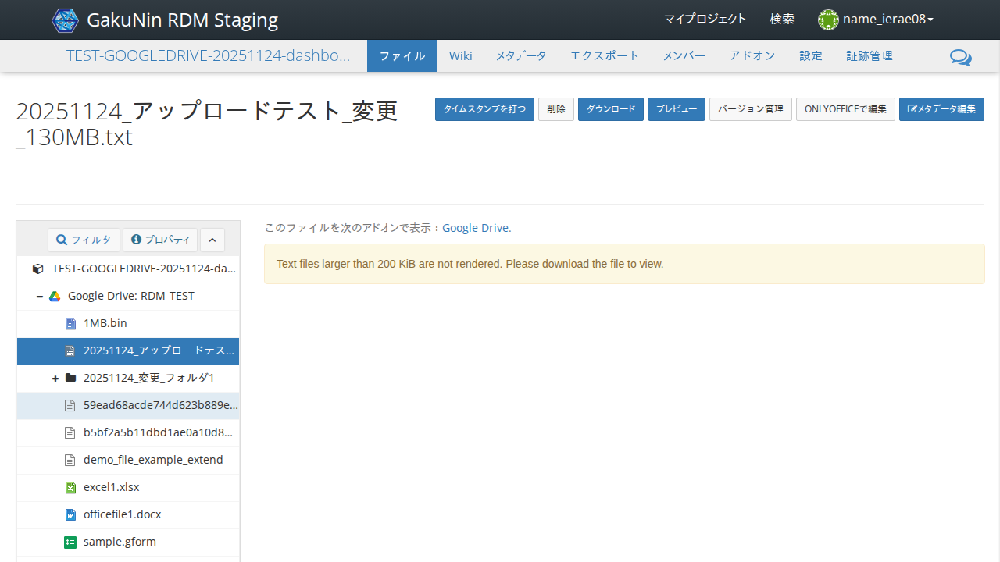

In [ ]:
filename_move = f'{yyyymmdd}_アップロードテスト_変更_130MB.txt'

async def _step(page):
    if skip_130mb_upload or target_storage_name == 'NII Storage' or target_storage_id == 'osfstorage':
        return

    await grdm.go_to_file_detail(page, filename_move, work_dir)

await run_pw(_step)

## (拡張ストレージ名を設定した場合) 以下の手順を実施し、ファイルを移動する  
・ファイル一覧から「変更-ファイル(130MB)」の行をクリックしたままマウスカーソルを移動させる  
・ドラッグ状態の「変更-ファイル(130MB)」を「NII Storage」の行まで移動させマウスボタンを離す

以下を確認すること  
・「変更-ファイル(130MB)」がドラッグアイテムになること  
・「変更-ファイル(130MB)」の表示行が、「NII Storage」の下のツリーに移動すること

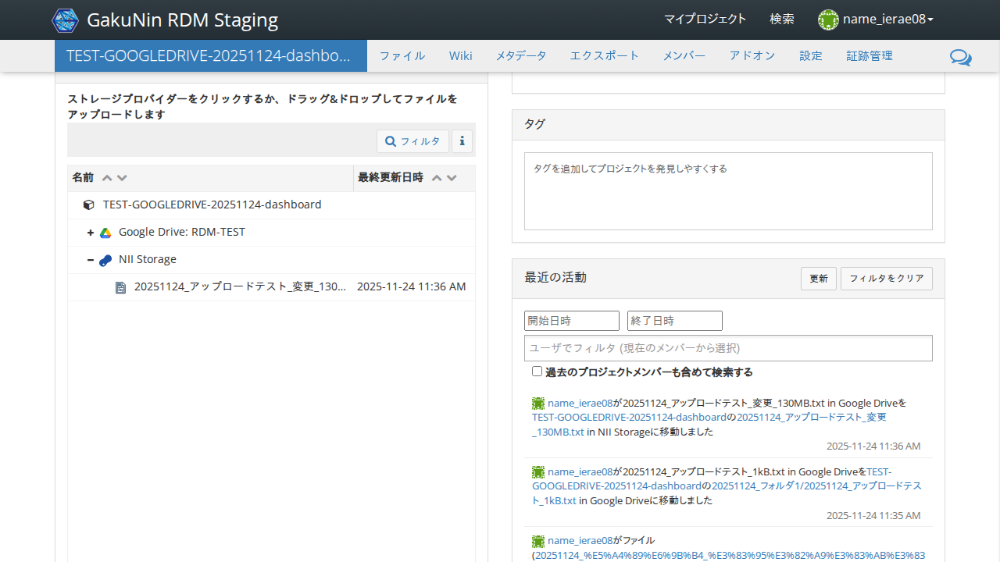

In [ ]:
async def _step(page):
    if skip_130mb_upload or target_storage_name == 'NII Storage' or target_storage_id == 'osfstorage':
        return

    # Back to file list screen
    await grdm.back_to_file_list_screen(page, target_storage_name, target_file_view)

    # Move file from extend storage to NII storage
    await grdm.move_file_to_storage(page, 'NII Storage', filename_move)

await run_pw(_step)

## (拡張ストレージ名を設定した場合) 「NII Storage」のファイル一覧から「変更-ファイル(130MB)」のファイル名部分をクリックする

- 詳細表示の画面に遷移し、「変更-ファイル(130MB)」の内容が表示されること
- タイムスタンプエラーが発生しないこと

※ 200 KiB より大きいファイルは詳細情報の表示はできない  
※ タイムスタンプエラーが発生した場合は、画面の証跡を記録した上で、「タイムスタンプを打つ」を押して、タイムスタンプエラーが解消するか確認すること

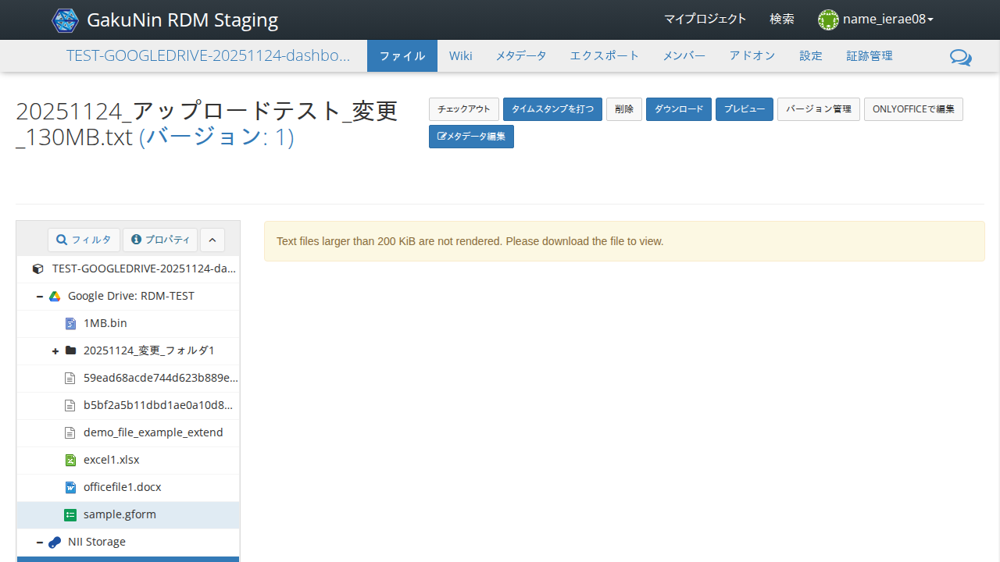

In [ ]:
async def _step(page):
    if skip_130mb_upload or target_storage_name == 'NII Storage' or target_storage_id == 'osfstorage':
        return

    await grdm.go_to_file_detail(page, filename_move, work_dir)

await run_pw(_step)

## (拡張ストレージ名を設定した場合) 以下の手順を実施し、ファイルを移動する
- 「NII Storage」のファイル一覧から「変更-ファイル(130MB)」の行をクリックしたままマウスカーソルを移動させる
- ドラッグ状態の「変更-ファイル(130MB)」を拡張ストレージの行まで移動させマウスボタンを離す

以下を確認すること
- 「変更-ファイル(130MB)」がドラッグアイテムになること
- 「変更-ファイル(130MB)」の表示行が、拡張ストレージの下のツリーに移動すること

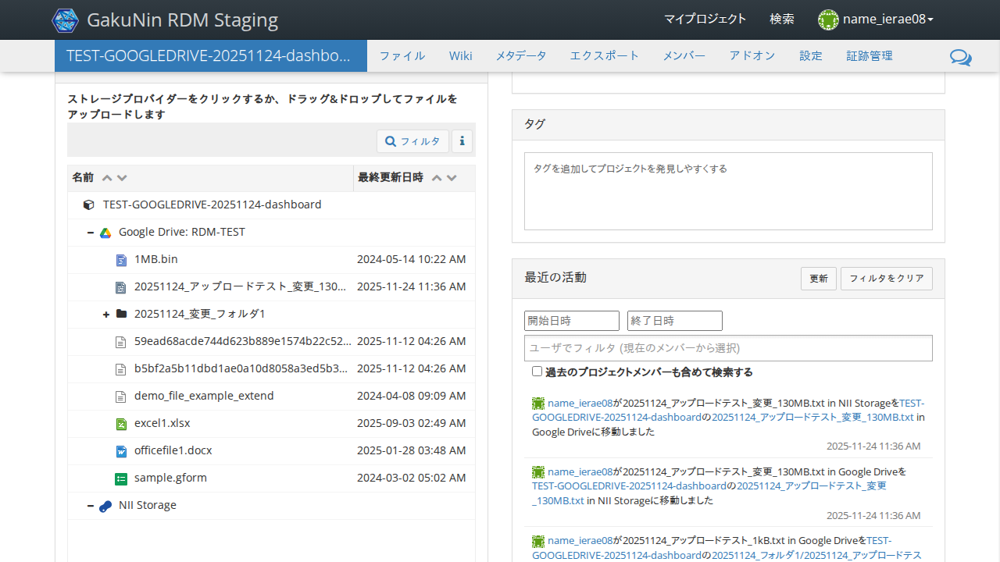

In [ ]:
async def _step(page):
    if skip_130mb_upload or target_storage_name == 'NII Storage' or target_storage_id == 'osfstorage':
        return

    # Back to file list screen
    await grdm.back_to_file_list_screen(page, target_storage_name, target_file_view)

    # Move file from NII storage to extend storage
    await grdm.move_file_to_storage(page, target_storage_name, filename_move)

await run_pw(_step)

## (拡張ストレージ名を設定した場合) 拡張ストレージのファイル一覧から「変更-ファイル(130MB)」のファイル名部分をクリックする

- 詳細表示の画面に遷移し、「変更-ファイル(130MB)」の内容が表示されること
- タイムスタンプエラーが発生しないこと

※ 200 KiB より大きいファイルは詳細情報の表示はできない  
※ タイムスタンプエラーが発生した場合は、画面の証跡を記録した上で、「タイムスタンプを打つ」を押して、タイムスタンプエラーが解消するか確認すること

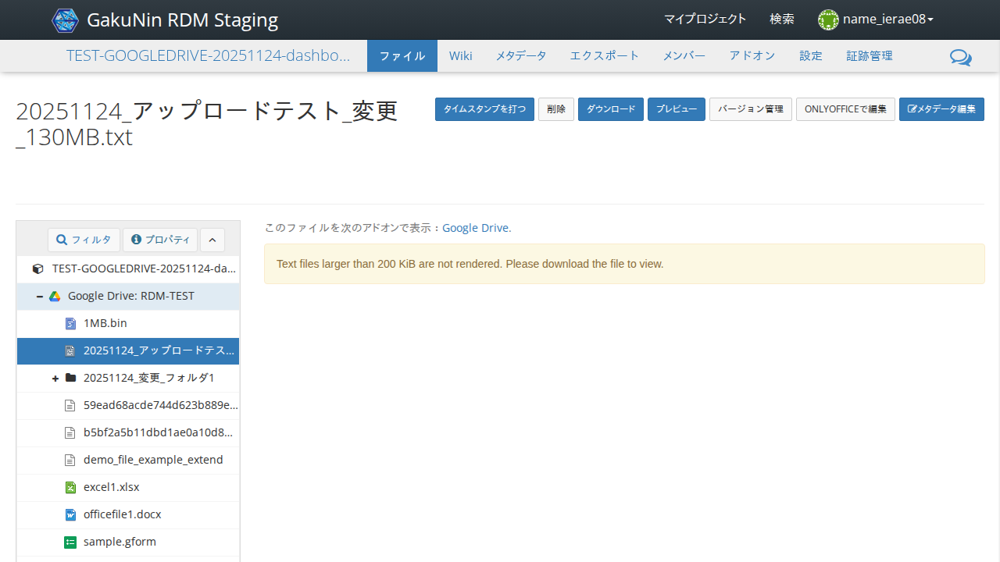

In [ ]:
async def _step(page):
    if skip_130mb_upload or target_storage_name == 'NII Storage' or target_storage_id == 'osfstorage':
        return

    await grdm.go_to_file_detail(page, filename_move, work_dir)

await run_pw(_step)

## ファイル一覧から「ファイル(130MB)」の行のファイル名以外の部分をクリックする

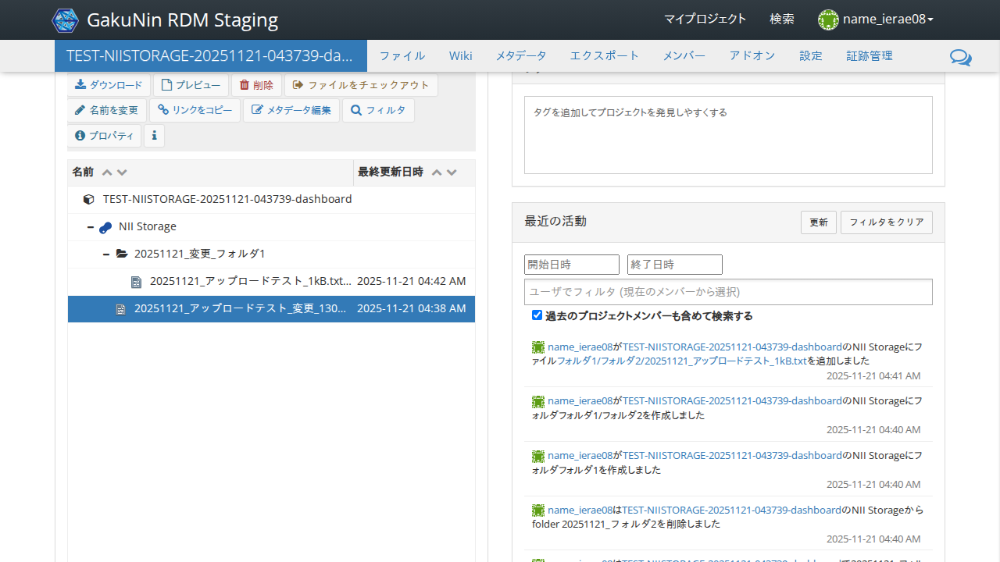

In [ ]:
filename = f'{yyyymmdd}_アップロードテスト_変更_130MB.txt'

async def _step(page):
    if skip_130mb_upload:
        return

    # Back to file list screen
    if target_storage_name != 'NII Storage' and target_storage_id != 'osfstorage':
        await grdm.back_to_file_list_screen(page, target_storage_name, target_file_view)

    await expect(grdm.get_select_file_title_locator(page, filename)).to_be_visible(timeout=transition_timeout*2)
    await grdm.get_select_file_extension_locator(page, filename).click()

    await expect(page.locator('//i[contains(@class, "fa-trash")]/../*[text() = "削除"]')).to_be_enabled()

await run_pw(_step)

## ファイル一覧の上部メニューから「削除」をクリックする

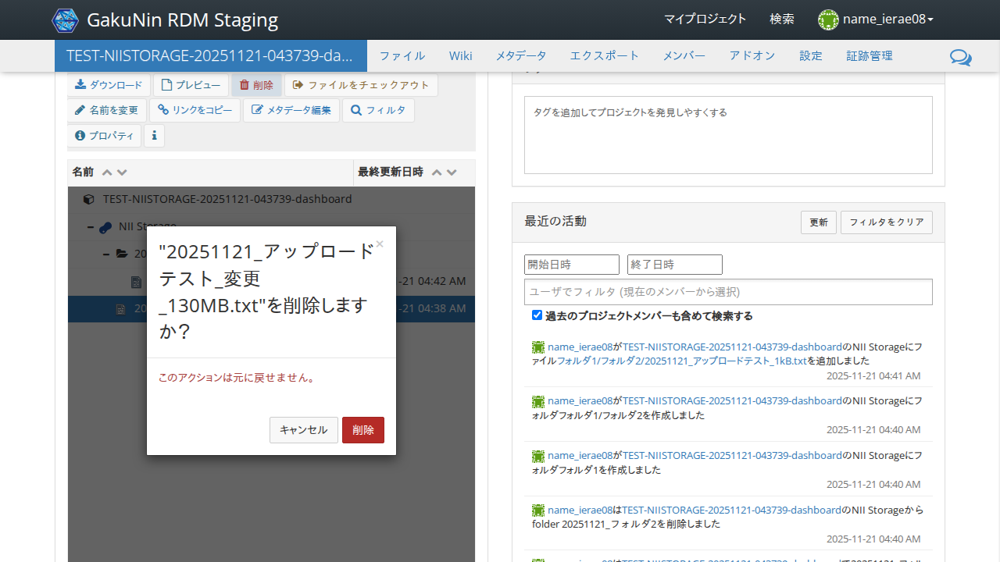

In [ ]:
async def _step(page):
    if skip_130mb_upload:
        return
    await page.locator('//i[contains(@class, "fa-trash")]/../*[text() = "削除"]').click()
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[contains(@class, "btn-danger")]').scroll_into_view_if_needed()
    await expect(page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[contains(@class, "btn-danger")]')).to_be_enabled(timeout=transition_timeout)
    time.sleep(1)

await run_pw(_step)

## ダイアログから「削除」をクリックする

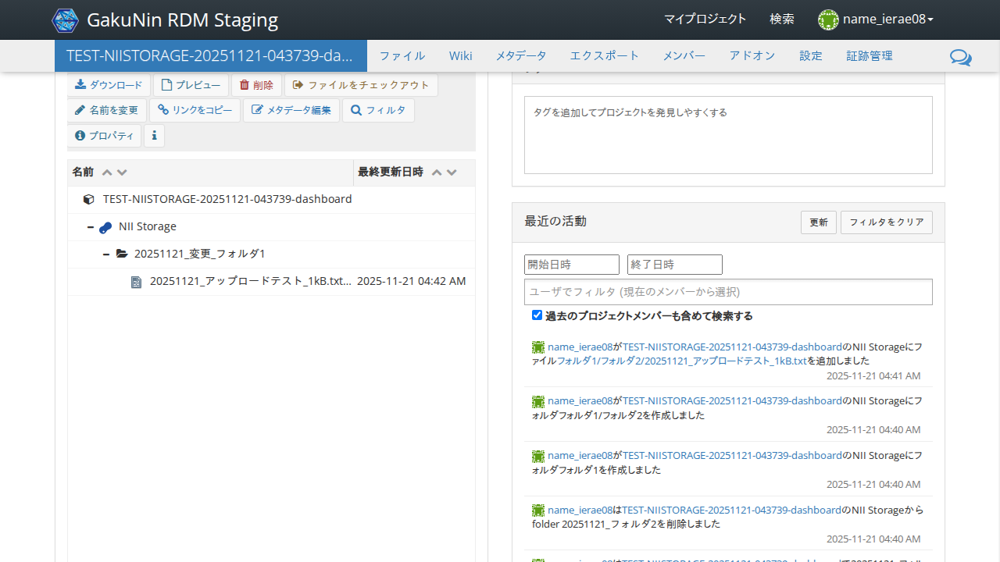

In [ ]:
async def _step(page):
    if skip_130mb_upload:
        return
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[contains(@class, "btn-danger")]').click()
    await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(0, timeout=transition_timeout)
    time.sleep(1)

await run_pw(_step)

## 「yyyymmdd_変更_フォルダ1」を削除する

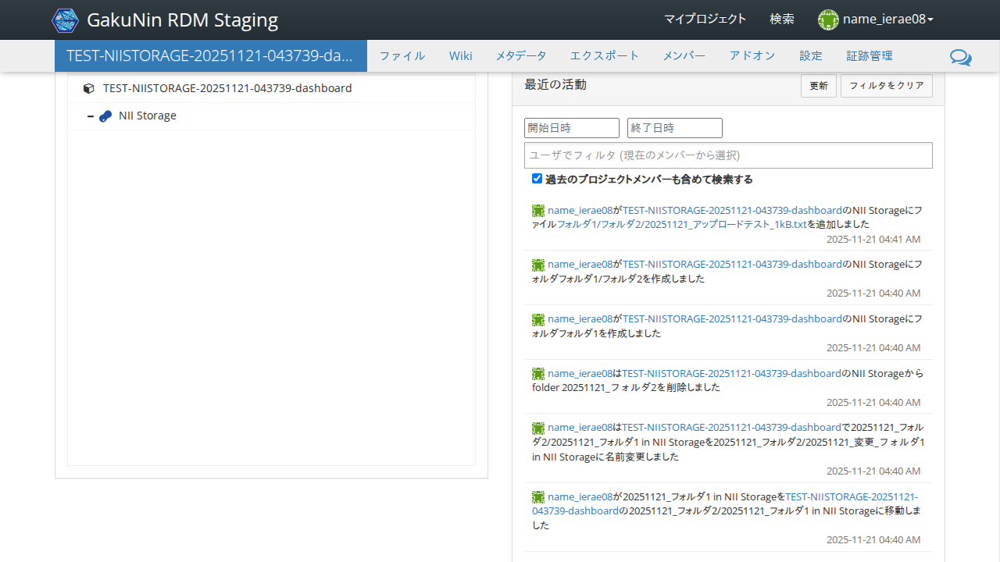

In [ ]:
new_foldername = f'{yyyymmdd}_変更_フォルダ1'

async def _step(page):
    await expect(grdm.get_select_folder_title_locator(page, new_foldername)).to_be_visible(timeout=transition_timeout)
    await grdm.get_select_folder_title_locator(page, new_foldername).click()

    await page.locator('//i[contains(@class, "fa-trash")]/../*[text() = "フォルダを削除"]').click()
    await expect(page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[contains(@class, "btn-danger")]')).to_be_enabled(timeout=transition_timeout)
    await page.locator('//*[@id = "tb-tbody"]//*[@class = "modal-content"]//*[contains(@class, "btn-danger")]').click()
    await expect(grdm.get_select_folder_title_locator(page, new_foldername)).to_have_count(0, timeout=transition_timeout)
    time.sleep(1)

await run_pw(_step)

## ファイル一覧の対象ストレージの上に動画ファイル.webmをドロップする

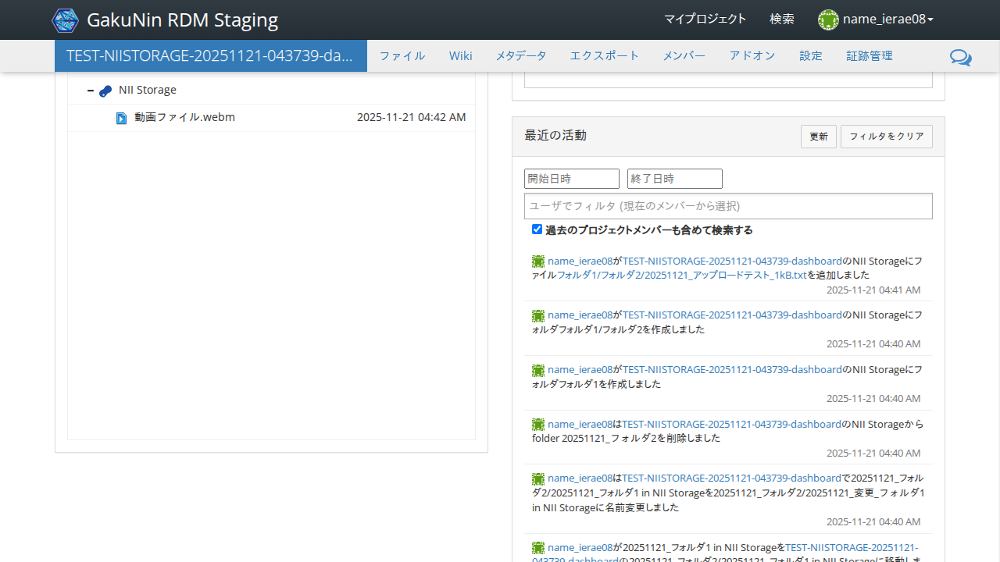

In [ ]:
filename = "動画ファイル.webm"
filepath = os.path.join('resources', filename)

async def _step(page):
    try:
        await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(0)
    except:
        print('Skipped: おそらくすでにファイルがあります。無視します。')
        traceback.print_exc()
        return

    dropzone = grdm.get_select_storage_title_xpath(target_storage_name)
    await grdm.drop_file(page, dropzone, filepath)
    time.sleep(2)

    await expect(page.locator(f'//*[text() = "{filename}"]/../following-sibling::*//*[@role = "progressbar"]')).to_have_count(0, timeout=transition_timeout)
    await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(1, timeout=transition_timeout)

await run_pw(_step)

## ファイル一覧から「動画ファイル.webm」の行のファイル名部分をクリックする。

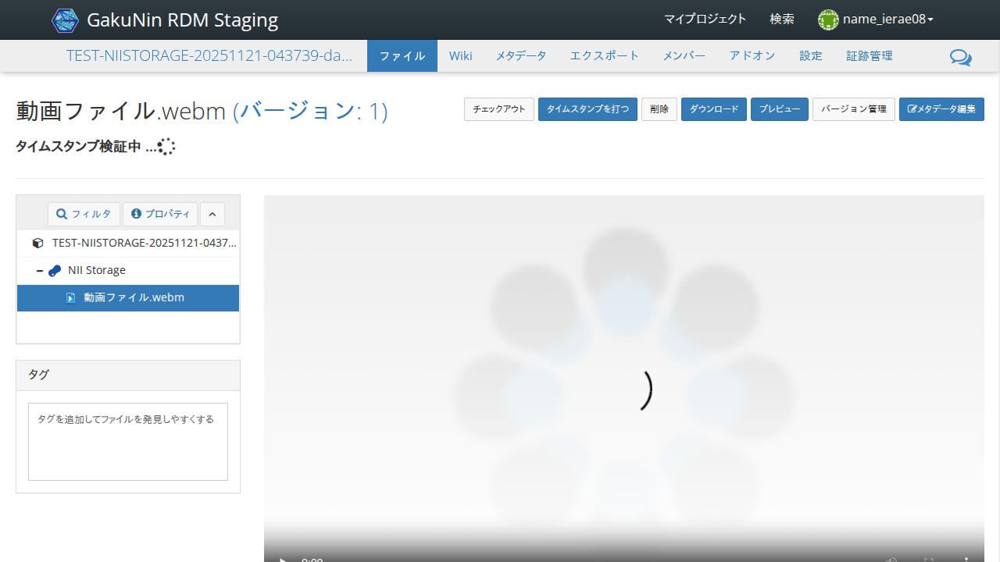

In [ ]:
async def _step(page):
    await grdm.get_select_file_title_locator(page, filename).click(timeout=transition_timeout)

    if skip_preview_check:
        return
    video = page.locator(f'//iframe[contains(@src, "/render")]').content_frame.locator('//video')
    await expect(video).to_be_visible(timeout=transition_timeout * 5)

await run_pw(_step)

## 動画プレイヤーの「再生」ボタンを押下する。



In [ ]:
import asyncio

async def _step(page):
    # https://chatgpt.com/share/67e7947d-8cac-8003-b341-128bac89612f
    # Use locator instead of query_selector for better reliability
    iframe_locator = page.locator(f'//iframe[contains(@src, "/render")]')
    await iframe_locator.wait_for(state="attached", timeout=10000)
    iframe_element = await iframe_locator.element_handle()
    inner_frame = await iframe_element.content_frame()
    VIDEO_SELECTOR = "video"

    if target_storage_name == 'OneDrive':
        # TODO
        print('OneDriveでは失敗するようであるため、暫定的にスキップします。')
        return
    if skip_preview_check:
        return
    await inner_frame.eval_on_selector(
        "video", 
        "(el) => el.scrollIntoView({ behavior: 'smooth', block: 'center' })"
    )
    await asyncio.sleep(1) 
    await inner_frame.evaluate('document.querySelector("video").play()')
    
    # 10秒間動画再生
    current_time = 0
    retries = 241
    while current_time < 241 and retries > 0:
        current_time = await inner_frame.evaluate('document.querySelector("video").currentTime')
        print(current_time)
        await asyncio.sleep(1)
        retries -= 1
    assert current_time >= 241, f'動画再生に失敗しました: current time={current_time} seconds'

await run_pw(_step)

## 「削除」を押下する

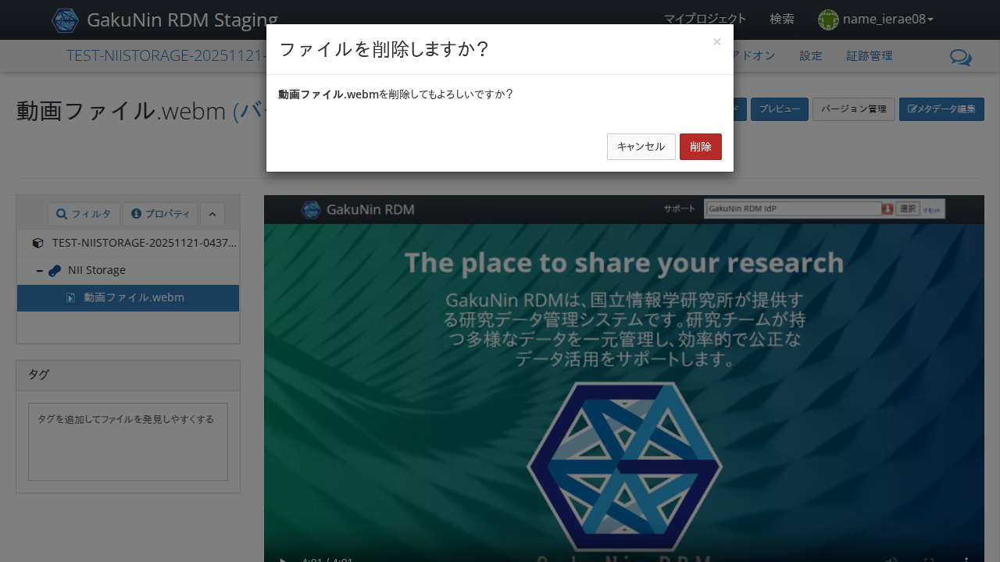

In [ ]:
async def _step(page):
    delete_button_locator = page.locator('//button[contains(@class, "file-delete")]')
    await expect(delete_button_locator).to_be_enabled()

    await delete_button_locator.click()

    await expect(page.locator('//button[@data-bb-handler="confirm" and contains(@class, "btn-danger")]')).to_be_enabled(timeout=transition_timeout)
    time.sleep(1)

await run_pw(_step)

## 「削除」を押下する

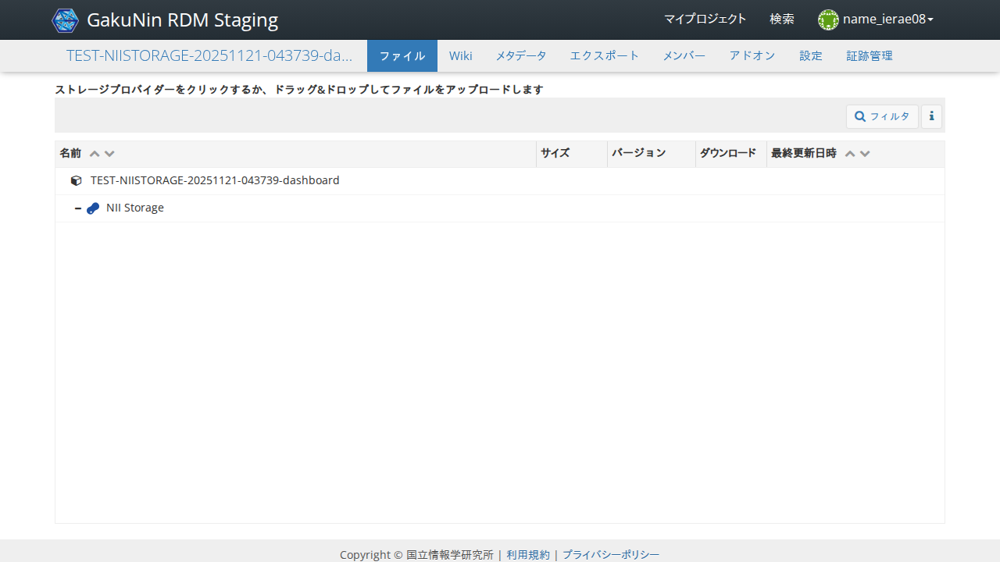

In [ ]:
async def _step(page):
    await page.locator('//button[@data-bb-handler="confirm" and contains(@class, "btn-danger")]').click()

    # プレビューページからの切り替わりを検出    
    await expect(page.locator('//iframe[contains(@src, "/render")]')).to_have_count(0, timeout=transition_timeout)

    # ファイルビューを待つ
    await expect(grdm.get_select_storage_title_locator(page, target_storage_name)).to_be_visible(timeout=transition_timeout)
    await expect(grdm.get_select_file_title_locator(page, filename)).to_have_count(0)
    time.sleep(1)

await run_pw(_step)

## (指定がある場合) プロジェクトを削除する

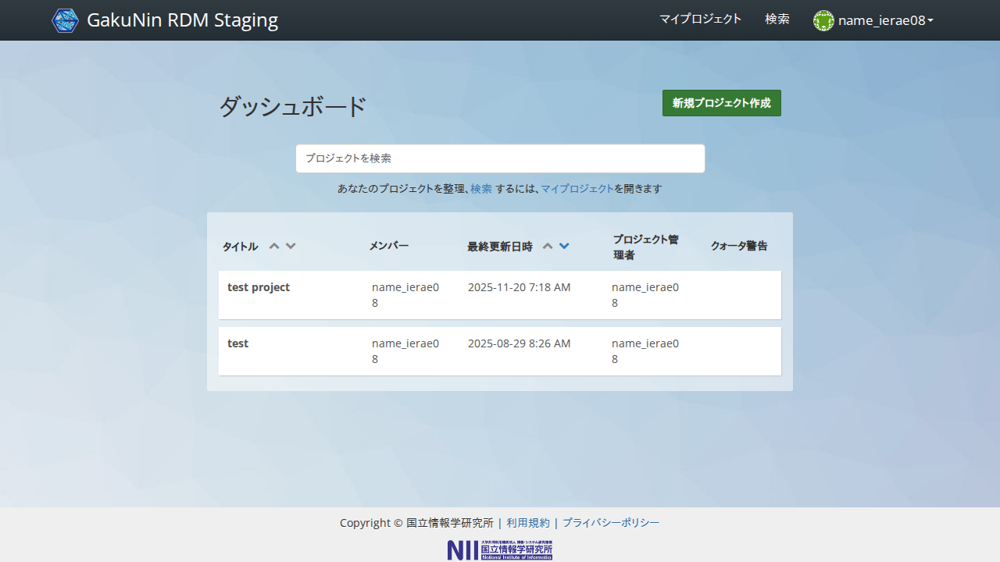

In [ ]:
async def _step(page):
    if not delete_project:
        return
    await scripts.grdm.delete_project(page)

    await scripts.grdm.expect_dashboard(page, transition_timeout=transition_timeout)

await run_pw(_step)

## ユーザーメニューから「ログアウト」を選択する

GRDMトップページが表示されること

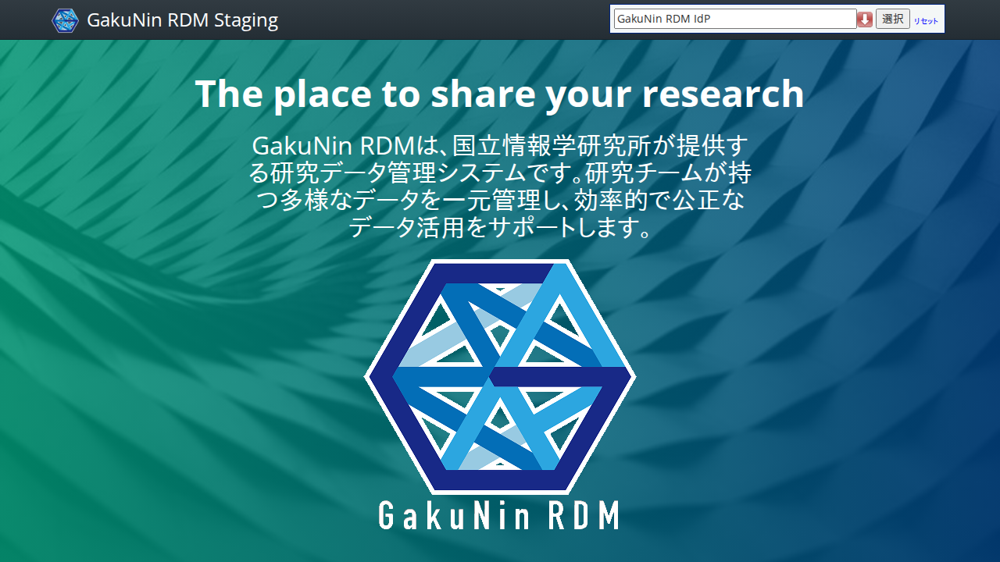

In [ ]:
async def _step(page):
    await page.locator(f'//div[@class = "nav-profile-name"]').click()
    await page.locator('//*[contains(@class, "logoutLink")]').click()

    if idp_name_1 == 'FakeCAS':
        # FakeCASの場合はサインインボタンを確認
        await expect(page.locator('//button[@data-test-sign-in-button]')).to_be_visible(timeout=transition_timeout)
    elif idp_name_1 is not None:
        # 通常のIdPの場合はdropdown_imgを確認
        await expect(page.locator('//*[@id = "dropdown_img"]')).to_be_visible(timeout=transition_timeout)
    else:
        # CASの場合はログインボタンを確認
        await expect(page.locator('//button[text() = "ログイン"]')).to_be_visible(timeout=transition_timeout)

await run_pw(_step)

終了処理を実施。

In [ ]:
await finish_pw_context()

In [ ]:
!rm -fr {work_dir}